## Import

In [3]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [4]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [5]:
pre_path = "../../../../../../../"
physical_model = "PARSEC"
path_to_data = pre_path + "data/PARSEC/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_quantile"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["label"]

In [6]:
override = True
use_preds = False
save = True
show = True
scaler_name = "quantile"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading PARSEC dataframe from PARSEC_rescaled_iso_full_data.csv file...


,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.00000,3.4744,2.965,0.0,-0.25,0.090,0.213783
1,5.00000,3.4752,2.963,0.0,-0.25,0.092,0.219060
2,5.00000,3.4780,2.956,0.0,-0.25,0.098,0.236789
3,5.00000,3.4789,2.954,0.0,-0.25,0.100,0.242293
4,5.00000,3.4819,2.950,0.0,-0.25,0.106,0.257918
...,...,...,...,...,...,...,...
681298,10.25002,3.4812,0.032,7.0,0.50,0.801,2.156549
681299,10.25002,3.4776,-0.004,7.0,0.50,0.801,2.175802
681300,10.25002,3.4742,-0.038,7.0,0.50,0.800,2.194514
681301,10.25002,3.4701,-0.077,7.0,0.50,0.800,2.215902


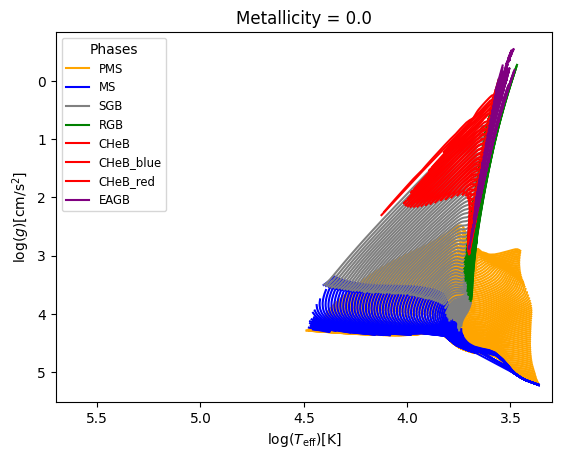

In [7]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['logAge', 'logTe', 'logg', 'label', 'metallicity', 'Mass', 'Rpol'], 
                              physical_model, rescale=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.60000,4.4269,4.356,1.0,-0.25,9.714,0.535041
1,5.65000,4.4266,4.355,1.0,-0.25,9.714,0.535800
2,5.70000,4.4263,4.353,1.0,-0.25,9.714,0.536558
3,5.75000,4.4061,4.358,1.0,-0.25,8.856,0.514282
4,5.75000,4.4260,4.352,1.0,-0.25,9.714,0.537441
...,...,...,...,...,...,...,...
321691,10.25002,3.6561,2.334,4.0,0.50,0.805,1.005181
321692,10.25002,3.6560,2.333,4.0,0.50,0.805,1.005609
321693,10.25002,3.6559,2.331,4.0,0.50,0.805,1.006466
321694,10.25002,3.6558,2.330,4.0,0.50,0.805,1.006894


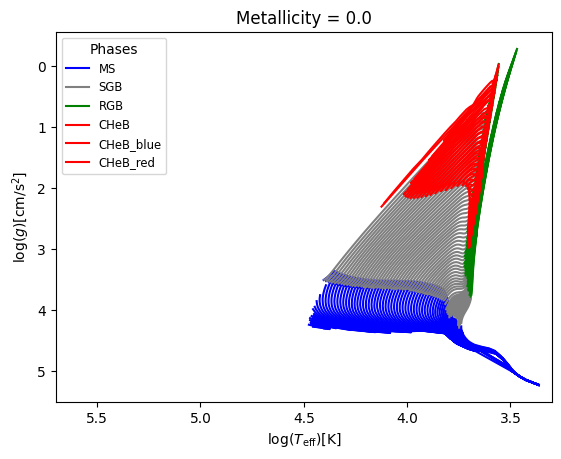

In [8]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'label':[1, 2, 3, 4, 5, 6]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [9]:
print_all_uniques(phase_filtered_iso_df)

logAge  : Range : 5.3 - 10.25, Mean : 9.0428, Median : 9.3

logTe  : Range : 3.36 - 4.5177, Mean : 3.7779, Median : 3.721

logg  : Range : -0.38 - 5.345, Mean : 2.7607, Median : 2.486

Values in label column : 1.0, 2.0, 3.0, 4.0, 5.0, 6.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.25, -2.5, -2.75, 0.0, 0.25, 0.5 

Mass  : Range : 0.09 - 13.952, Mean : 2.6725, Median : 1.428

Rpol  : Range : -0.98 - 2.8373, Mean : 0.9648, Median : 1.0158



In [10]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['logAge', 'metallicity', 'Mass'], 
                               y_cols=['logTe', 'logg', 'Rpol'], categories_cols=['label'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the logTe parameter : 3.3621 - 4.5177
Median value in train data for the logTe parameter: 3.721
Mean value in train data for the logTe parameter: 3.777965141417156

Range in train data for the logg parameter : -0.384 - 5.345
Median value in train data for the logg parameter: 2.486
Mean value in train data for the logg parameter: 2.761182341921151

Range in train data for the Rpol parameter : -0.9763360818022064 - 2.8372727025023003
Median value in train data for the Rpol parameter: 1.015778756389041
Mean value in train data for the Rpol parameter: 0.9646120024510401

Testing set statistics:
Range in test data for the logTe parameter : 3.3622 - 4.5177
Median value in test data for the logTe parameter: 3.721
Mean value in test data for the logTe parameter: 3.777738115487914

Range in test data for the logg parameter : -0.347 - 5.345
Median value in test data for the logg parameter: 2.486
Mean value in test data for the logg parameter: 2.75

## Model training

### Linear regression

In [11]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.45937526068733014
  RMSE :  0.2451169632113668
  MAE :  0.19772848132470033
  MedAE :  0.1363476925982876
  CORR :  0.7976581642440426
  MAX_ER :  0.5911322868188349
  Percentiles : 
    75th percentile :  0.2938754255741125
    90th percentile :  0.4421385934503512
    95th percentile :  0.4930211028063779
    99th percentile :  0.5521042619128236

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.23489224869810155
  RMSE :  0.16093590598231294
  MAE :  0.12522050221011924
  MedAE :  0.09889888914987521
  CORR :  0.48522666701395173
  MAX_ER :  0.5287028436414665
  Percentiles : 
    75th percentile :  0.17260339607279118
    90th percentile :  0.27109488058666203
    95th percentile :  0.34136450444189254
    99th

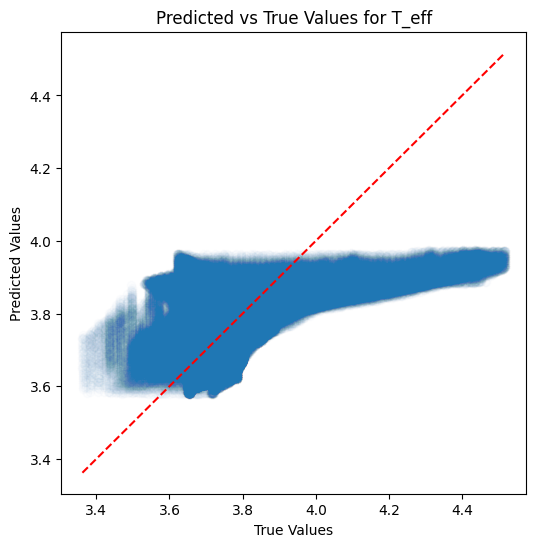

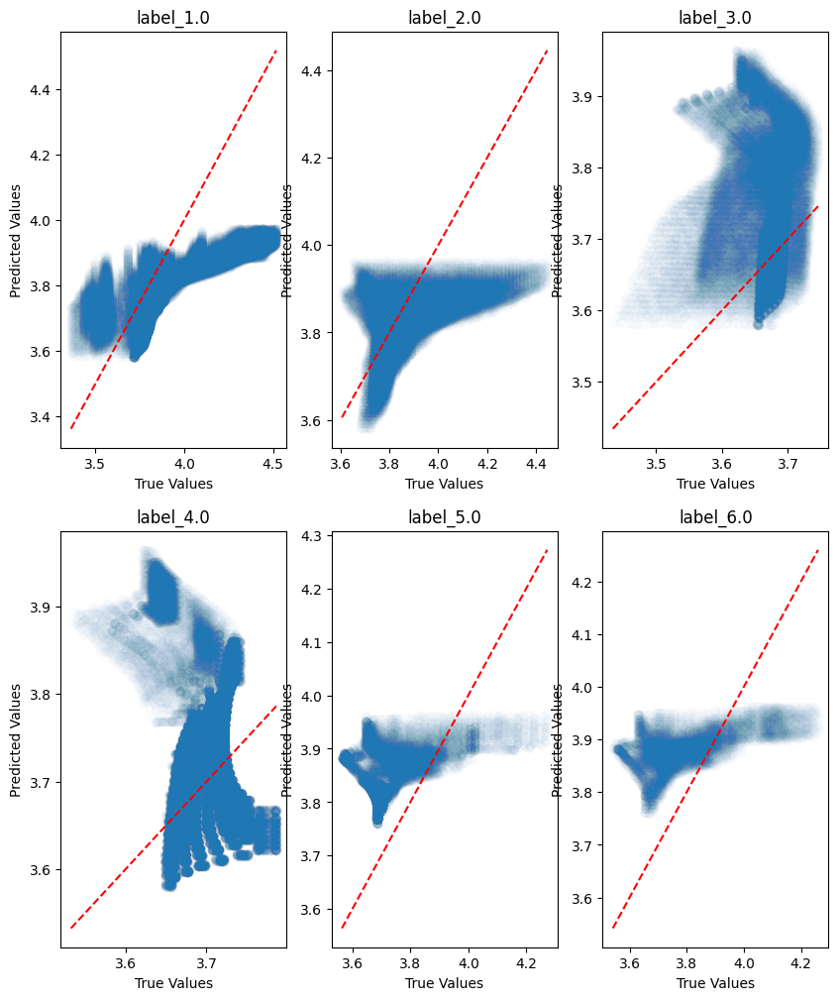

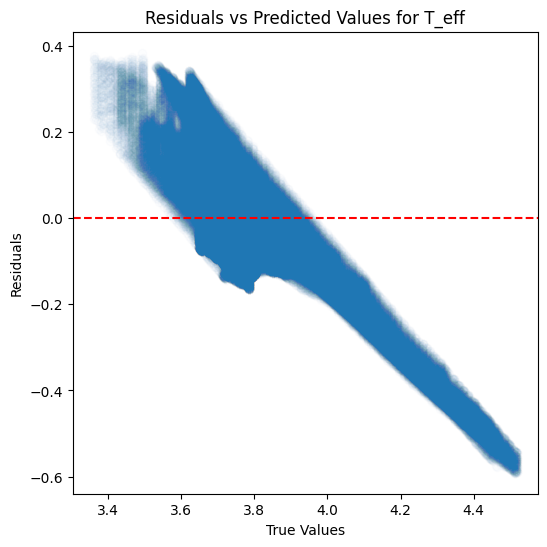

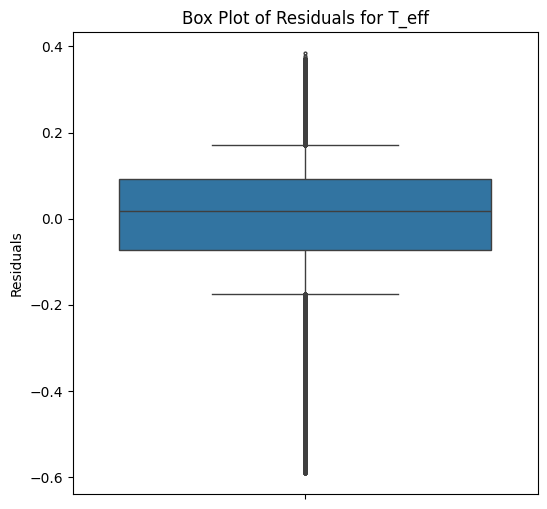

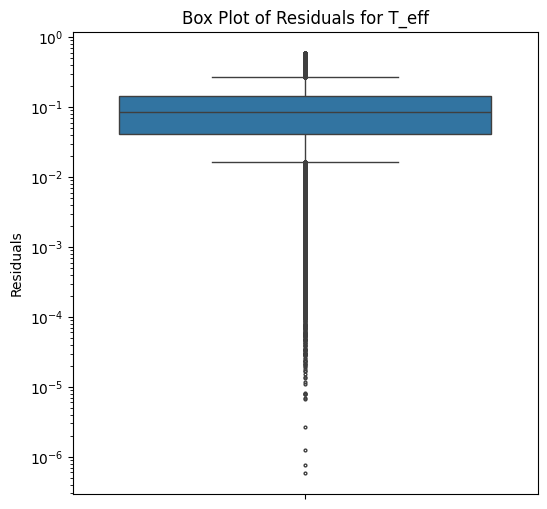

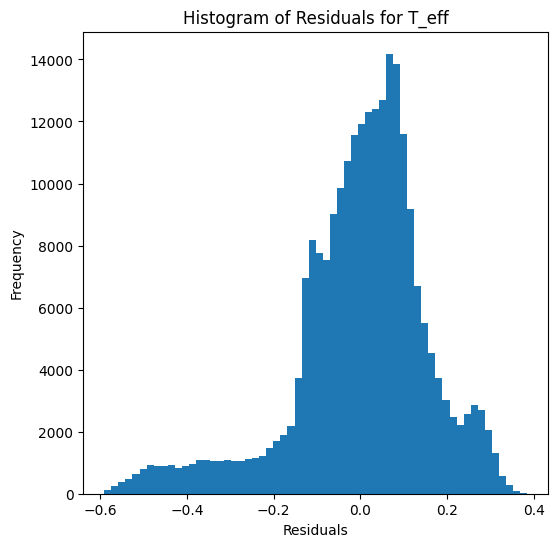

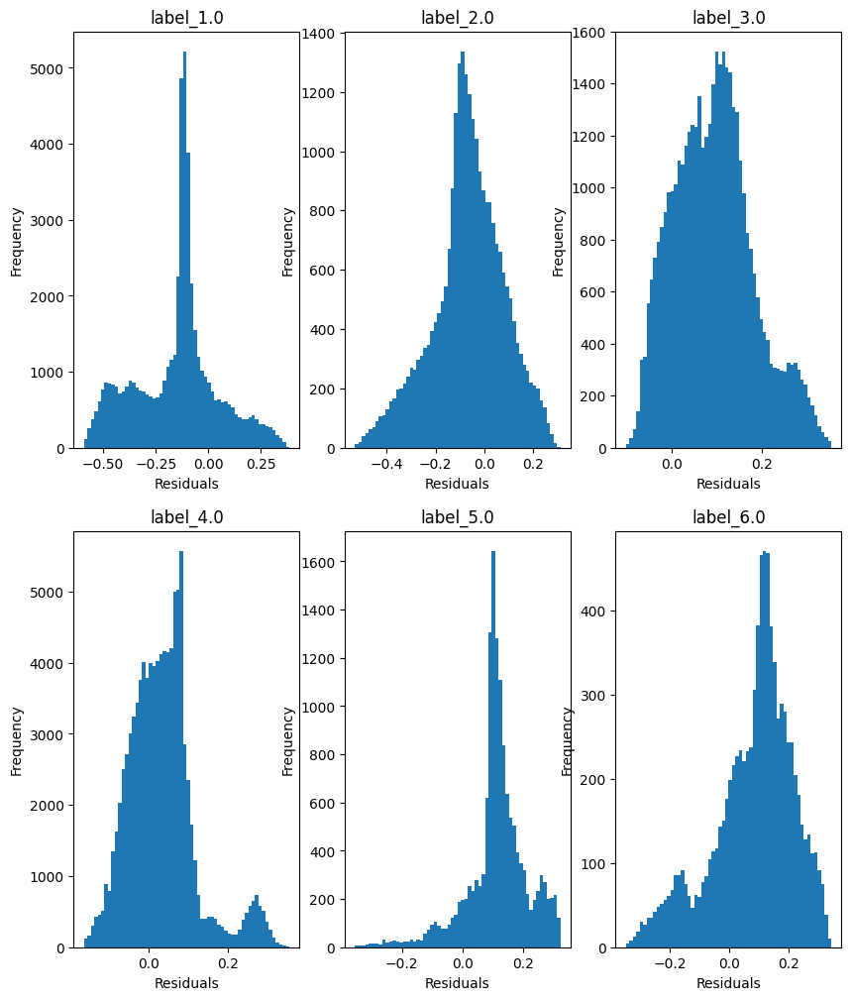

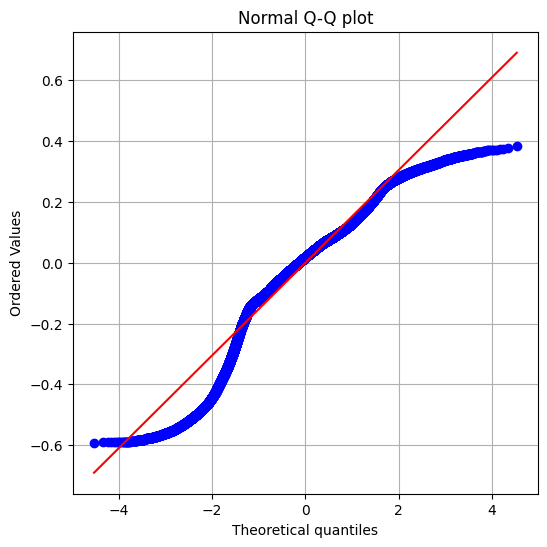

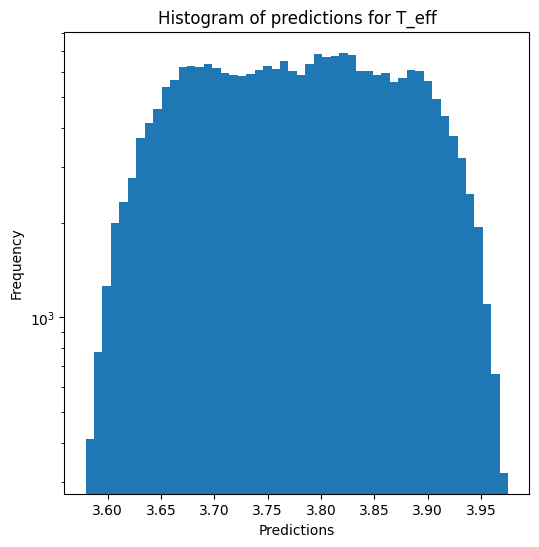

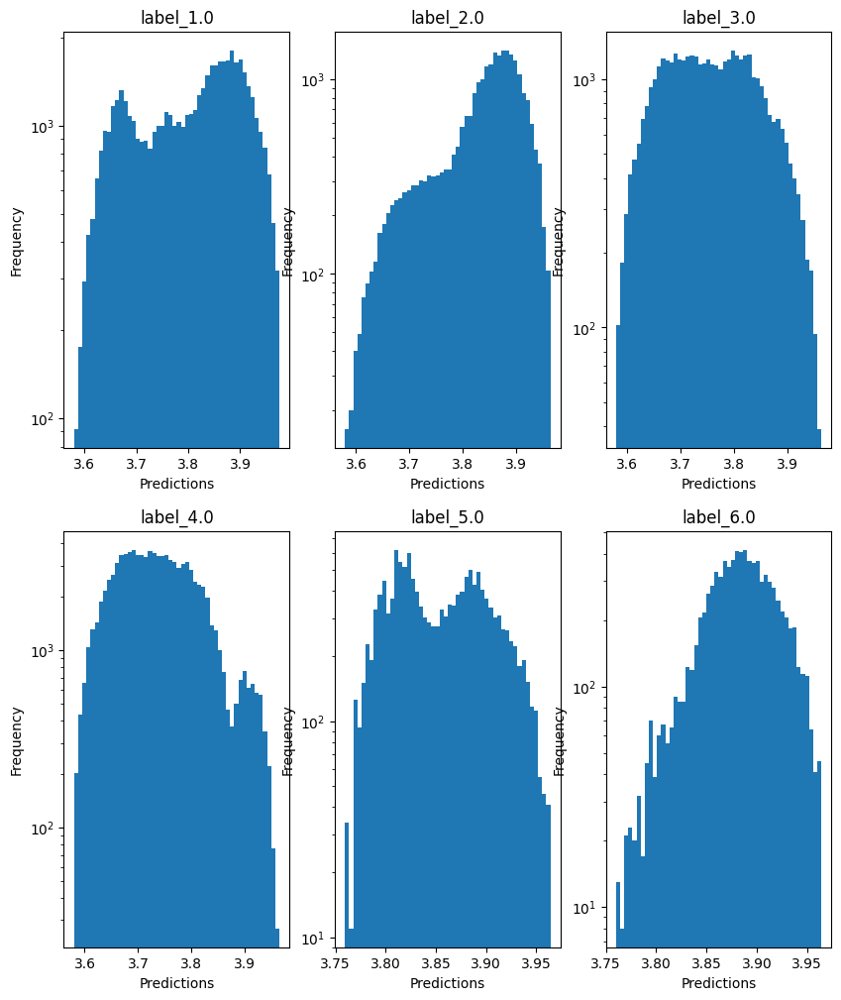

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -3.6270418073665764
  RMSE :  1.2735286226147822
  MAE :  1.1884694370528703
  MedAE :  1.2822133252892673
  CORR :  0.6855071267070832
  MAX_ER :  2.4724980506150276
  Percentiles : 
    75th percentile :  1.5098648813150675
    90th percentile :  1.6869778002858333
    95th percentile :  1.7828728541922967
    99th percentile :  1.979677689896901

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.13016338408501127
  RMSE :  0.8988454907730443
  MAE :  0.7925817715535963
  MedAE :  0.8124089525157774
  CORR :  0.4236216845709691
  MAX_ER :  2.0035253937382853
  Percentiles : 
    75th percentile :  1.1207018838695397
    90th percentile :  1.3439983621438023
    95th percentile :  1.4629377075284702
    99th percentile :  1.6547159647203171

log_g results for the label category with a value of 3.0
  value range :  -0.384 

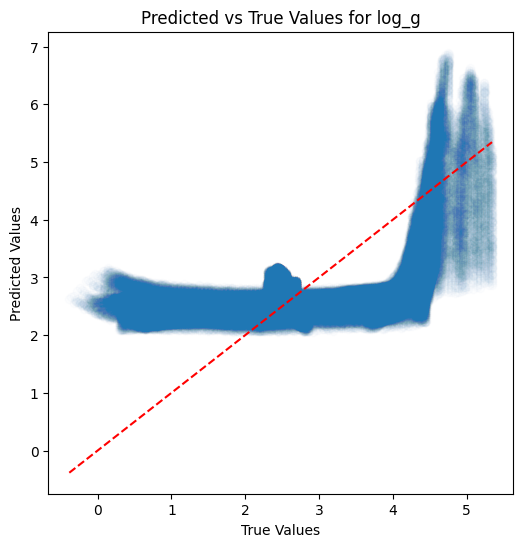

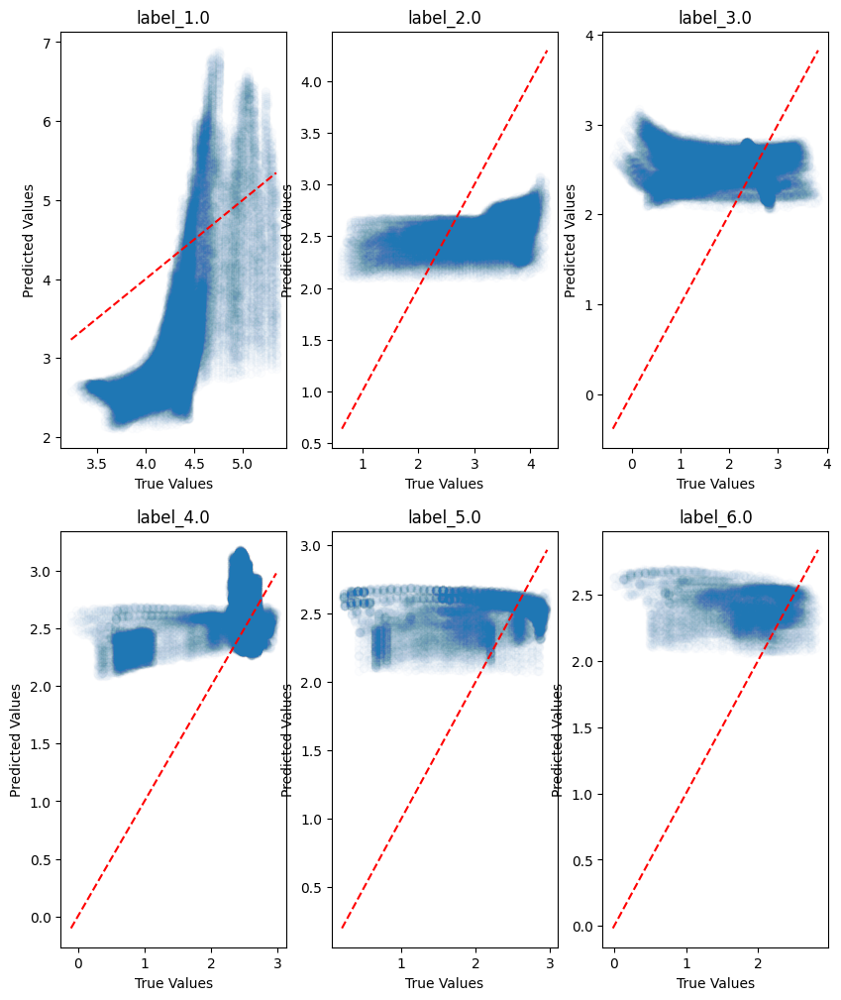

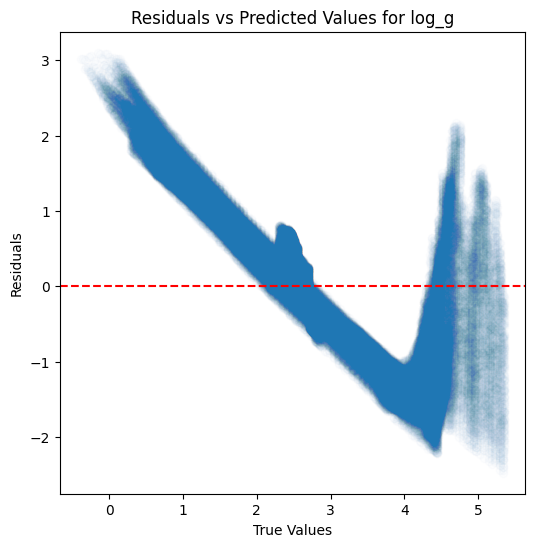

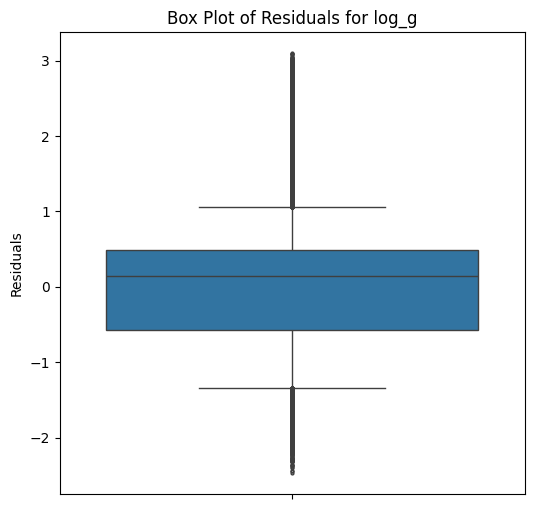

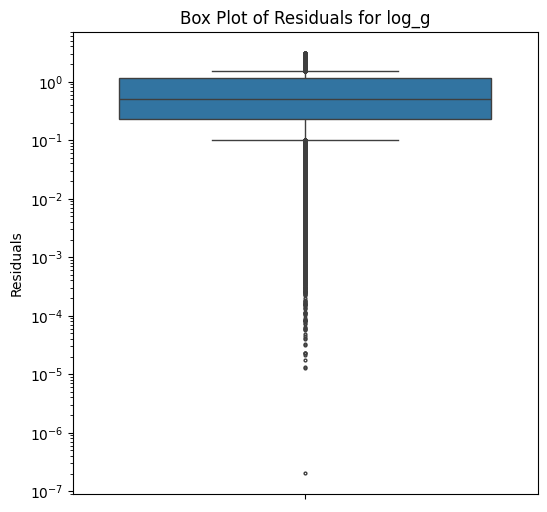

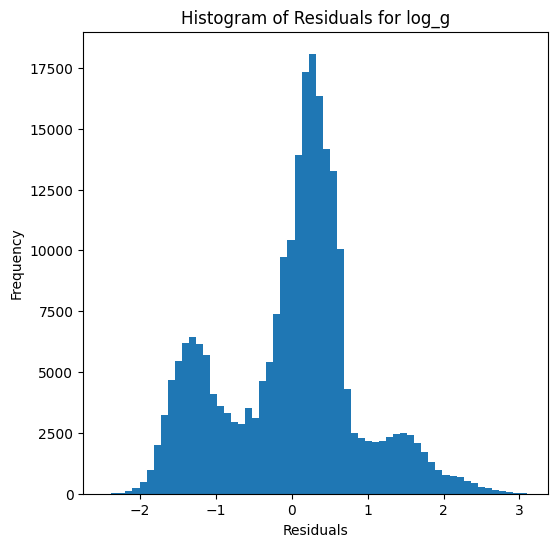

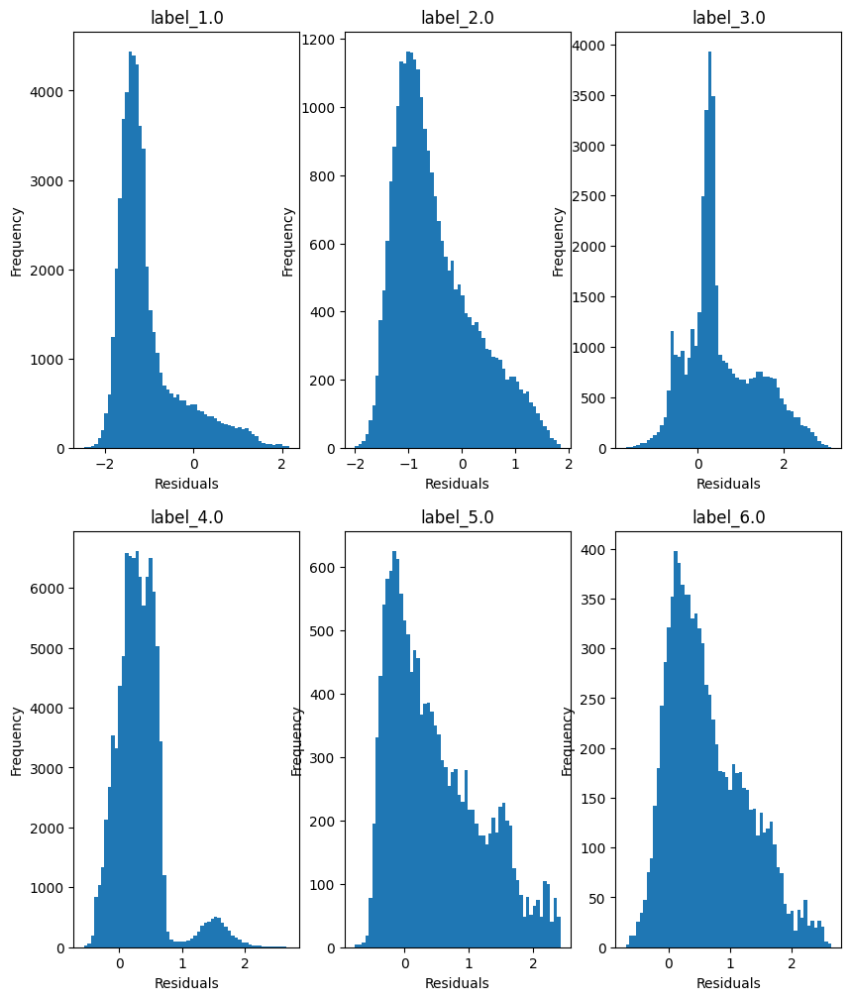

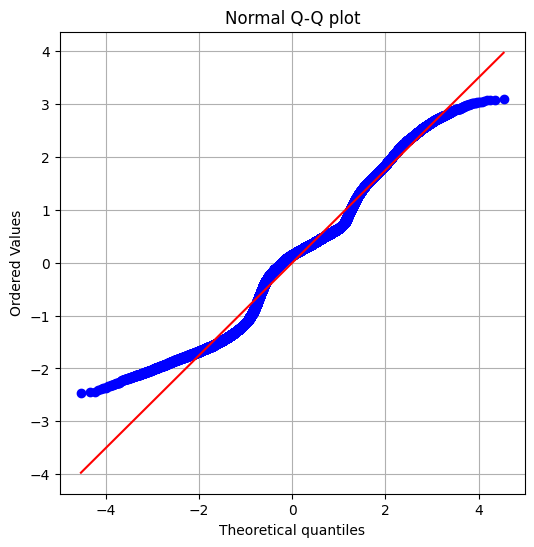

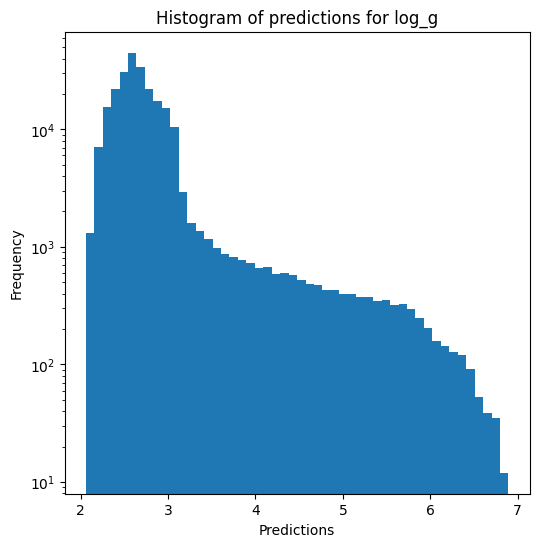

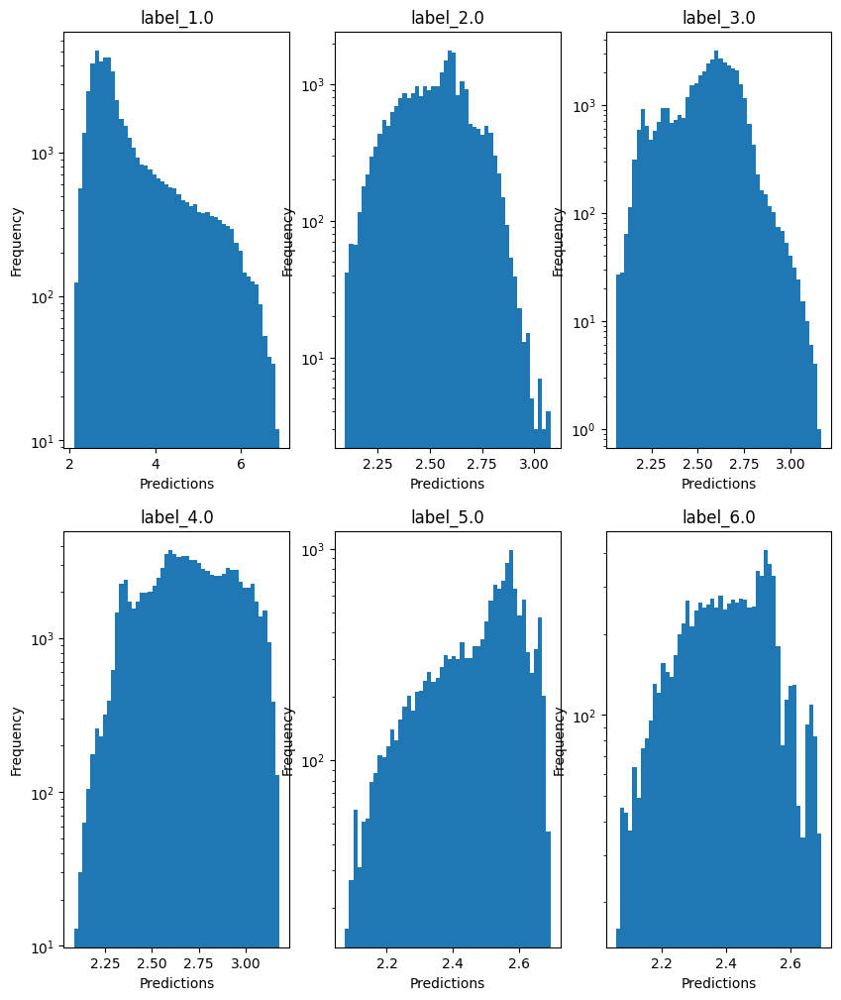


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  -0.037387340131723734
  RMSE :  0.6386836997954487
  MAE :  0.5967180137611825
  MedAE :  0.6401402333182421
  CORR :  0.8117860460150378
  MAX_ER :  1.5866798825716635
  Percentiles : 
    75th percentile :  0.7493412564344971
    90th percentile :  0.8381037956170572
    95th percentile :  0.8800610009731361
    99th percentile :  1.0520592982147958

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.4349192504541818
  RMSE :  0.47637554124437753
  MAE :  0.42224696572918174
  MedAE :  0.43487771910603523
  CORR :  0.7719987385828924
  MAX_ER :  1.0624658037625028
  Percentiles : 
    75th percentile :  0.5850433441789569
    90th percentile :  0.7081210685863273
    95th percentile :  0.7764335354566412
    99th percentile :  0.8730115627498892

radius results for the label category wit

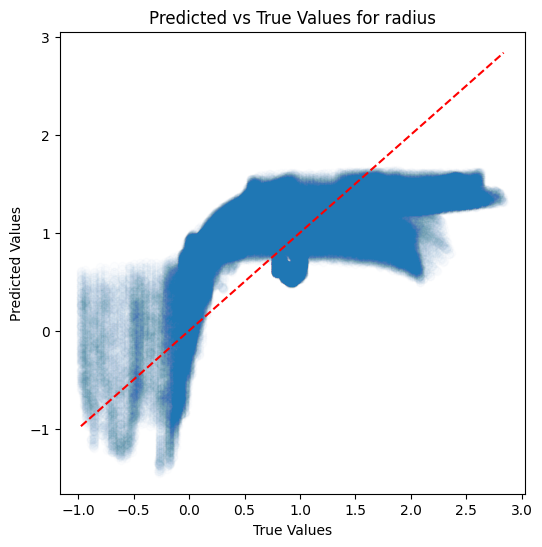

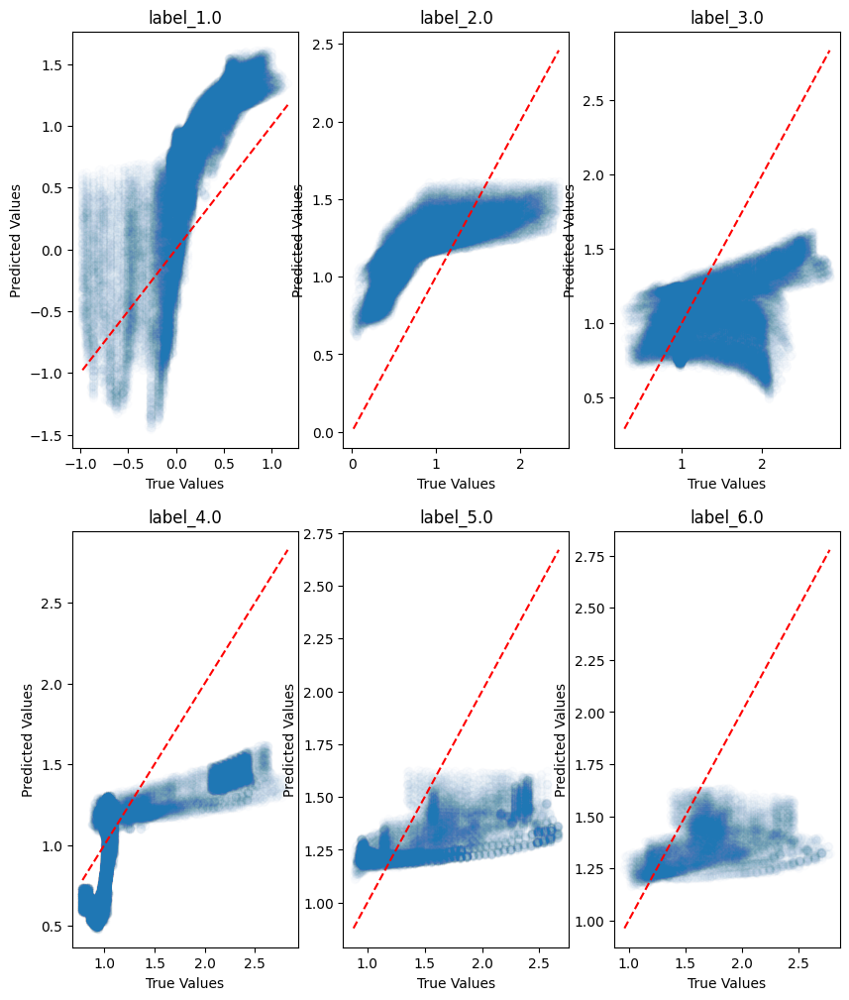

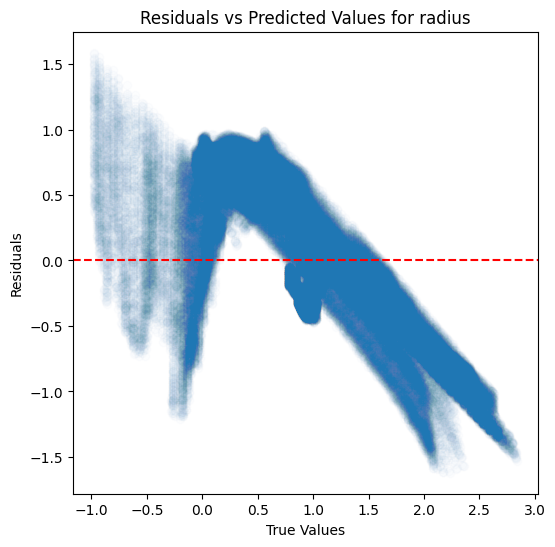

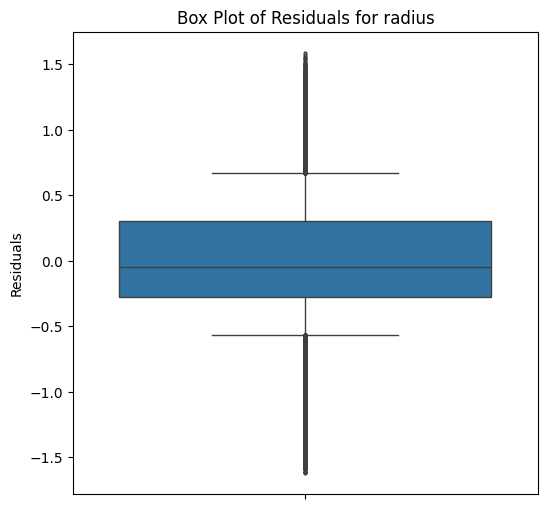

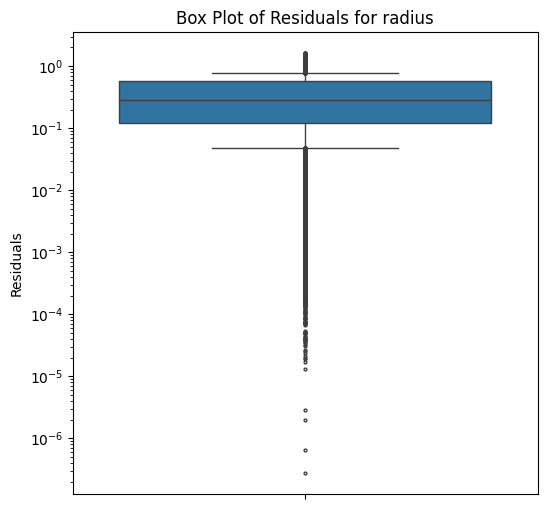

...

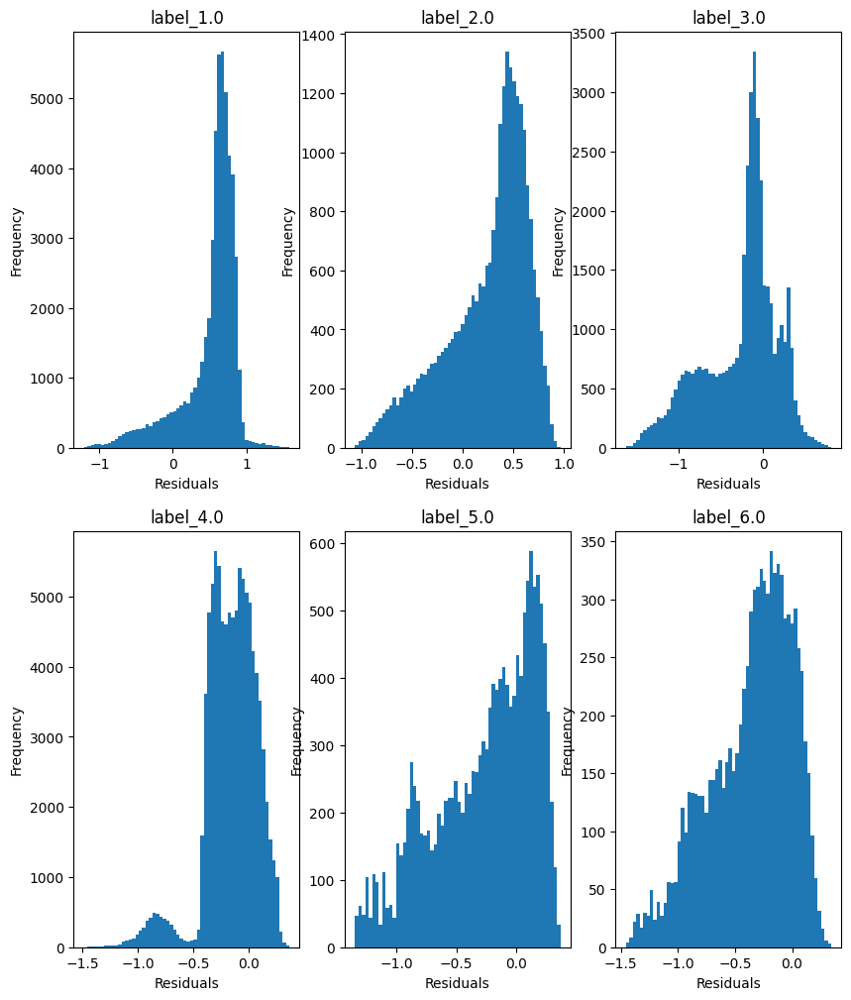

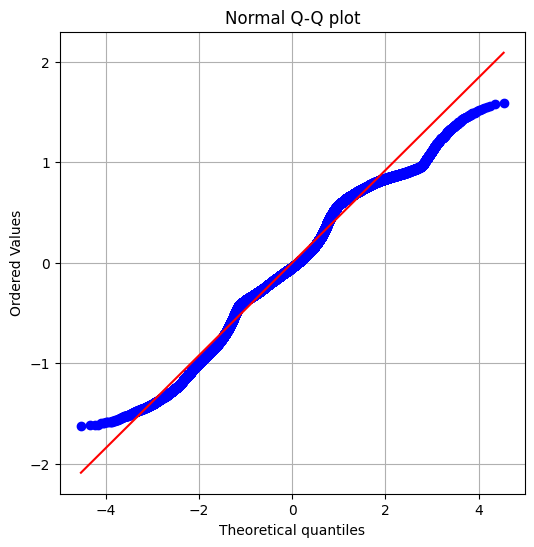

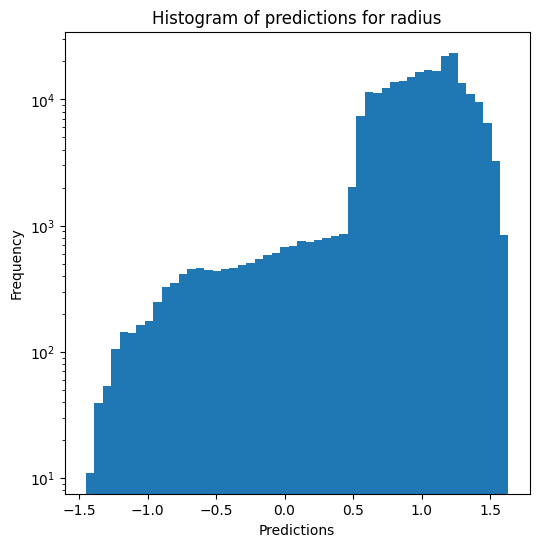

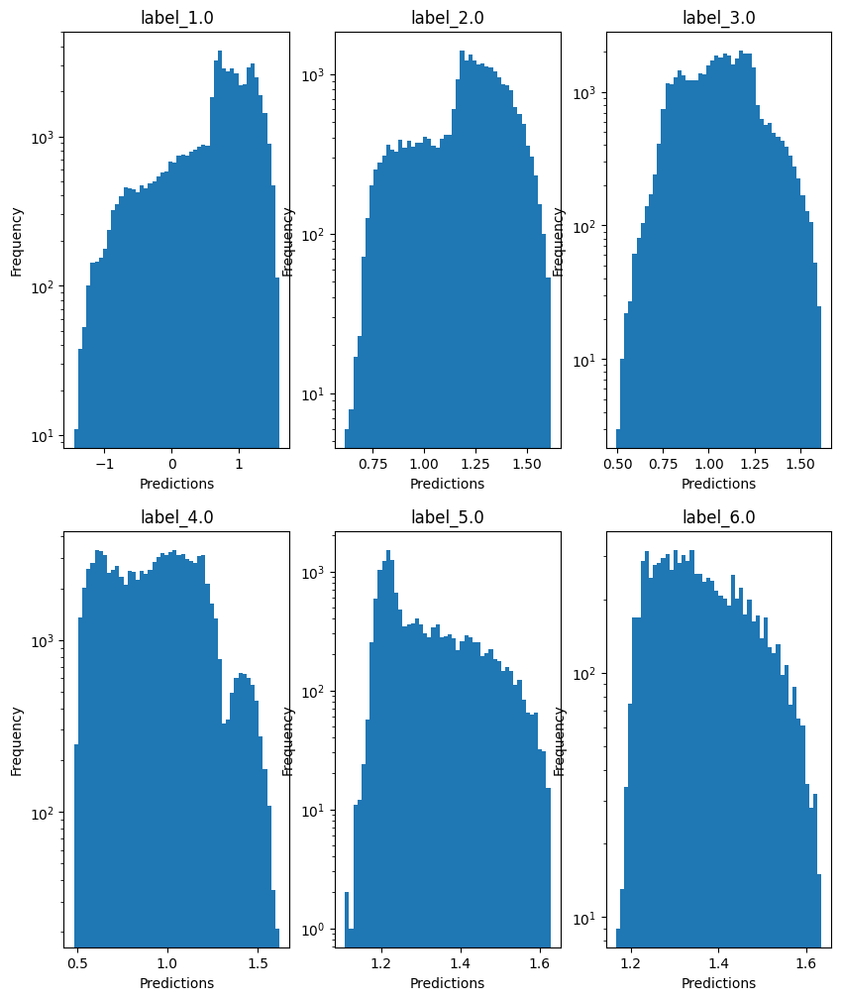

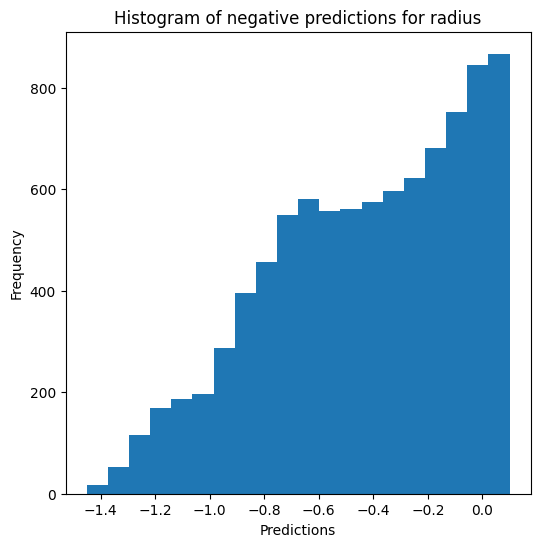

Saving predictions and results...


In [12]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [13]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...


c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9752795584861008
  RMSE :  0.04201112413254124
  MAE :  0.007402127563169193
  MedAE :  5.000000000032756e-05
  CORR :  0.9878143829255721
  MAX_ER :  0.8342529411764716
  Percentiles : 
    75th percentile :  0.0011999999999998678
    90th percentile :  0.009999999999999787
    95th percentile :  0.02458749999999954
    99th percentile :  0.13649999999999984

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.8736829102350739
  RMSE :  0.06226274295500187
  MAE :  0.03377404384220726
  MedAE :  0.015224999999999822
  CORR :  0.9447496545349412
  MAX_ER :  0.8240999999999996
  Percentiles : 
    75th percentile :  0.037208258928571825
    90th percentile :  0.08641909090909036
    95th percentile :  0.1420288888888889
    99th percentile :  0.23919781250000027

T_eff results for the label category with a value of 3.0
 

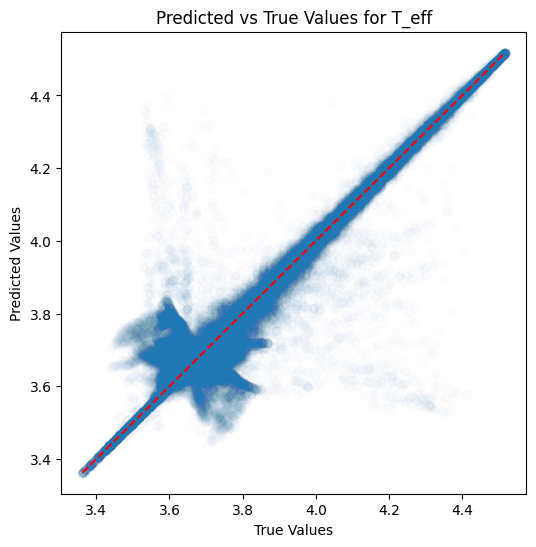

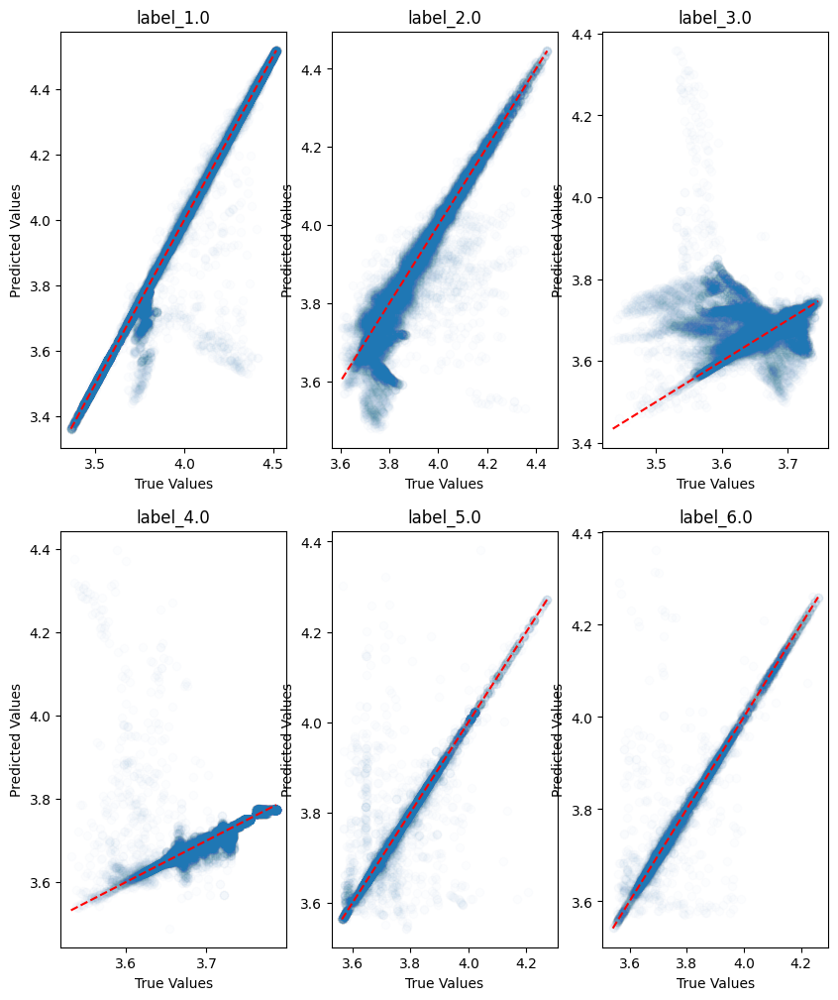

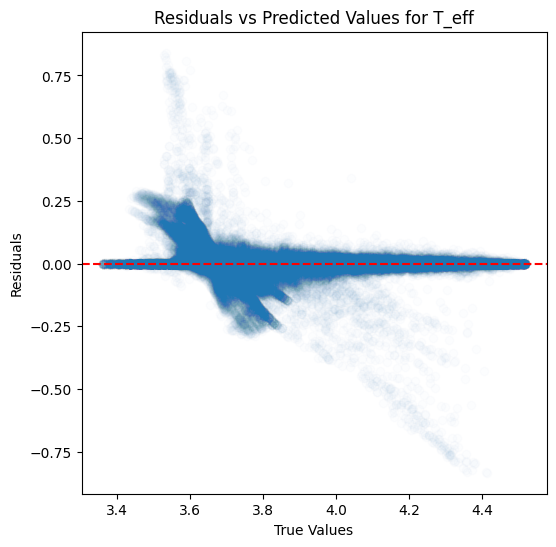

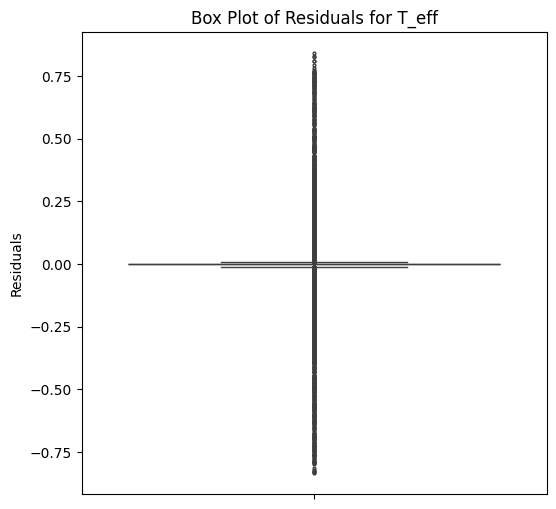

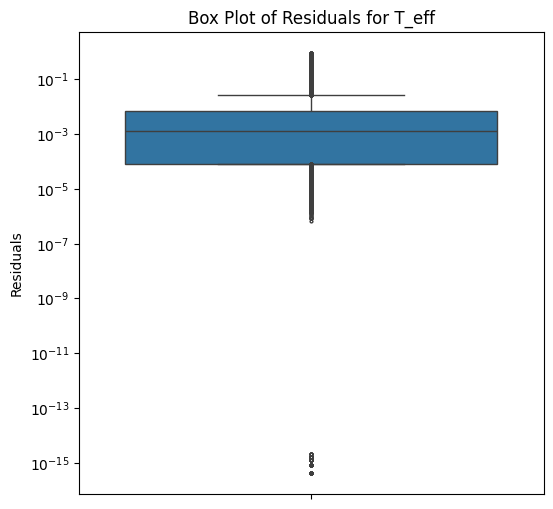

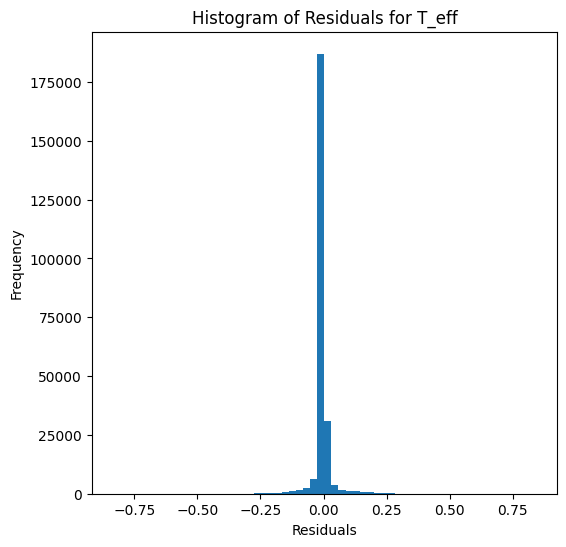

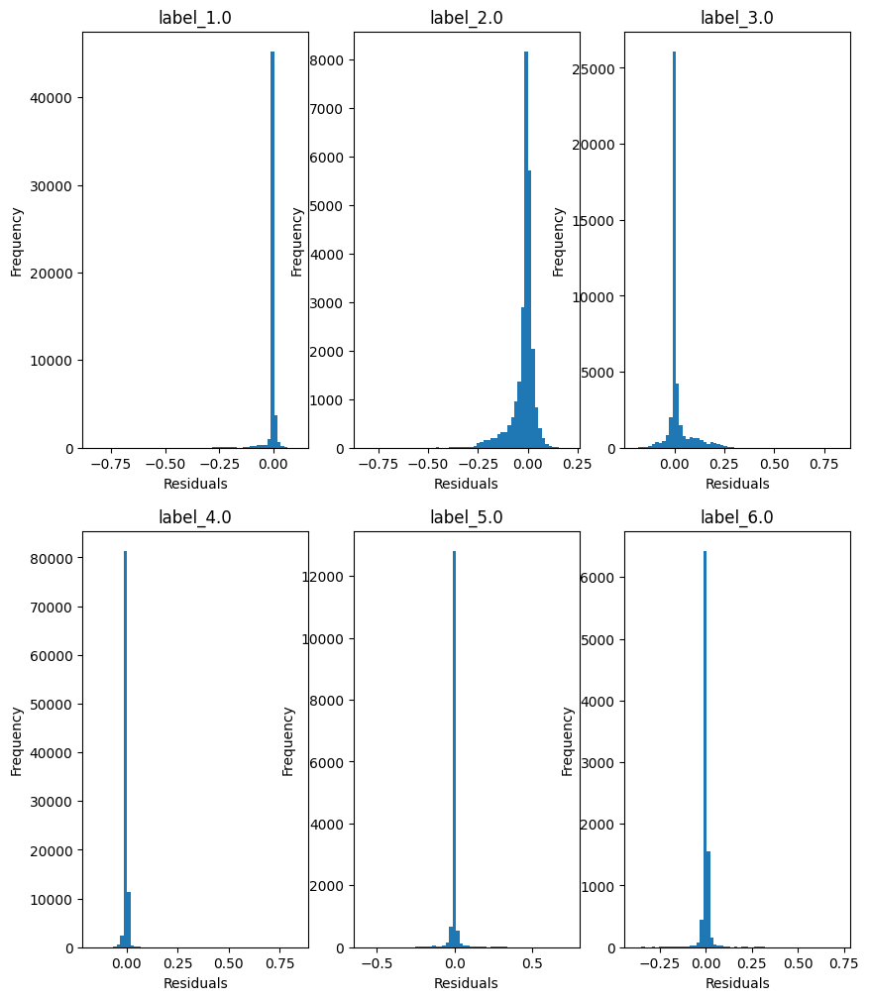

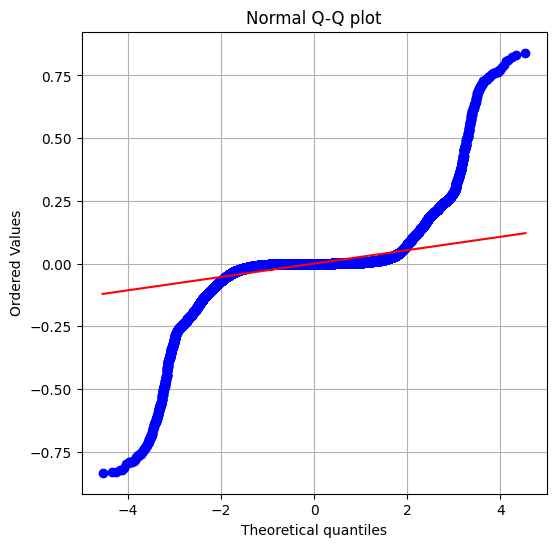

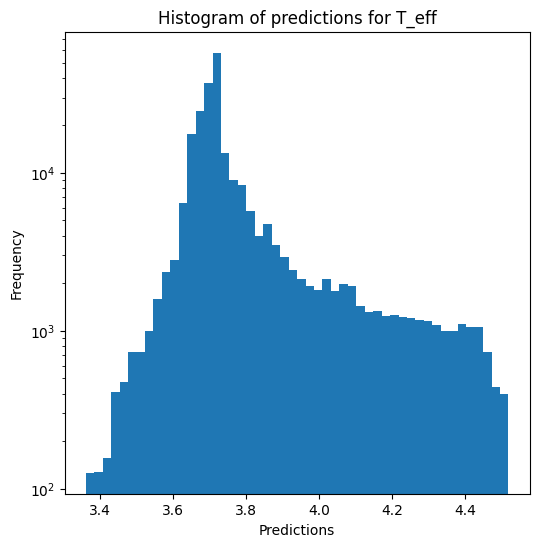

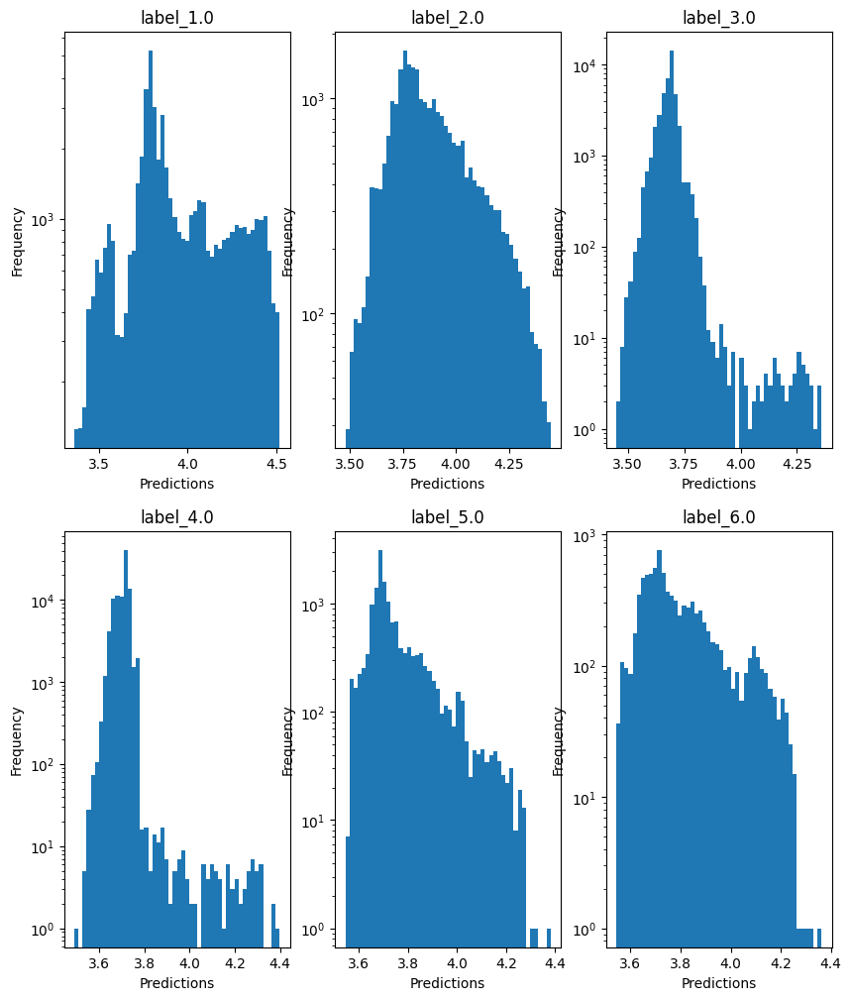

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -0.20397251296193808
  RMSE :  0.3773641166525903
  MAE :  0.06675833350995886
  MedAE :  0.0009372549019603937
  CORR :  0.7074431985113896
  MAX_ER :  4.779999999999999
  Percentiles : 
    75th percentile :  0.006000000000000227
    90th percentile :  0.0259999999999998
    95th percentile :  0.06400000000000006
    99th percentile :  1.9671749999999992

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.2022893510152015
  RMSE :  0.7555748150303918
  MAE :  0.30295752317634533
  MedAE :  0.06000000000000005
  CORR :  0.6547880100556327
  MAX_ER :  4.171
  Percentiles : 
    75th percentile :  0.15633333333333344
    90th percentile :  1.0172899999999998
    95th percentile :  1.8167749999999923
    99th percentile :  3.378

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.433762327858261

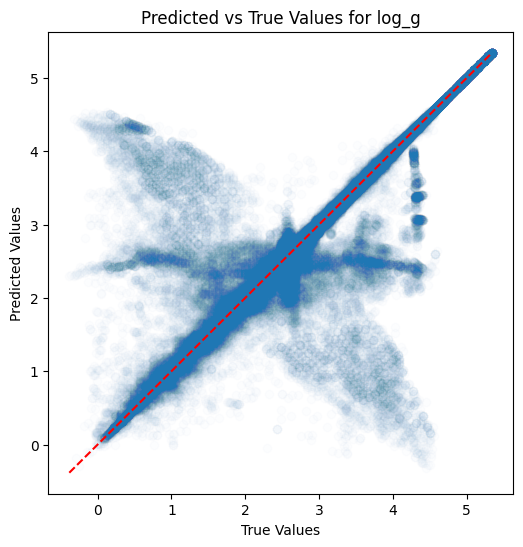

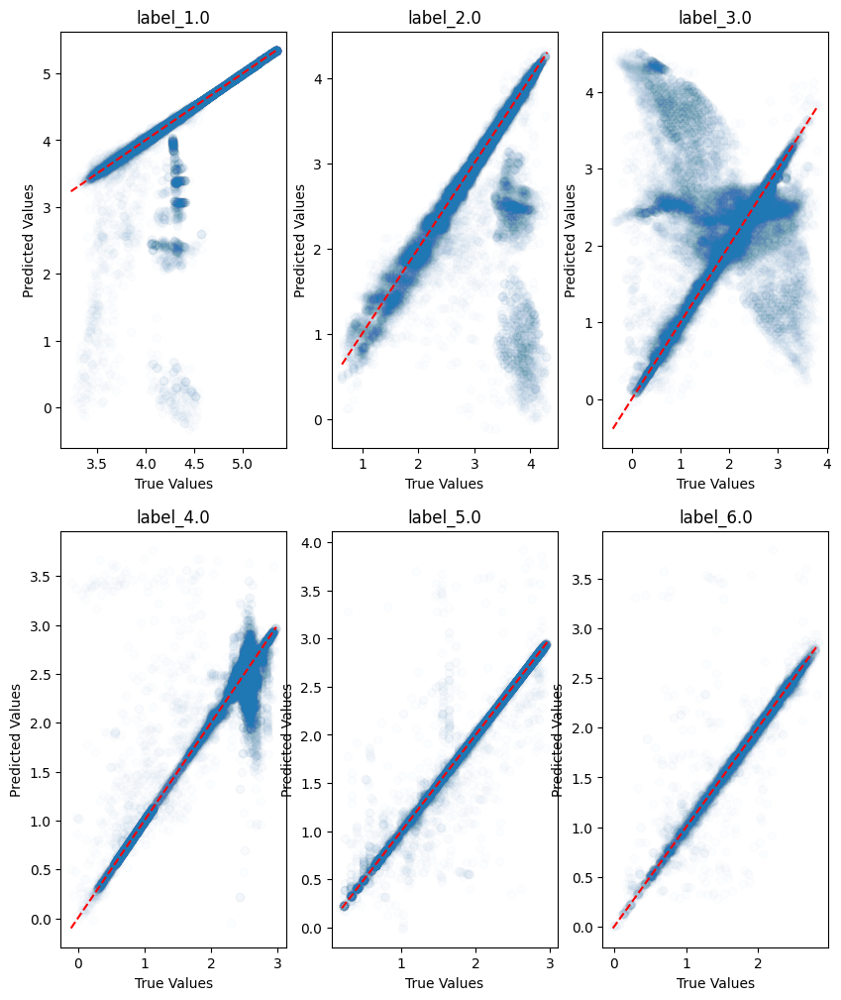

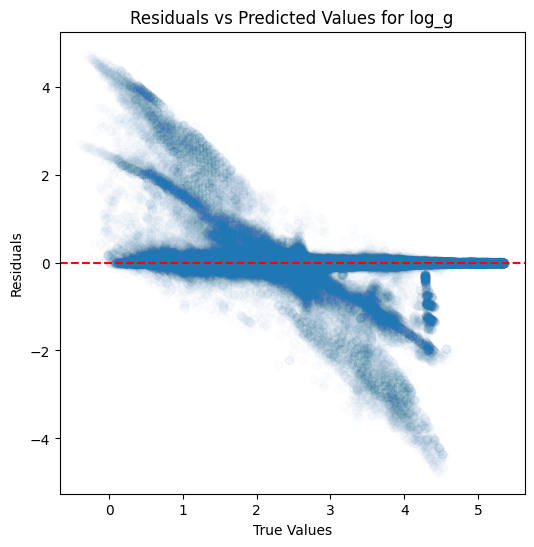

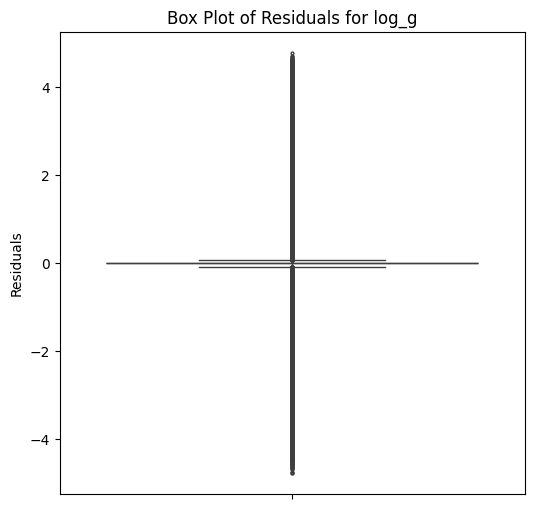

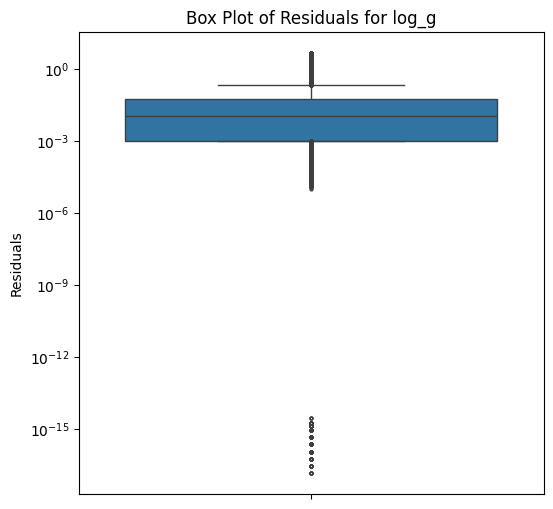

...

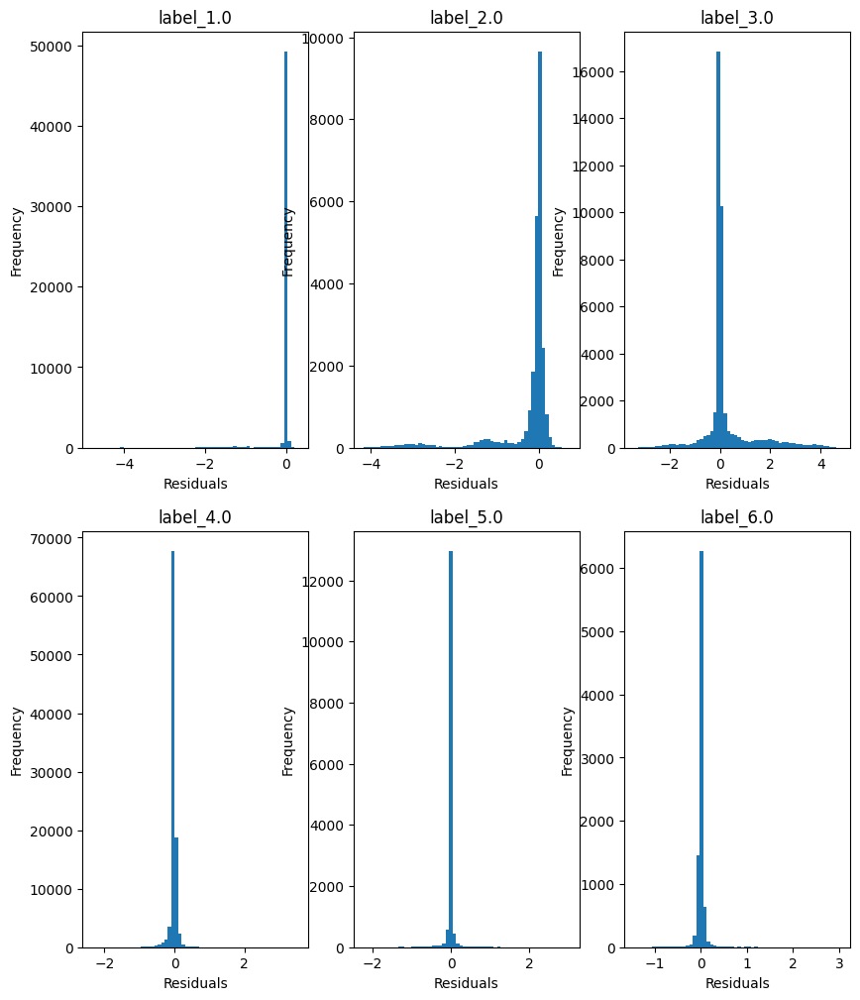

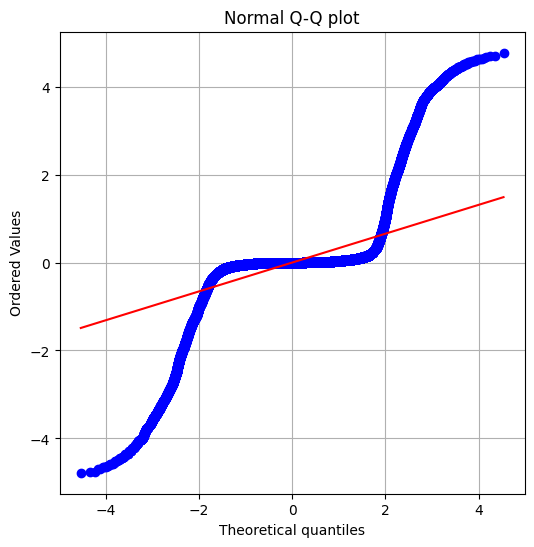

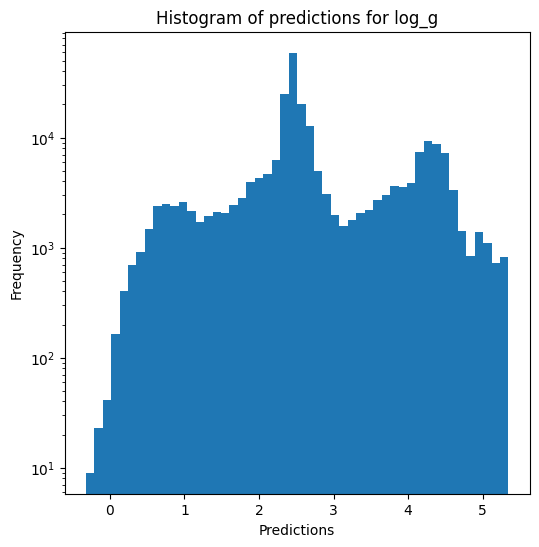

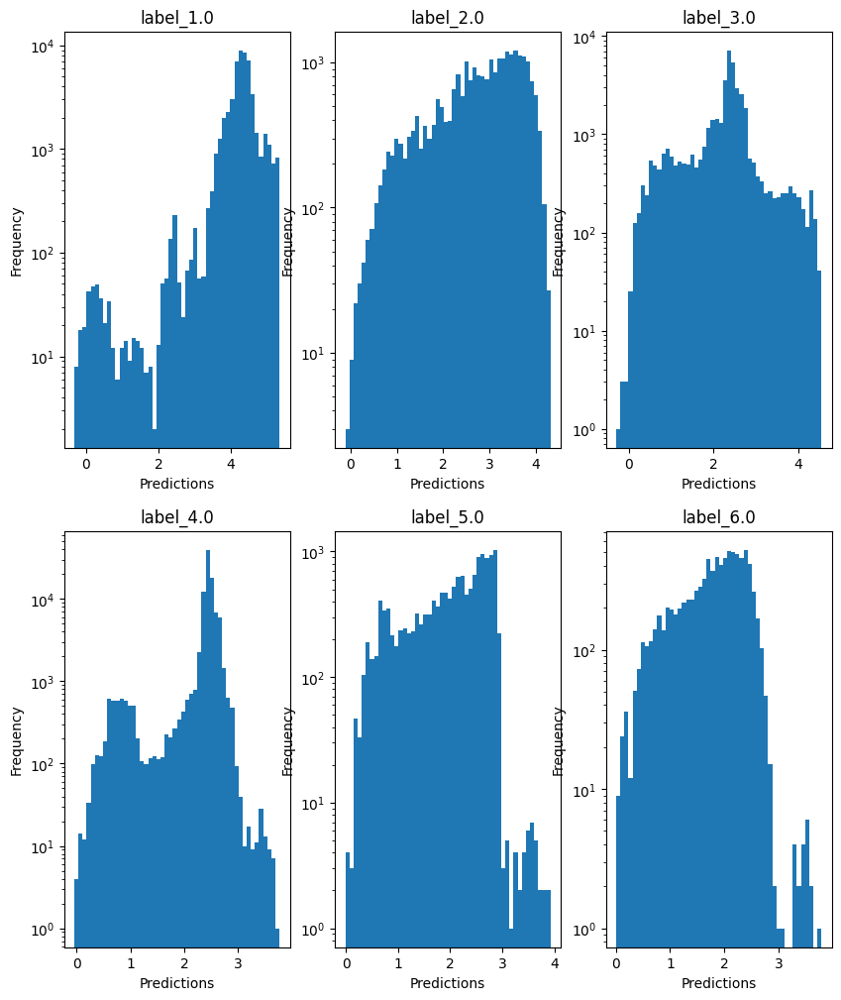

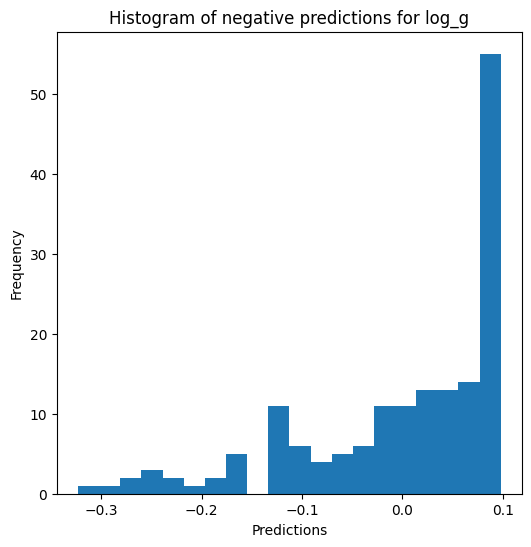

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.7405548226925223
  RMSE :  0.18888690116870135
  MAE :  0.0337380587395726
  MedAE :  0.00041396878928610763
  CORR :  0.8924437137516856
  MAX_ER :  2.390815363619212
  Percentiles : 
    75th percentile :  0.0034666705907947983
    90th percentile :  0.014748463911475752
    95th percentile :  0.034325009037931564
    99th percentile :  0.9838915178375456

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.5652103012578242
  RMSE :  0.3778015909298871
  MAE :  0.15154345317975954
  MedAE :  0.030175194982677955
  CORR :  0.7804537760618574
  MAX_ER :  2.0861071059413177
  Percentiles : 
    75th percentile :  0.0781132976226363
    90th percentile :  0.5085393011986228
    95th percentile :  0.9087021438259402
    99th percentile :  1.688882884393477

radius results for the label categ

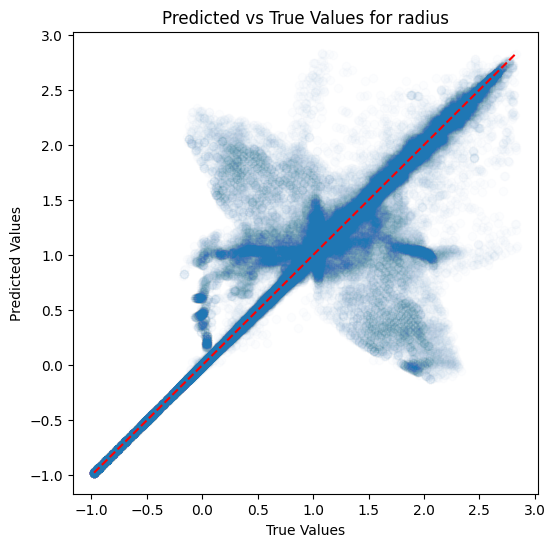

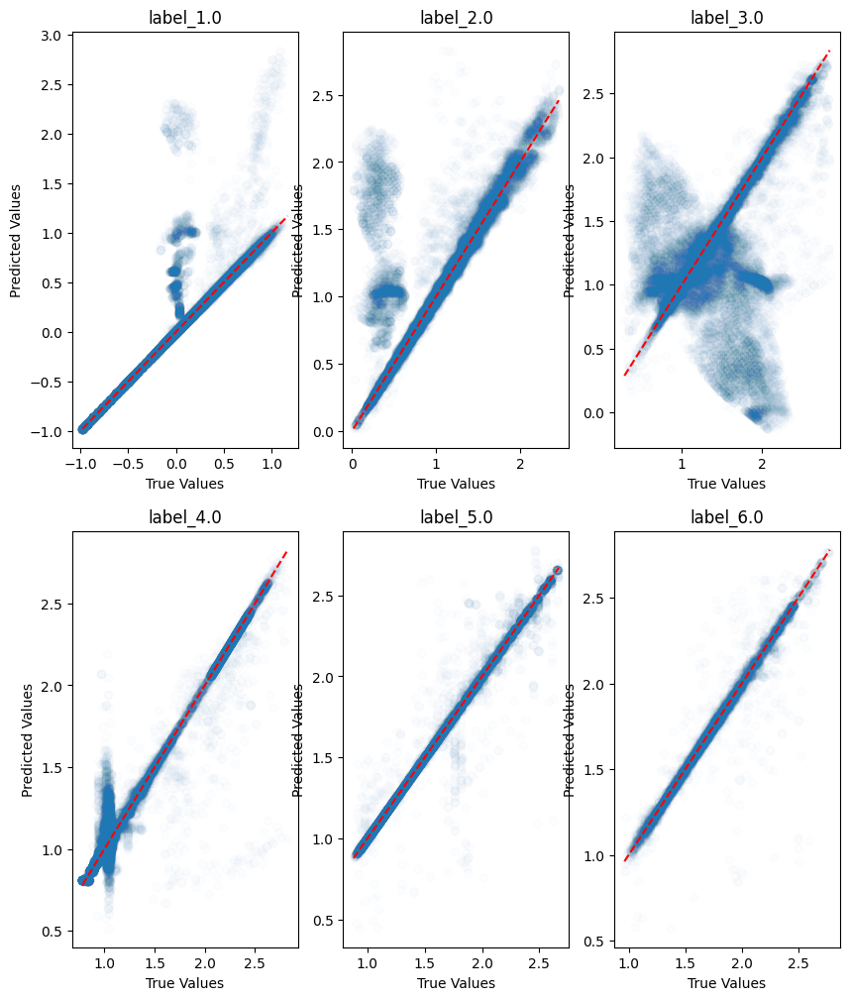

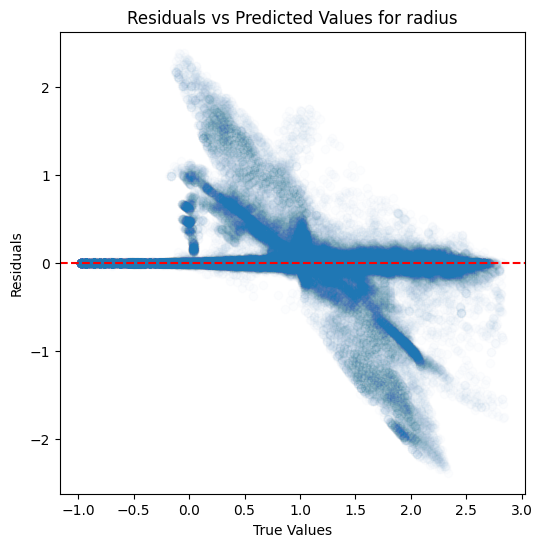

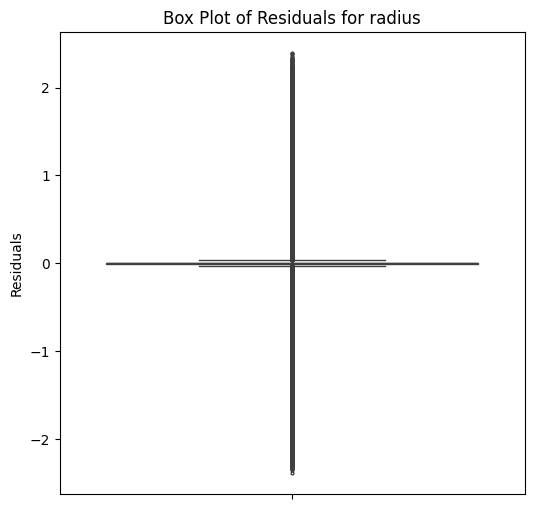

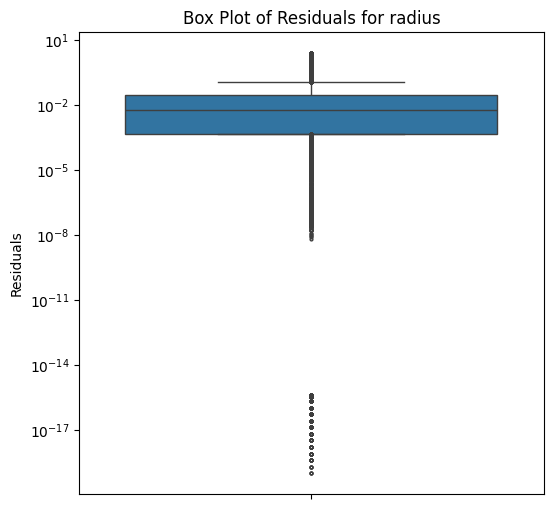

...

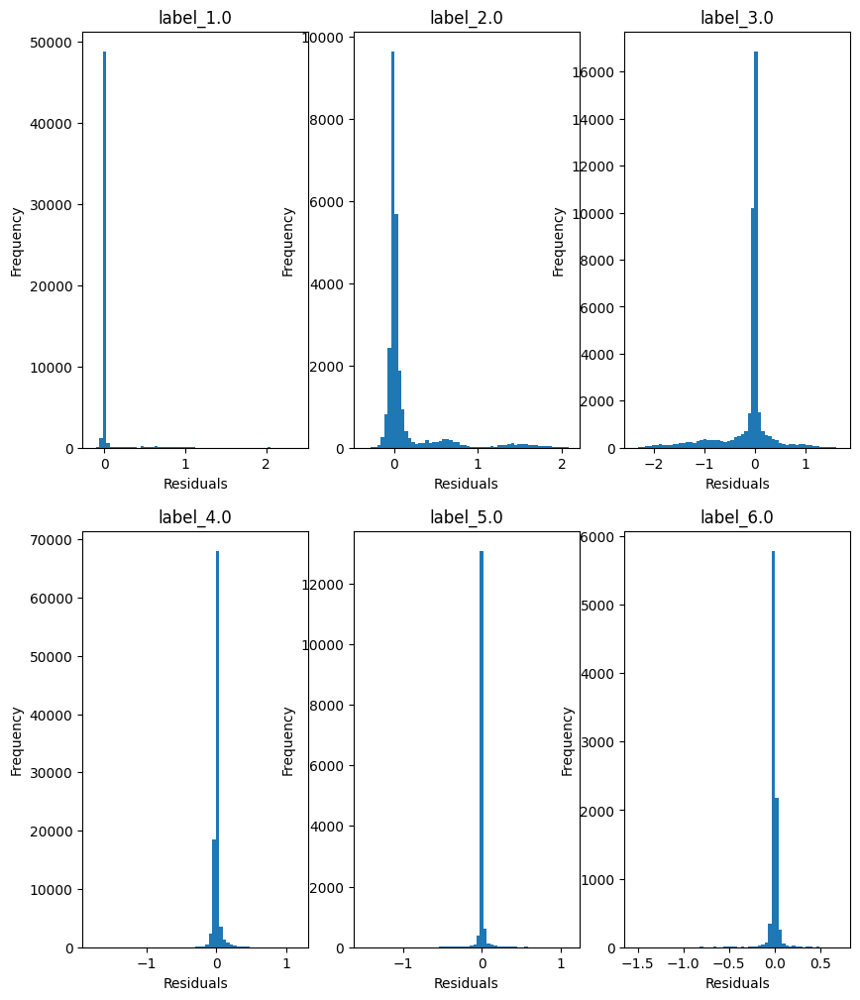

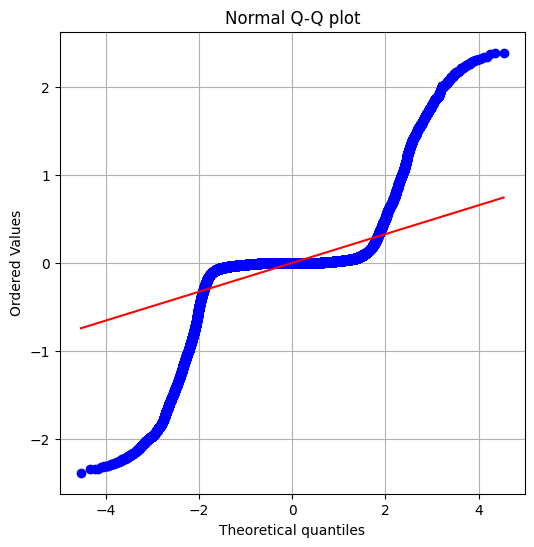

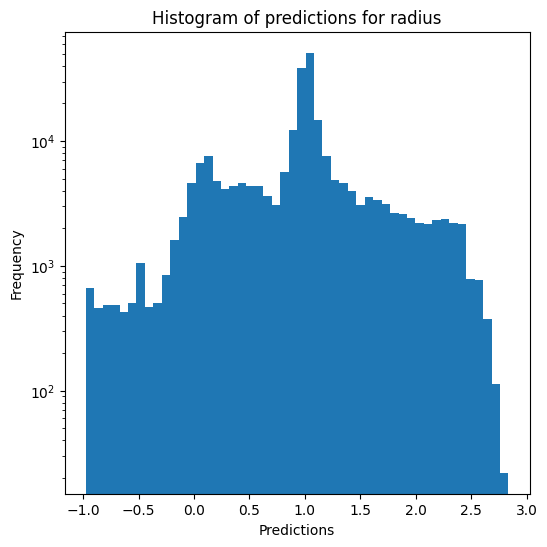

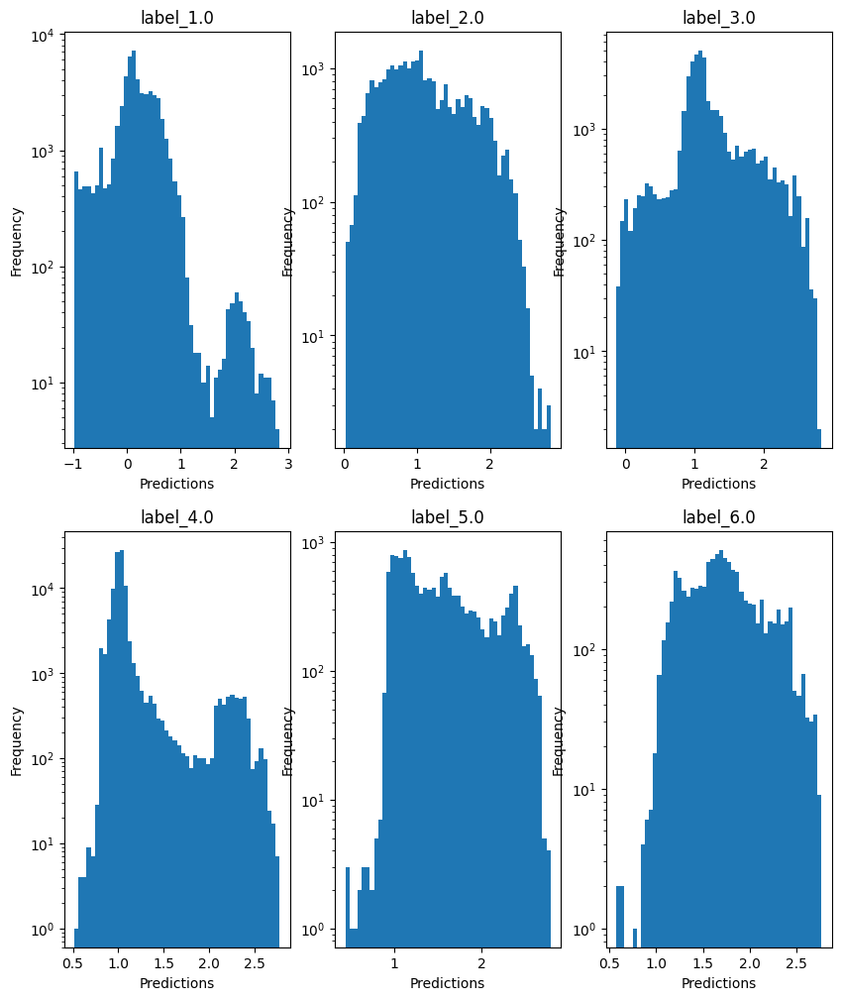

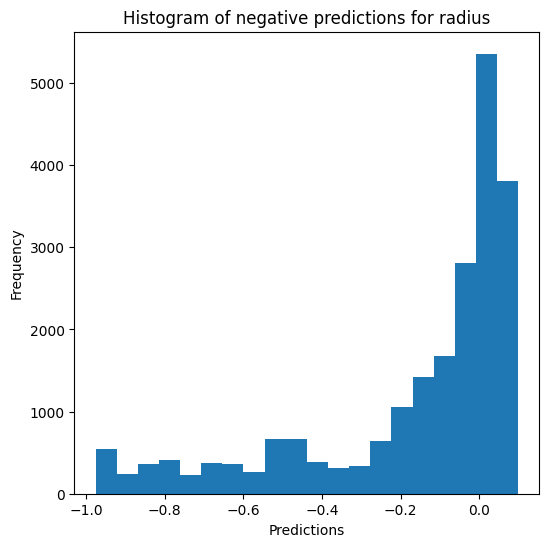

Saving predictions and results...


In [14]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [15]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9800113550394226
  RMSE :  0.037973391234157446
  MAE :  0.011578562331804574
  MedAE :  0.0021999999999997577
  CORR :  0.9901261656615532
  MAX_ER :  0.8176600000000005
  Percentiles : 
    75th percentile :  0.007679999999999687
    90th percentile :  0.03338000000000019
    95th percentile :  0.04967499999999969
    99th percentile :  0.12510700000000008

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.8988541585913251
  RMSE :  0.056892938873610494
  MAE :  0.036662727836329824
  MedAE :  0.022800000000000598
  CORR :  0.9536042787229446
  MAX_ER :  0.6366800000000001
  Percentiles : 
    75th percentile :  0.048220000000000596
    90th percentile :  0.08676600000000015
    95th percentile :  0.11791300000000

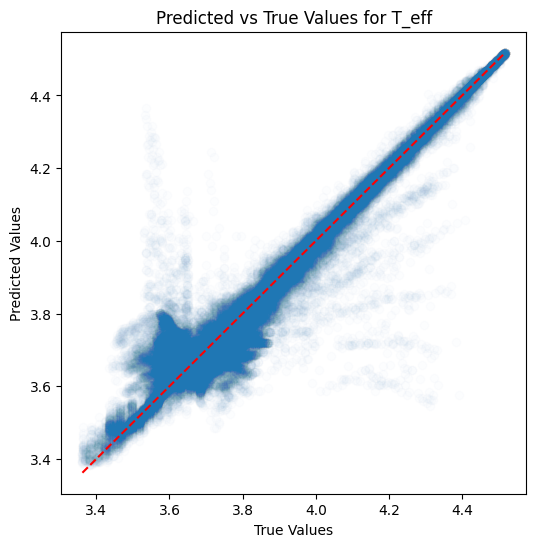

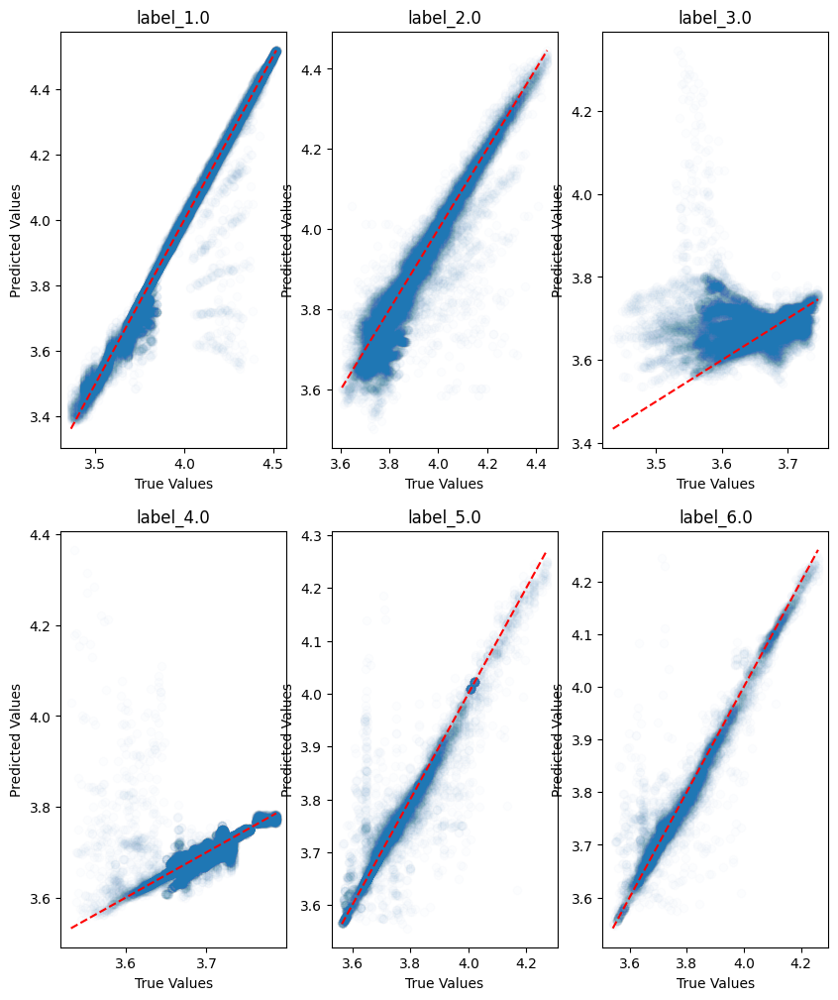

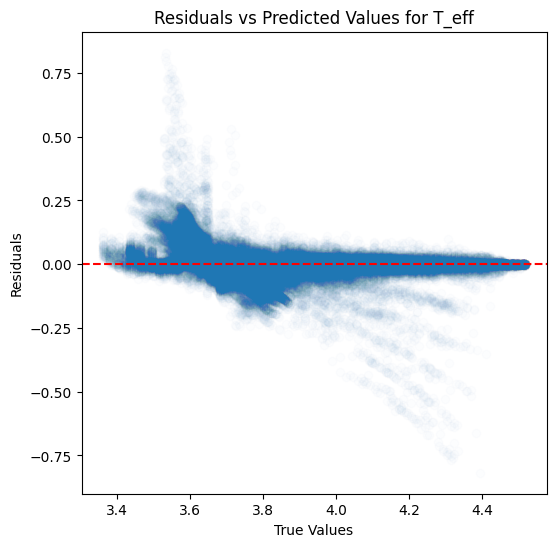

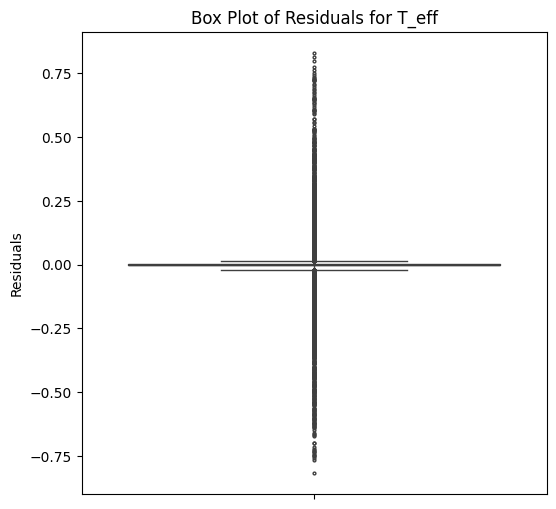

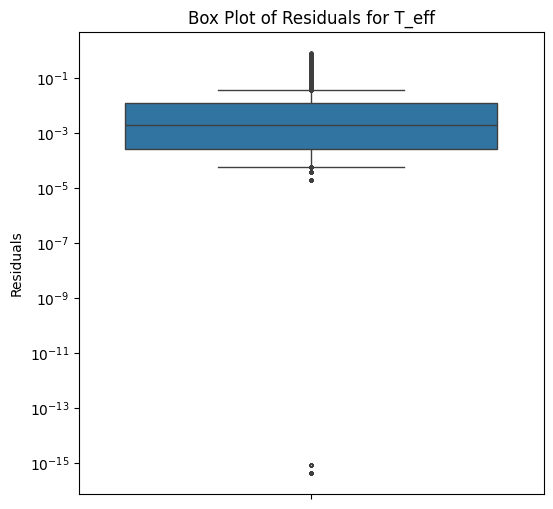

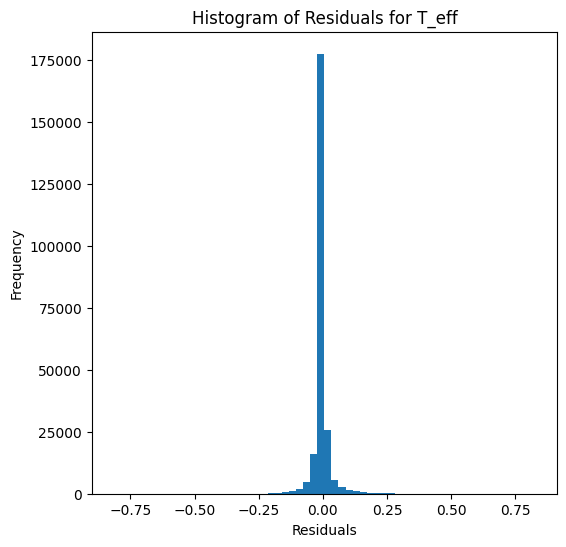

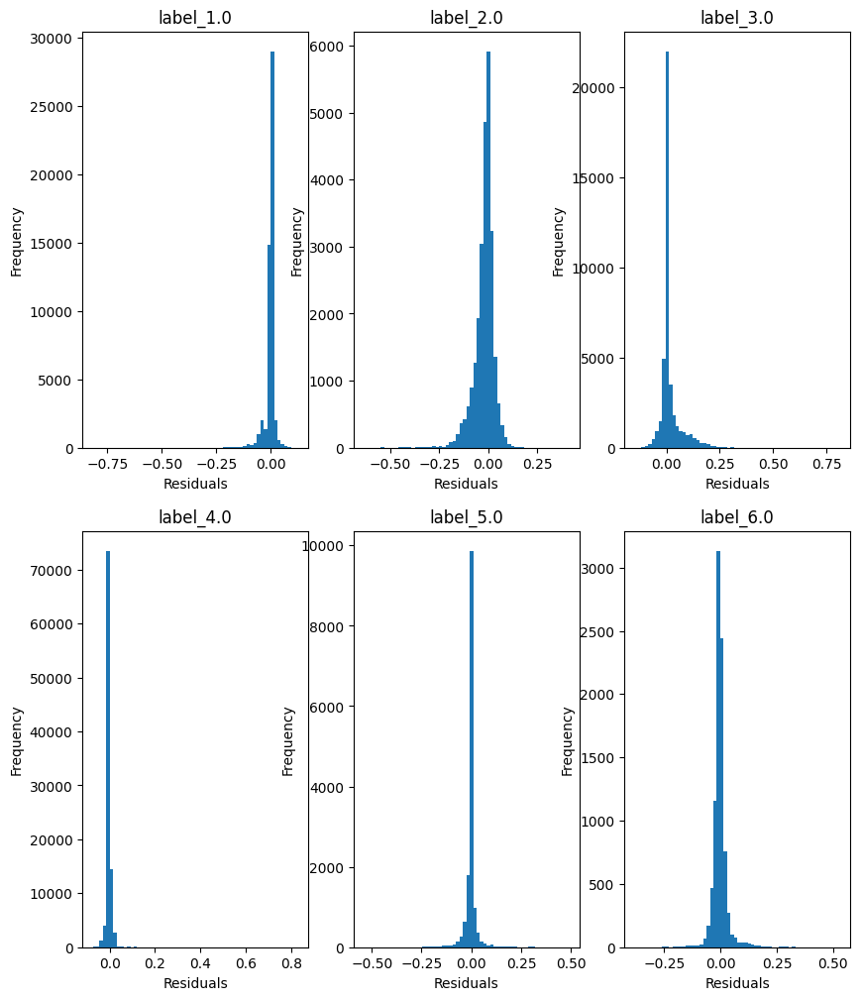

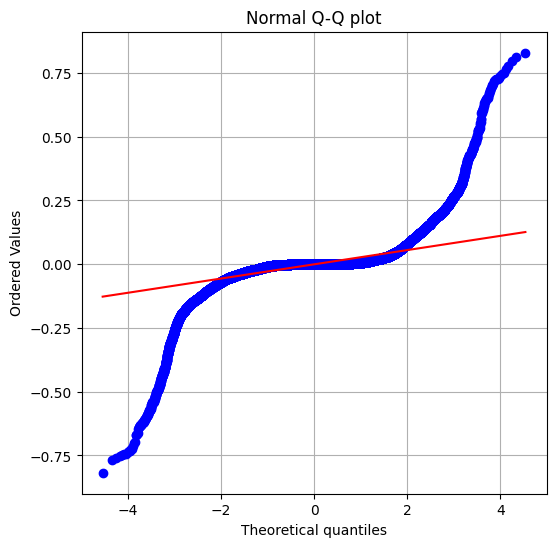

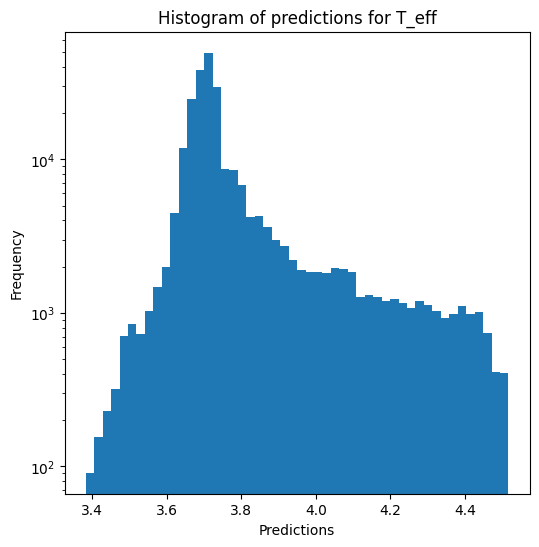

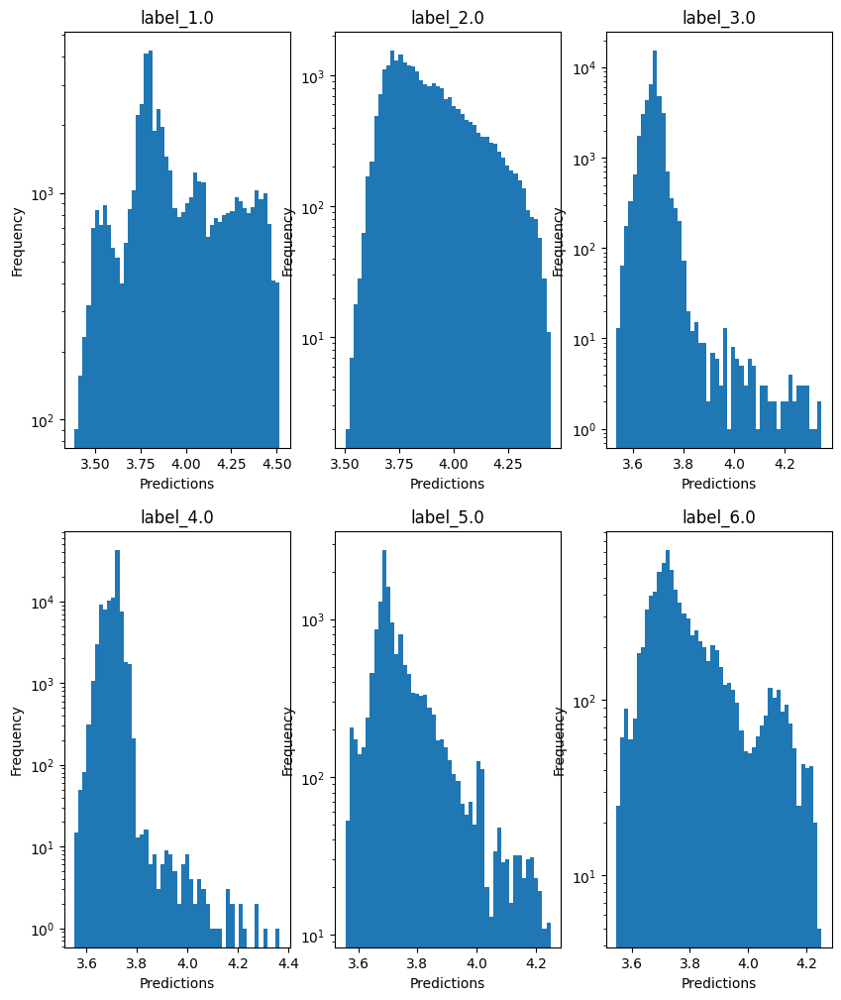


log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  0.03934139387015889
  RMSE :  0.34180142656661283
  MAE :  0.09372609255960278
  MedAE :  0.007600000000000051
  CORR :  0.7456154000428418
  MAX_ER :  4.513
  Percentiles : 
    75th percentile :  0.029799999999999383
    90th percentile :  0.09119999999999973
    95th percentile :  0.7701499999999997
    99th percentile :  1.8364699999999996

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.5390409677967032
  RMSE :  0.5972036385707933
  MAE :  0.30991377092374456
  MedAE :  0.09420000000000028
  CORR :  0.7641256296544156
  MAX_ER :  3.899
  Percentiles : 
    75th percentile :  0.26425000000000015
    90th percentile :  1.08526
    95th percentile :  1.414459999999999
    99th percentile :  2.335744

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.09111889568070564
  RMSE :  0.8690122

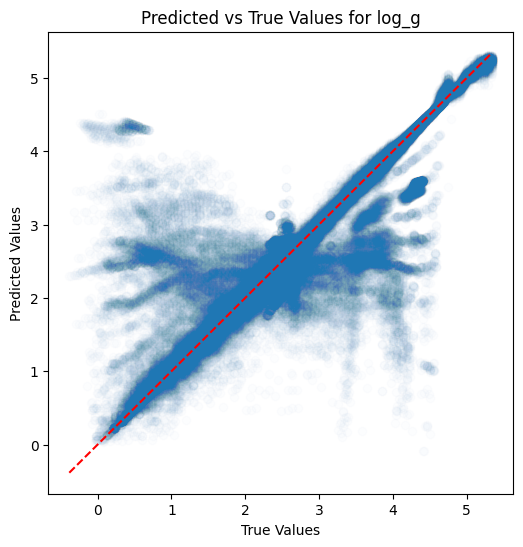

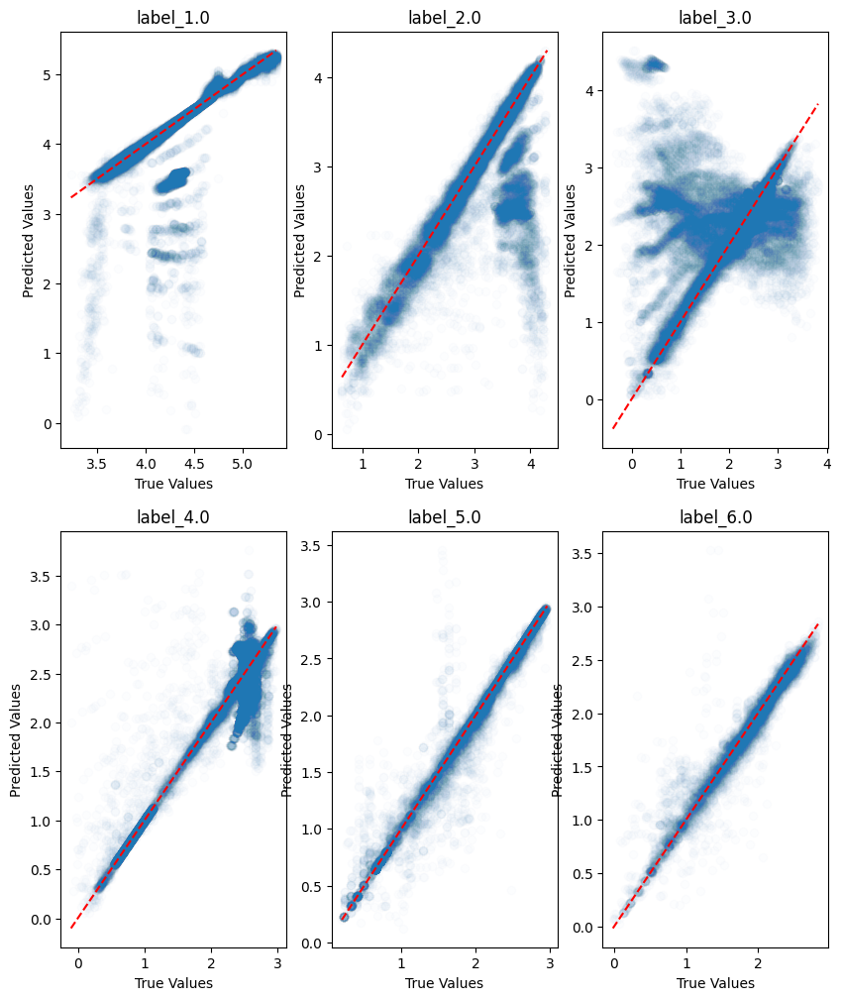

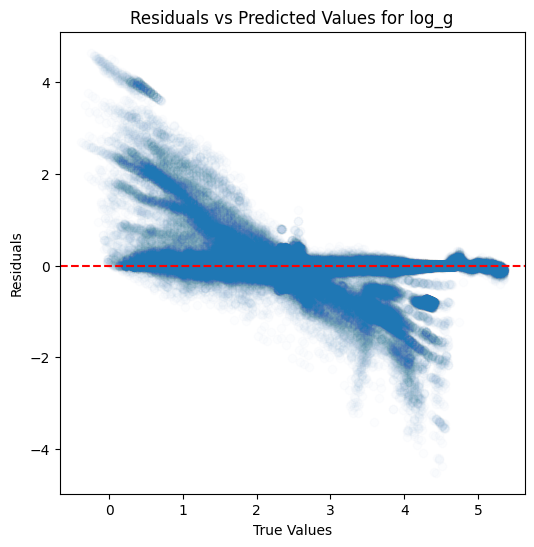

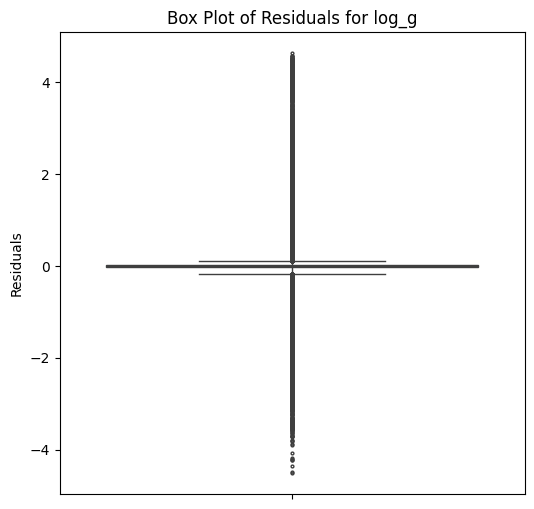

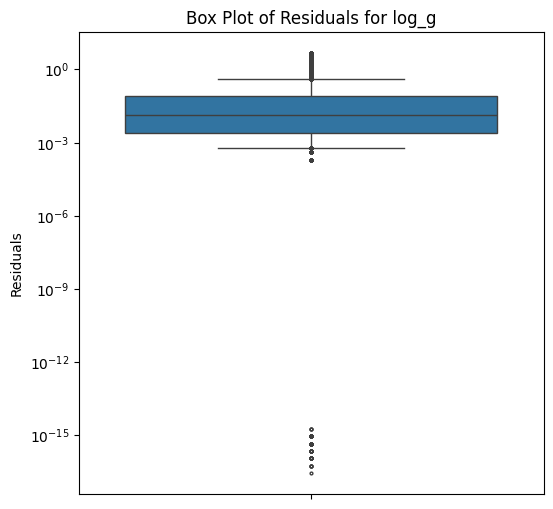

...

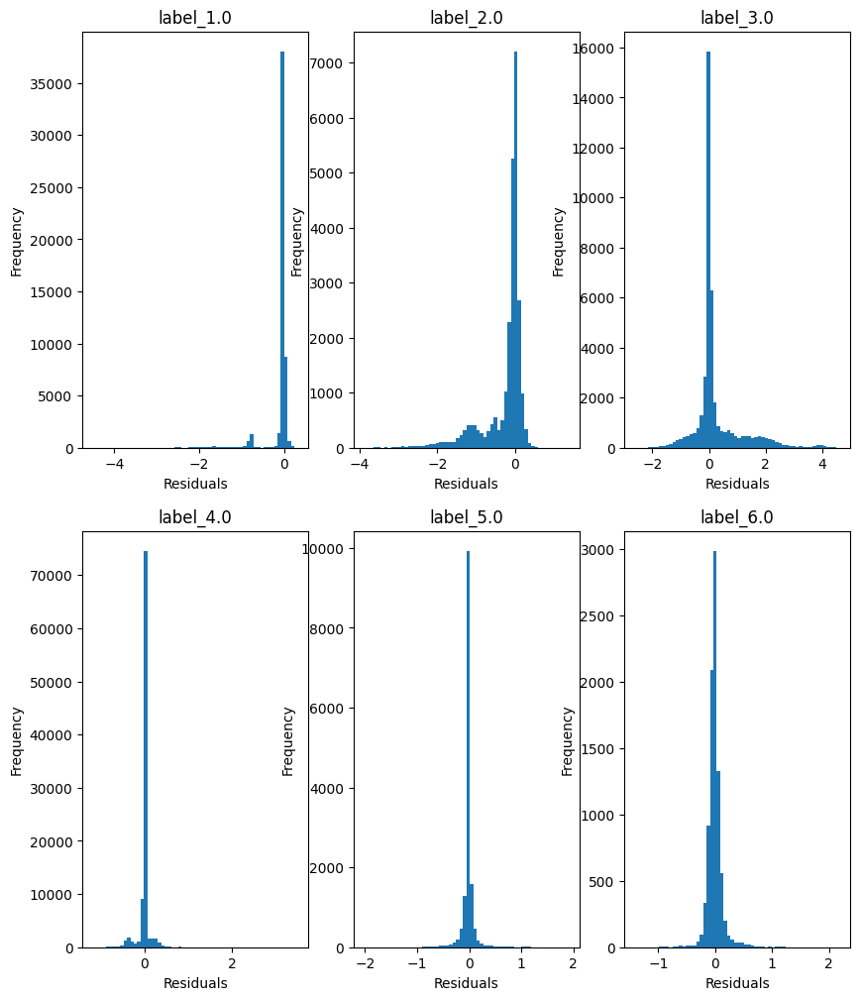

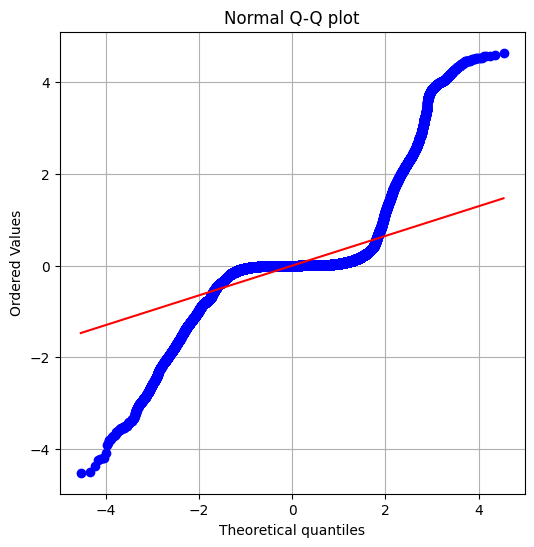

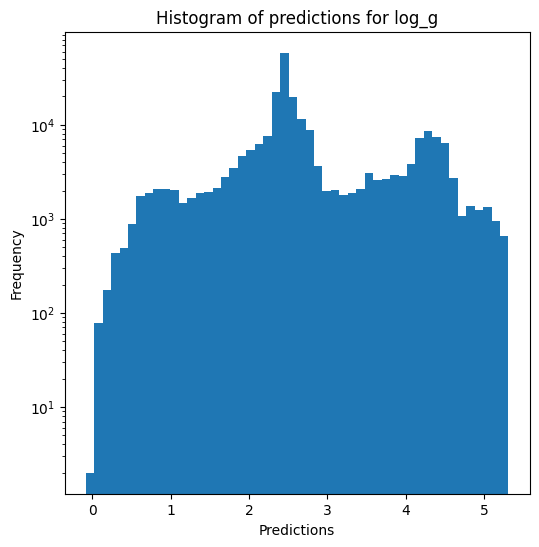

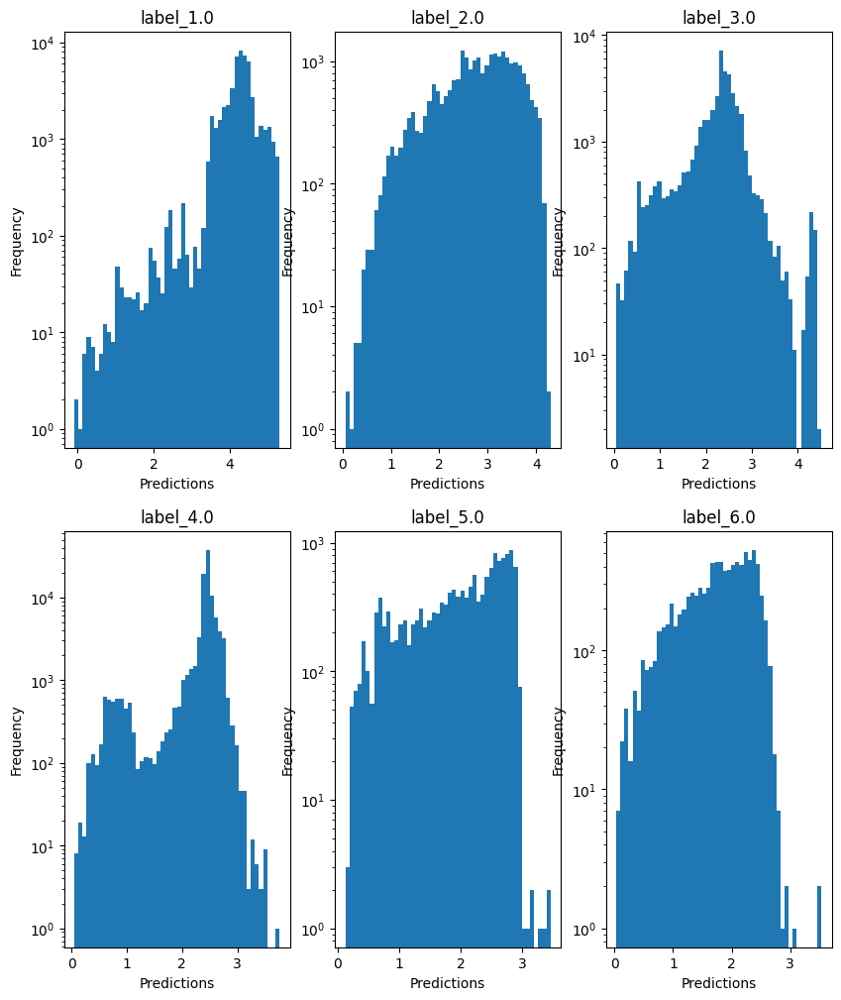

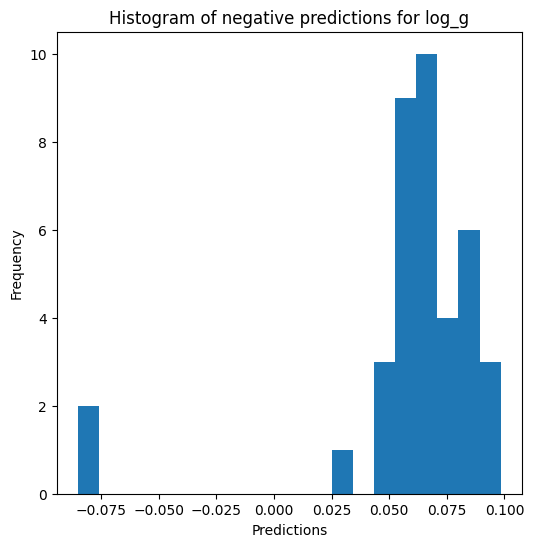


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.787733169233738
  RMSE :  0.1731685549648688
  MAE :  0.051821909738179746
  MedAE :  0.005413683963621685
  CORR :  0.9069845038388326
  MAX_ER :  2.2561552794953266
  Percentiles : 
    75th percentile :  0.01917549585670436
    90th percentile :  0.08059737847165732
    95th percentile :  0.38537157409596057
    99th percentile :  0.9183018345658641

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.7487329122622766
  RMSE :  0.2986300403572515
  MAE :  0.15504616884566644
  MedAE :  0.04720748396653149
  CORR :  0.8659957678589498
  MAX_ER :  1.9474134471793882
  Percentiles : 
    75th percentile :  0.13211665391599486
    90th percentile :  0.5427023916446139
    95th percentile :  0.7073590694879438
    99th percentile :  1.1681770623902057

radius results for the label category 

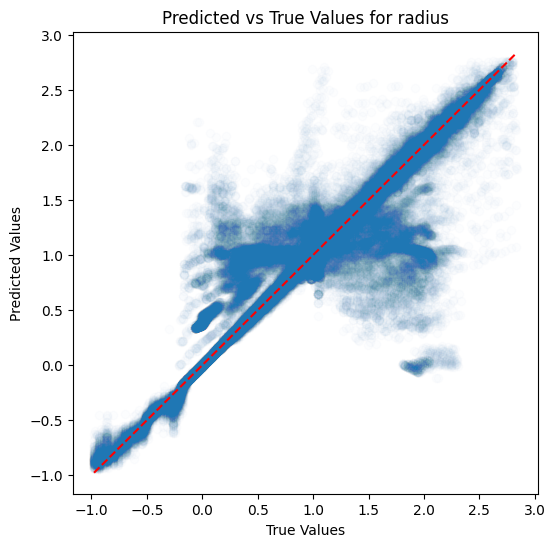

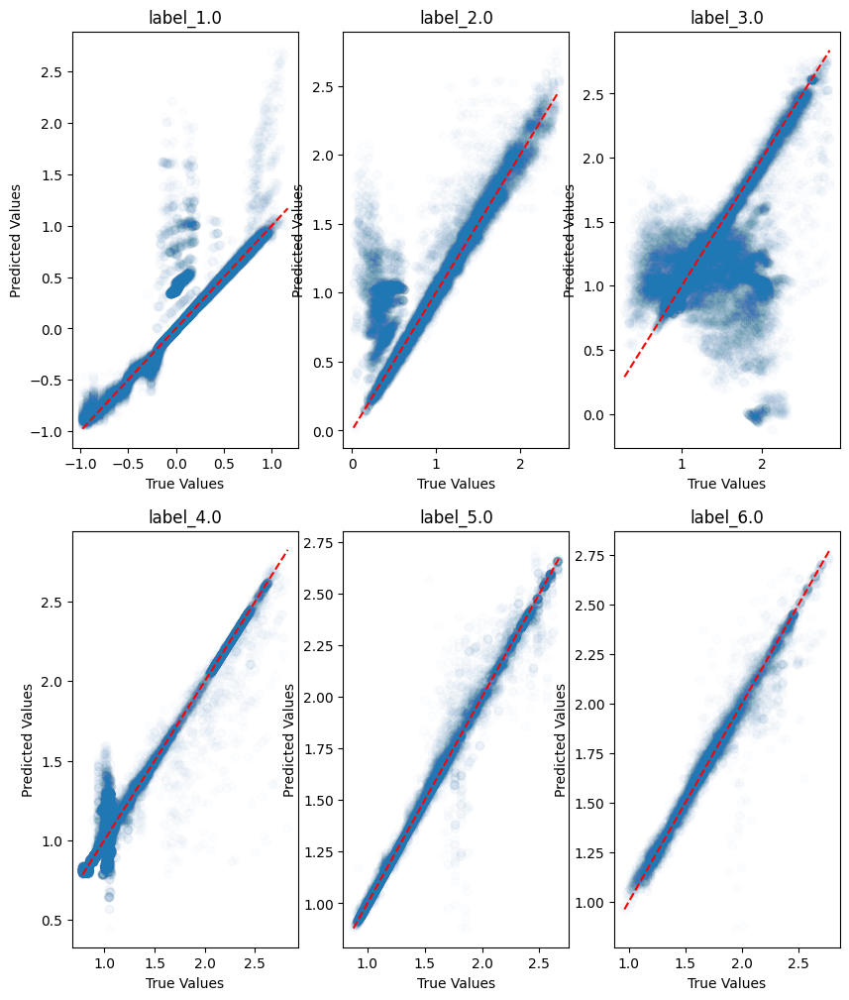

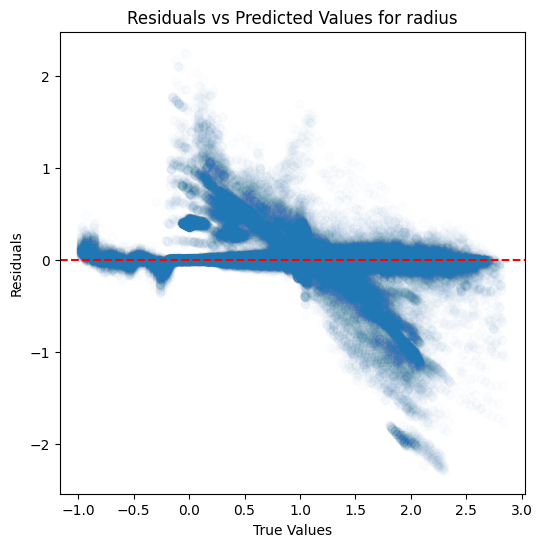

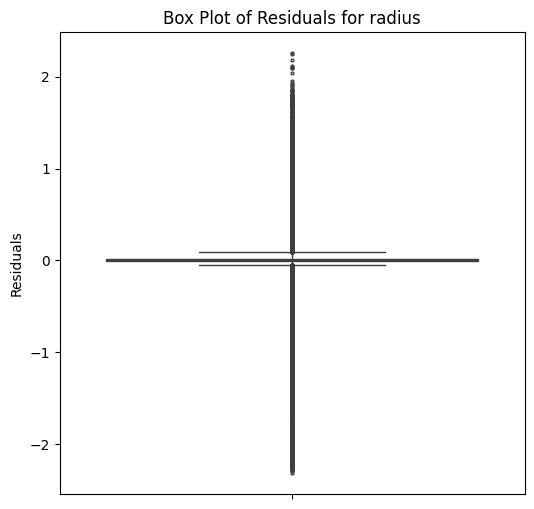

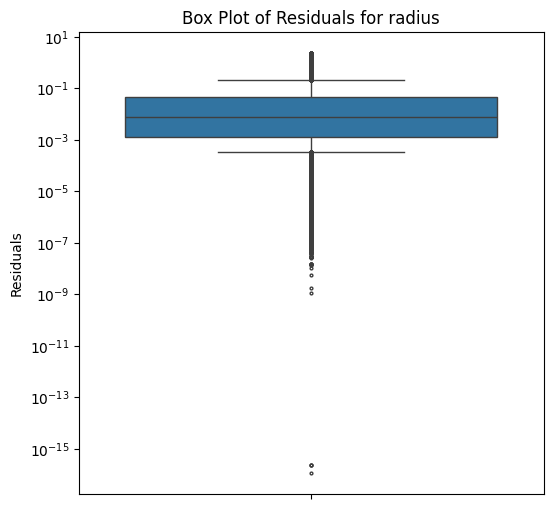

...

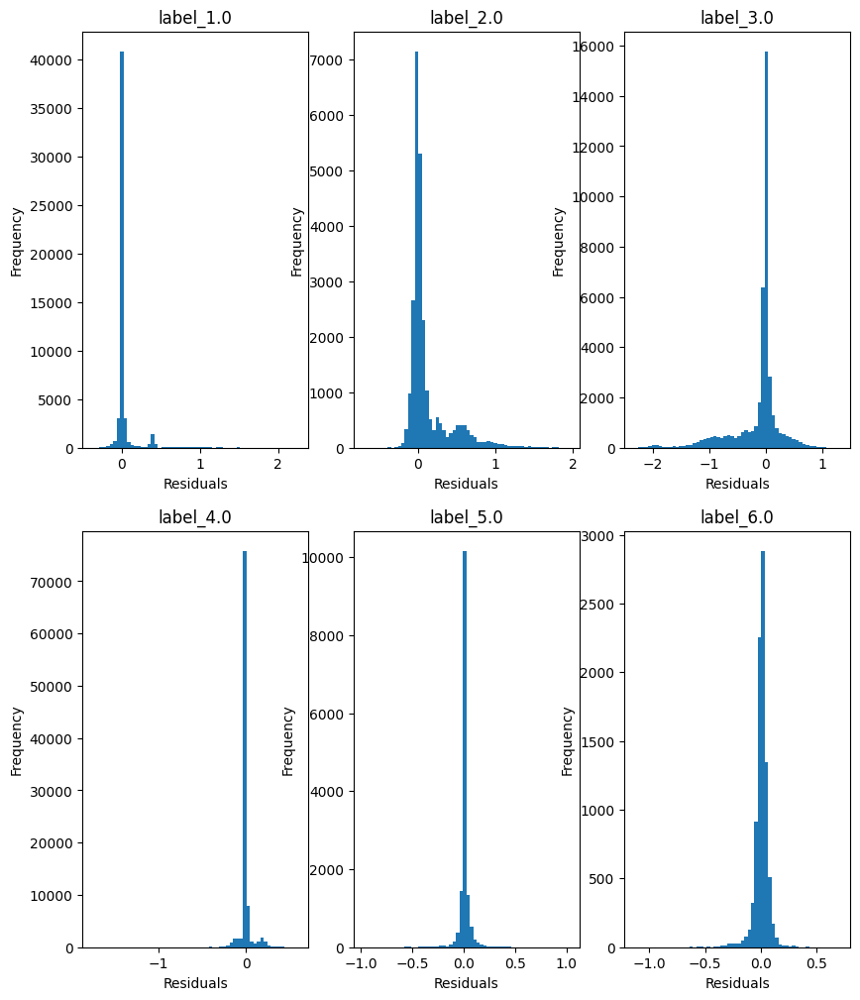

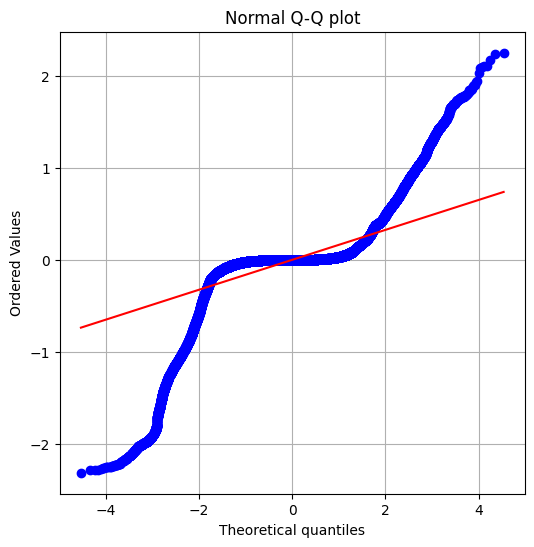

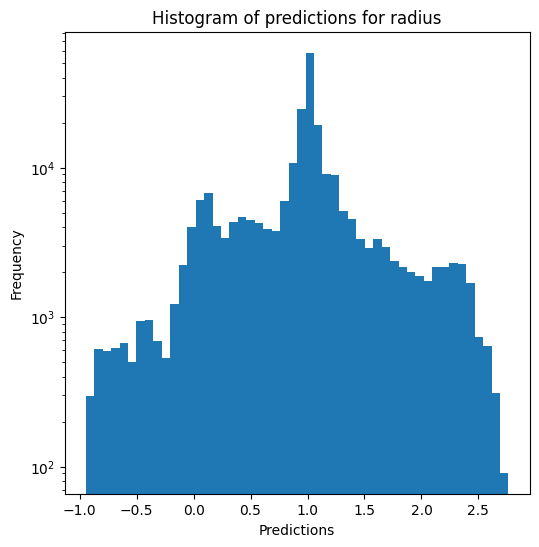

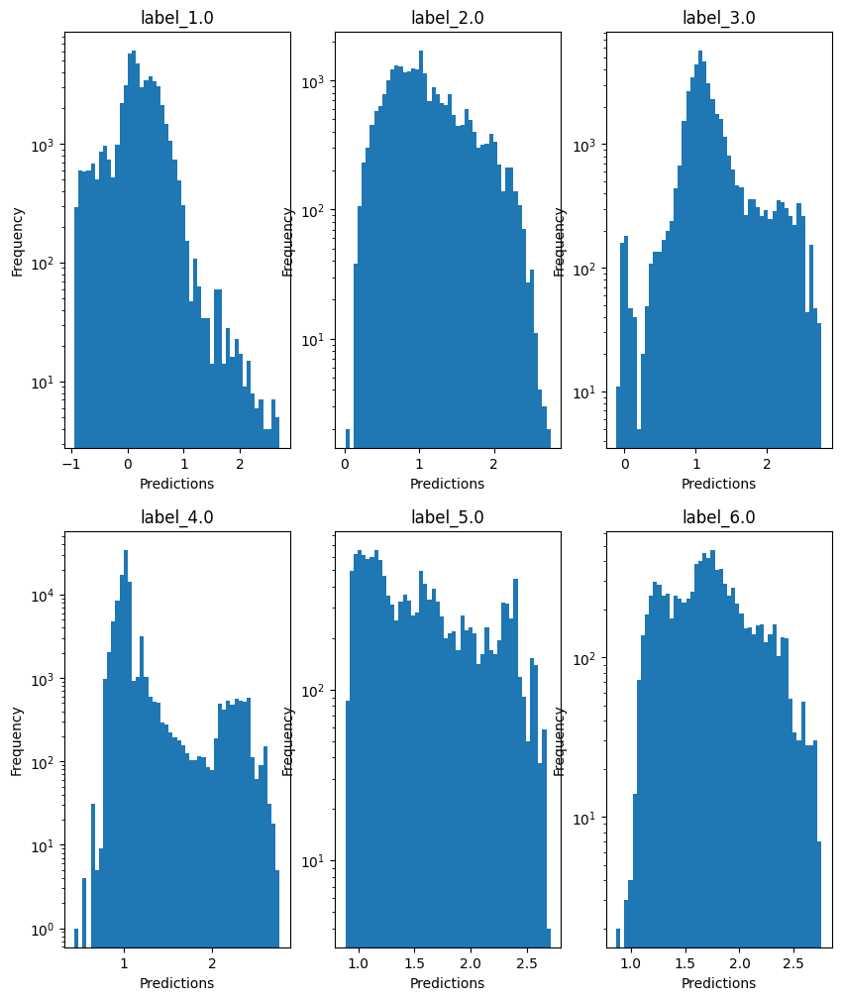

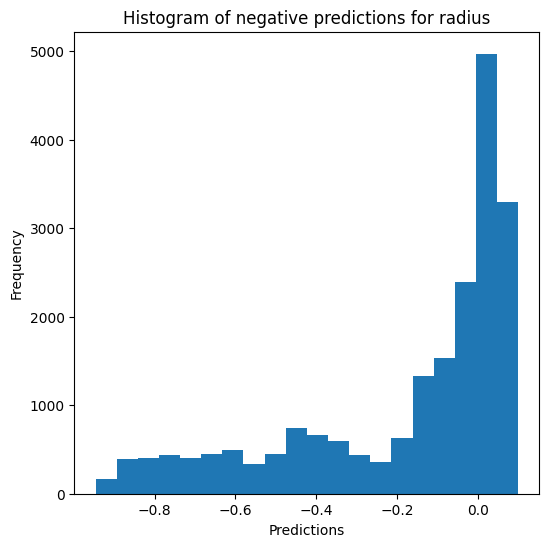

Saving predictions and results...


In [16]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [17]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9826071040761207
  RMSE :  0.03542520839887912
  MAE :  0.007378615908055003
  MedAE :  0.0002140000000041553
  CORR :  0.9913687538052447
  MAX_ER :  0.7625904000000037
  Percentiles : 
    75th percentile :  0.0024967881542079517
    90th percentile :  0.010929999999995665
    95th percentile :  0.03013989199277245
    99th percentile :  0.12940054285714755

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.9000254775738121
  RMSE :  0.055819703630690075
  MAE :  0.03250489289682332
  MedAE :  0.01620381928210768
  CORR :  0.9551140805519215
  MAX_ER :  0.7687863547619069
  Percentiles : 
    75th percentile :  0.03946946240875138
    90th percentile :  0.08377291375756735
    95th percentile :  0.1218026166666673

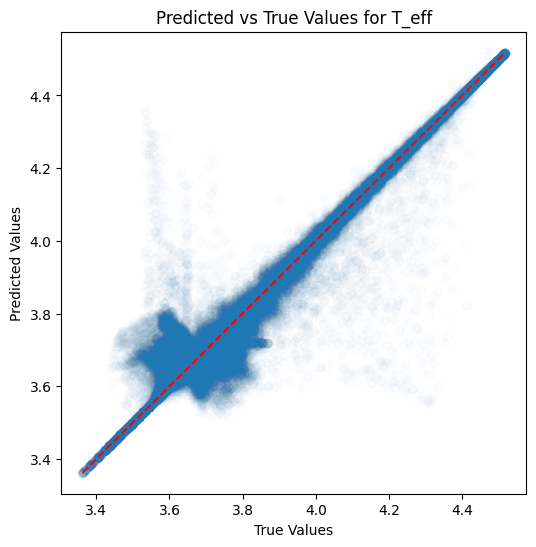

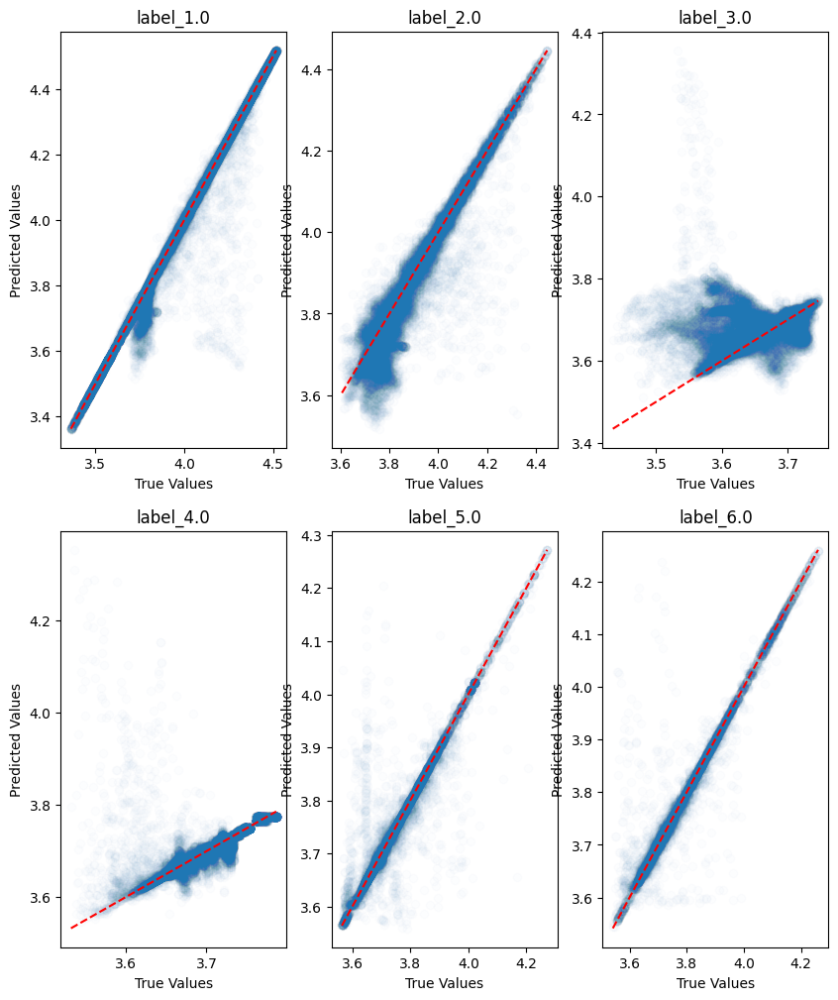

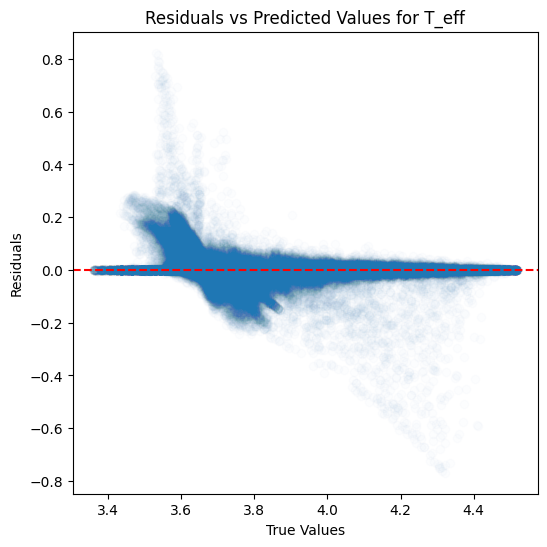

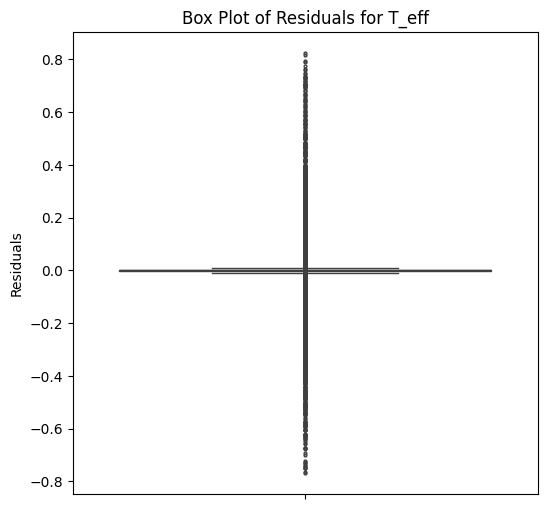

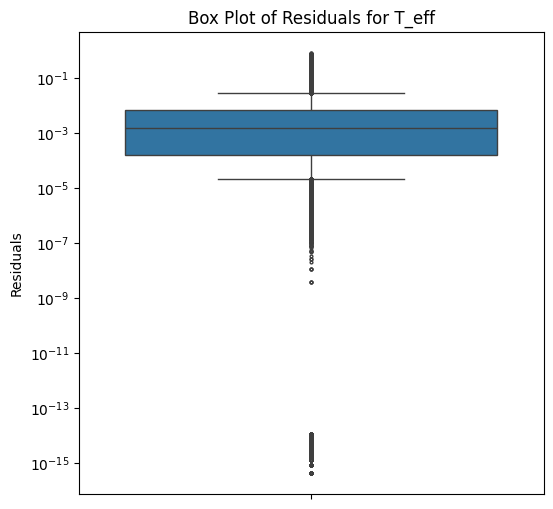

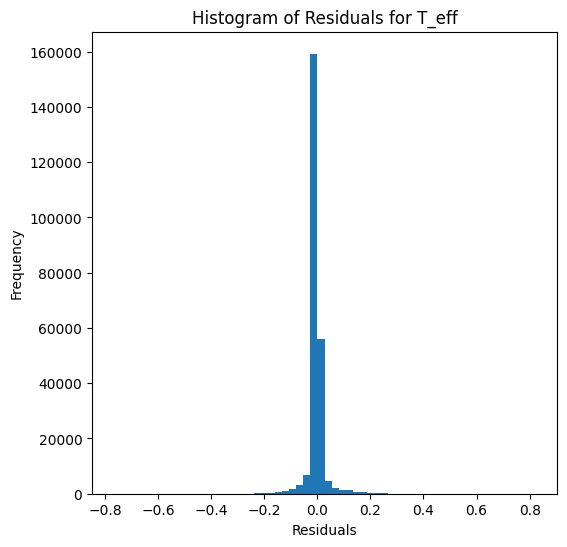

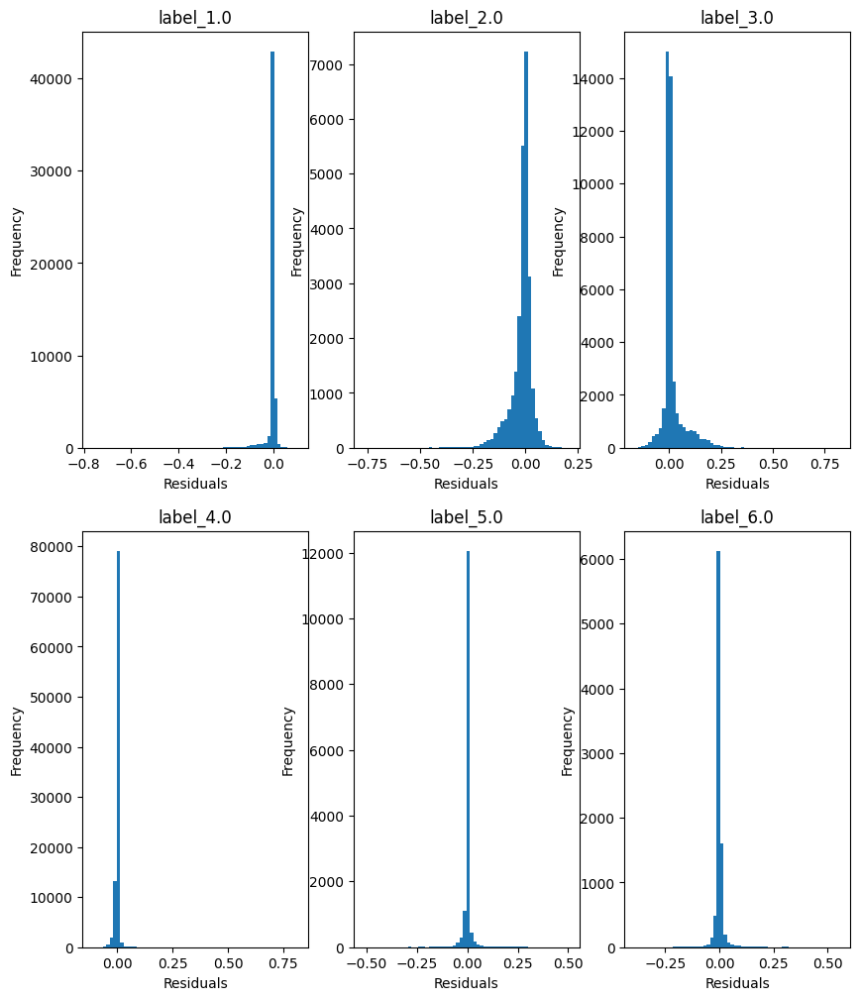

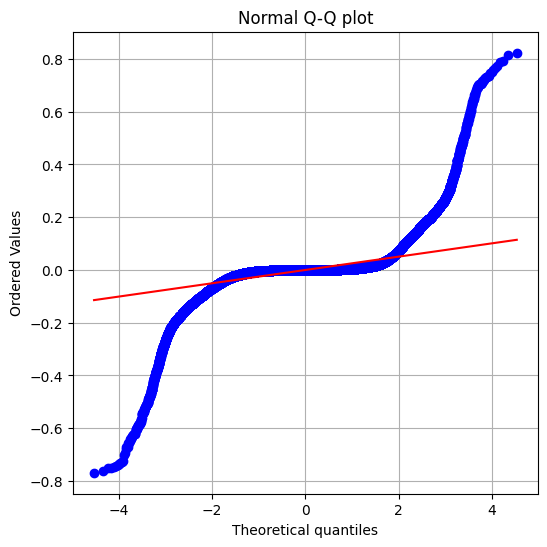

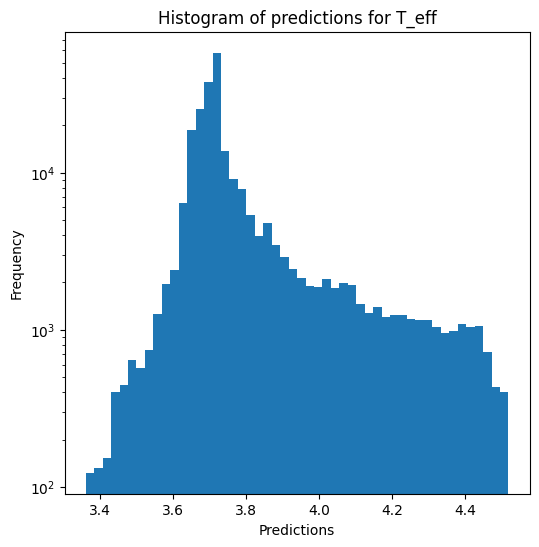

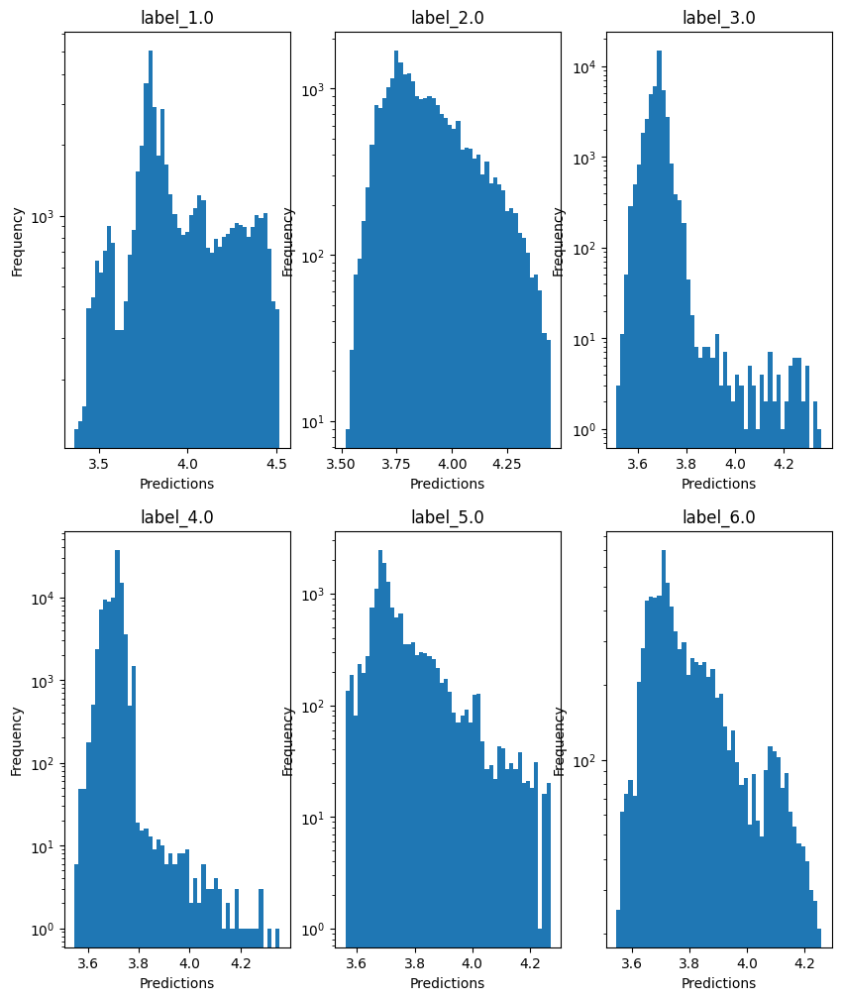


log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  0.17796533680786653
  RMSE :  0.31490679654315384
  MAE :  0.07013043813225618
  MedAE :  0.0010483511904735288
  CORR :  0.7771055642531638
  MAX_ER :  4.042868332935551
  Percentiles : 
    75th percentile :  0.006929999999995218
    90th percentile :  0.049026851190481
    95th percentile :  0.32368996726190224
    99th percentile :  1.754570485708389

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.46443176397499897
  RMSE :  0.631137141180463
  MAE :  0.2890608122150109
  MedAE :  0.06794770202020417
  CORR :  0.7382704203912901
  MAX_ER :  3.5730589353388713
  Percentiles : 
    75th percentile :  0.19469441666666742
    90th percentile :  1.030088341666666
    95th percentile :  1.6609511003968231
    99th percentile :  2.6243068354072427

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE

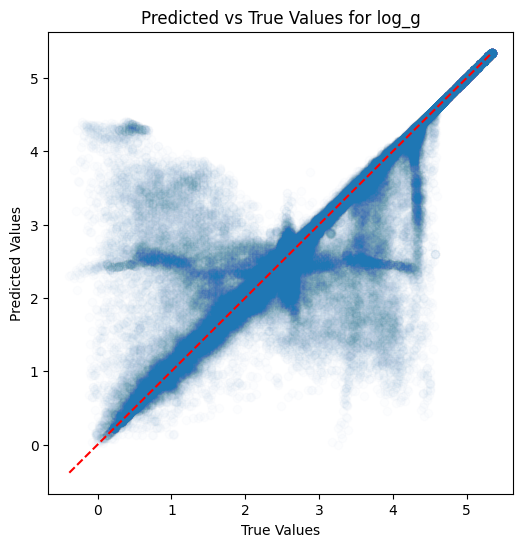

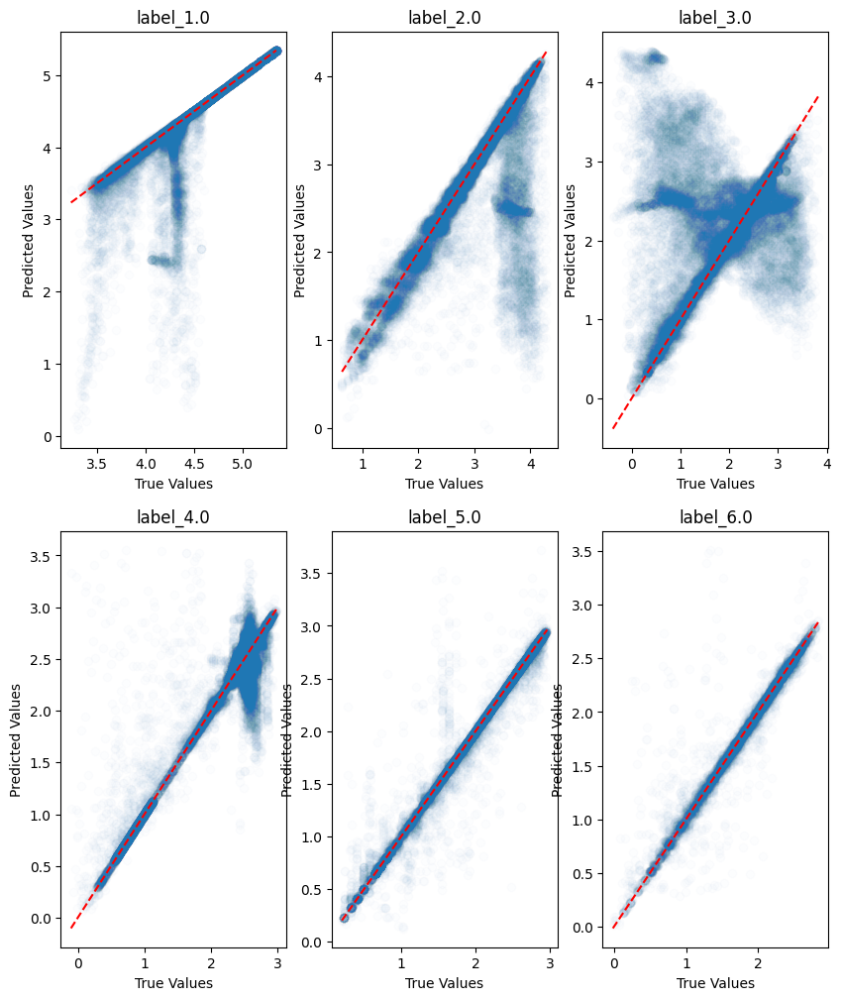

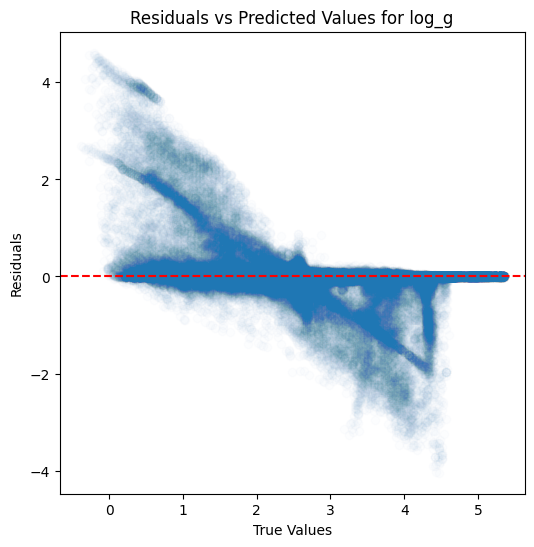

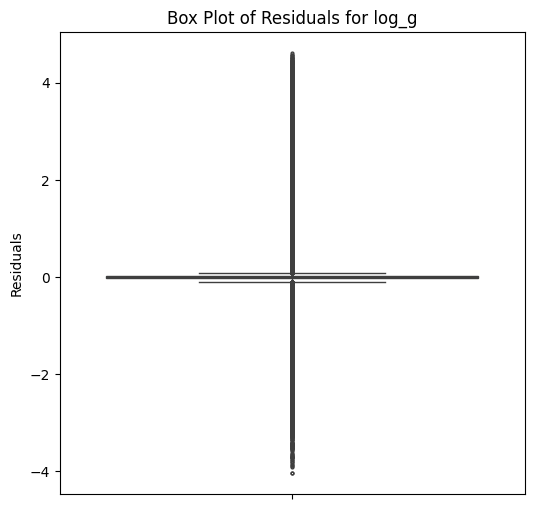

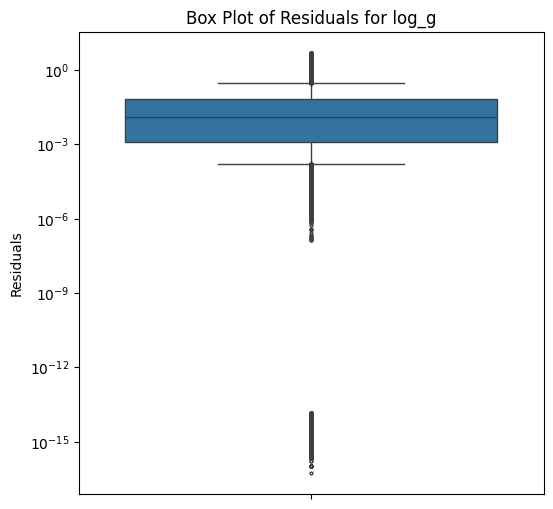

...

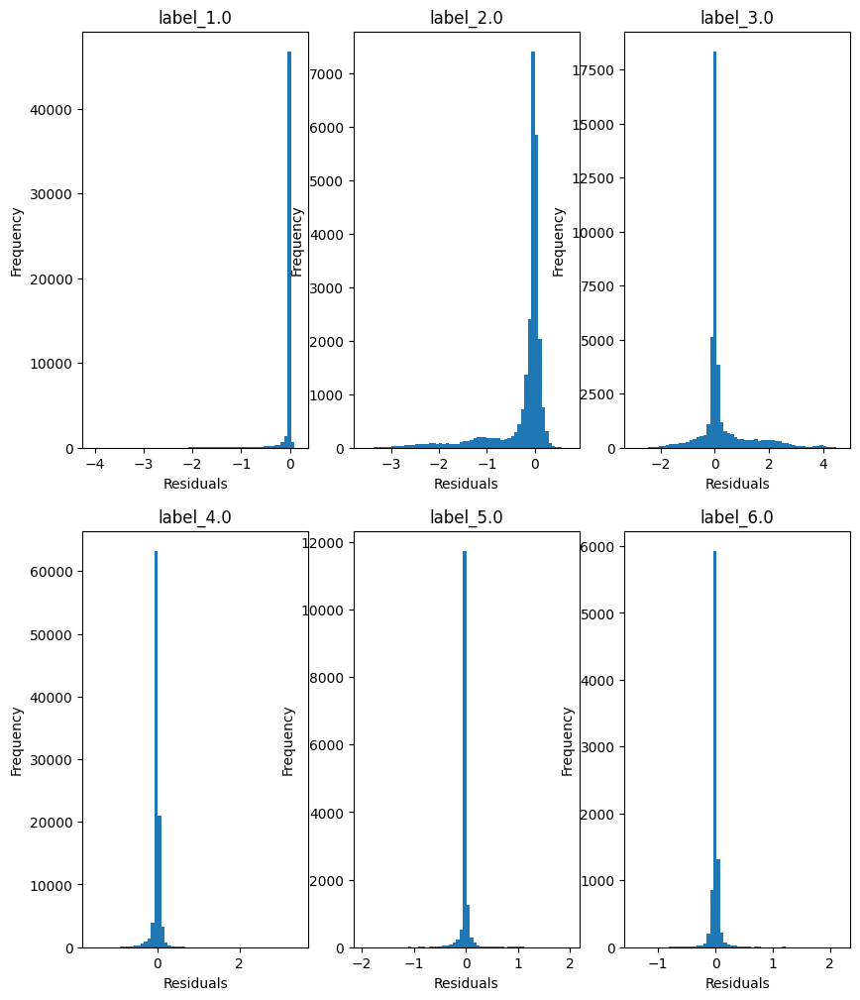

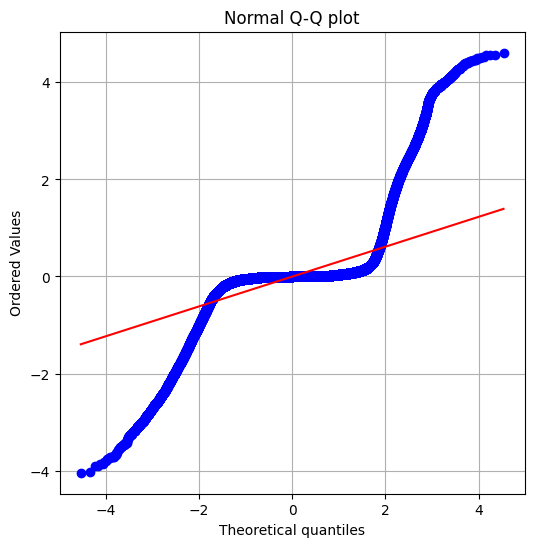

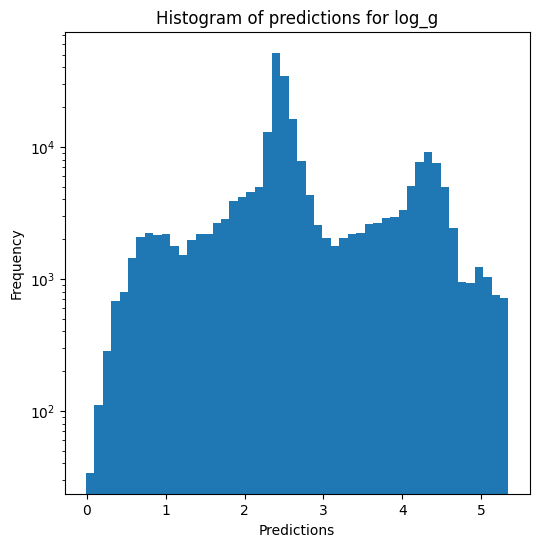

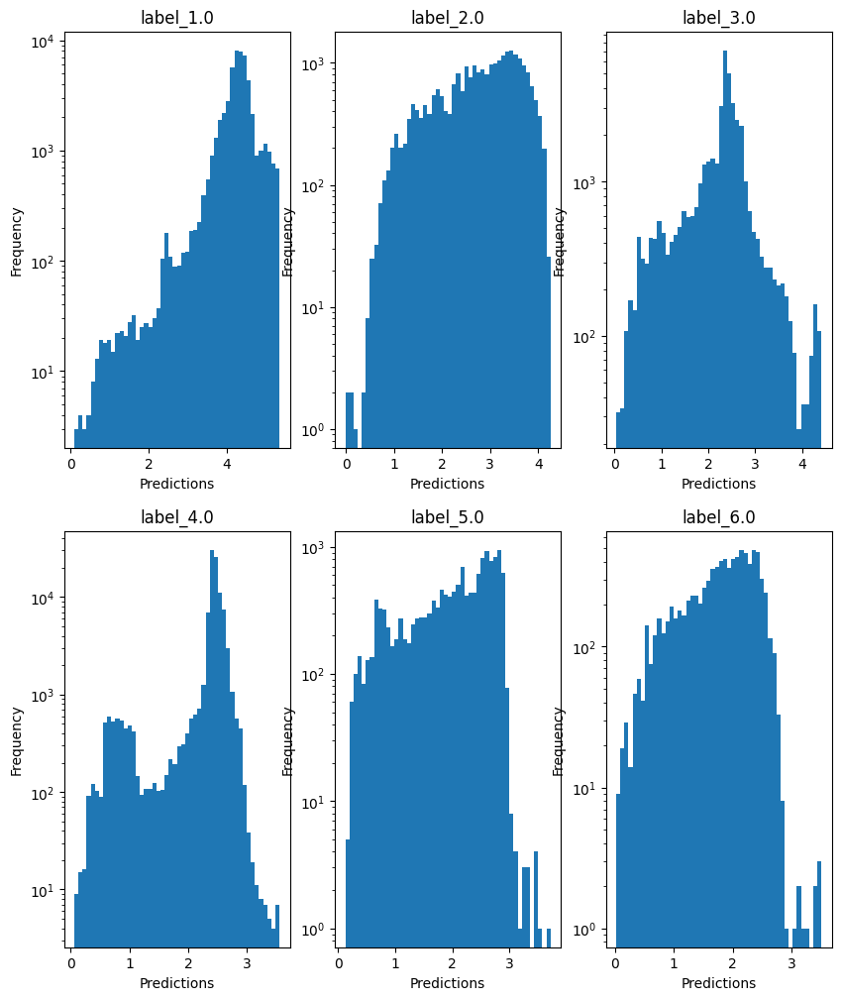

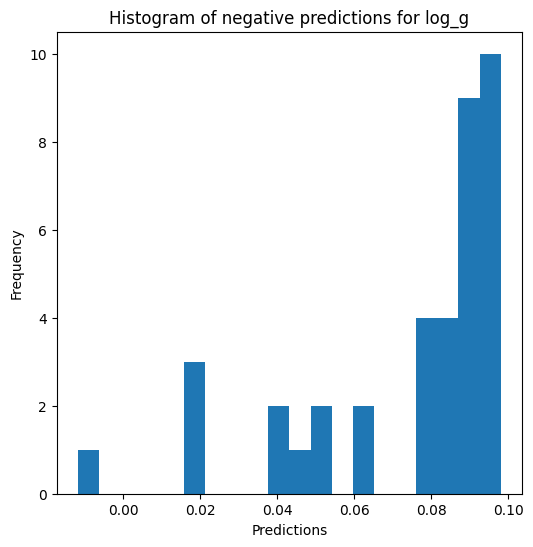


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.8228689353429535
  RMSE :  0.15762211525163705
  MAE :  0.035271058057040304
  MedAE :  0.0006064913887865141
  CORR :  0.9233222632239165
  MAX_ER :  2.0216293875336335
  Percentiles : 
    75th percentile :  0.004021360424879083
    90th percentile :  0.024995101697141614
    95th percentile :  0.16216815428142867
    99th percentile :  0.8794655239836732

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.7080932101390345
  RMSE :  0.3155800973965687
  MAE :  0.14458212130981843
  MedAE :  0.0340053943020035
  CORR :  0.8455906708143831
  MAX_ER :  1.7863686820955194
  Percentiles : 
    75th percentile :  0.09735939596194693
    90th percentile :  0.5152855412201816
    95th percentile :  0.8311299569203908
    99th percentile :  1.3119937874665086

radius results for the label categ

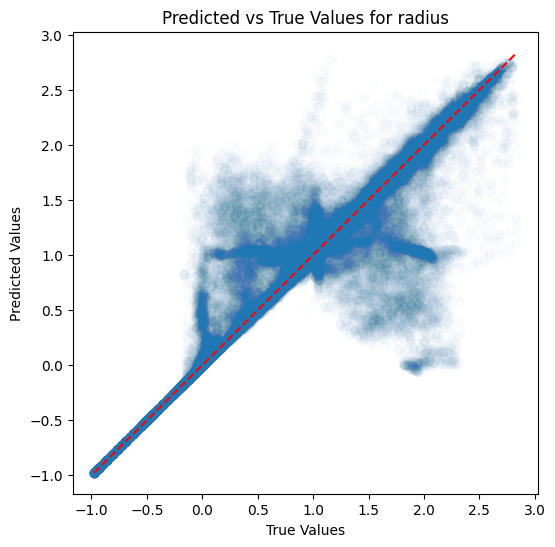

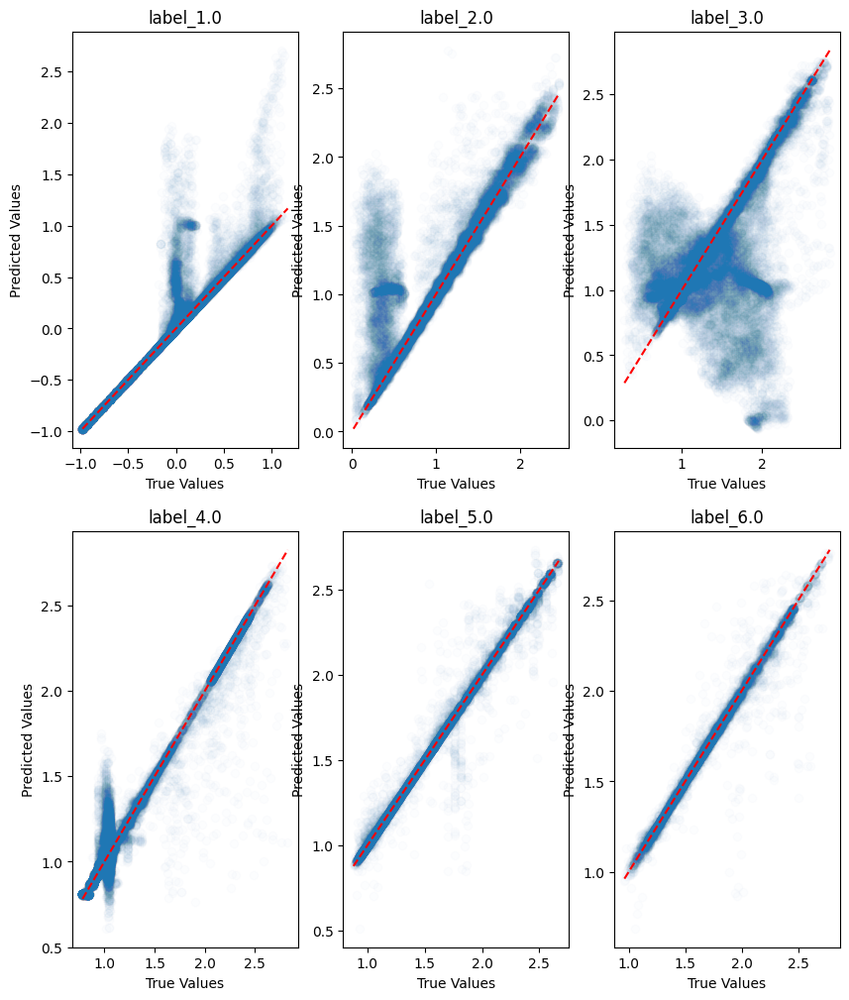

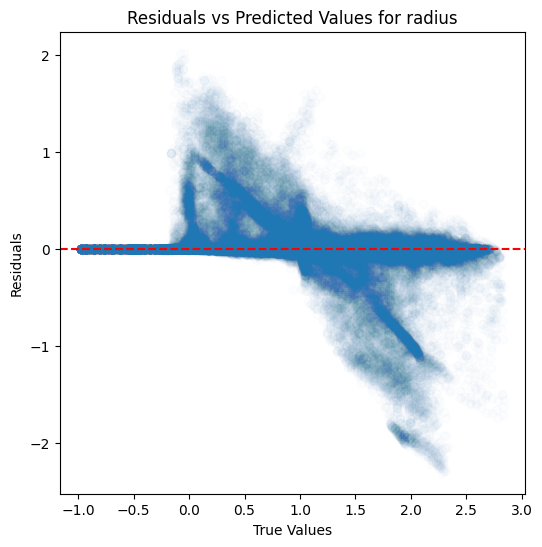

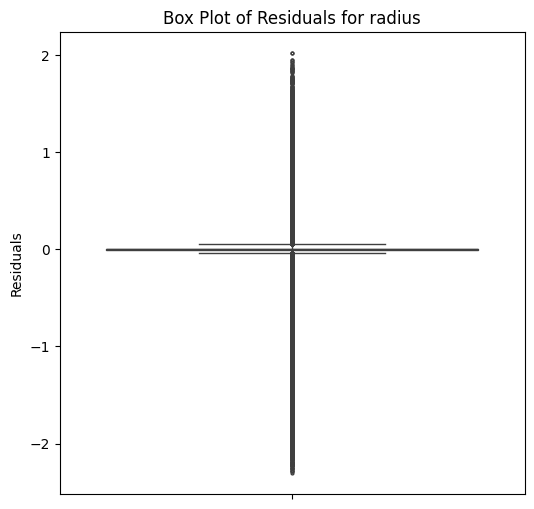

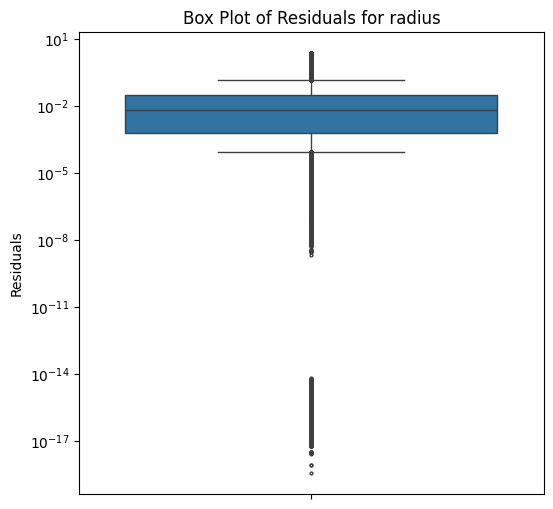

...

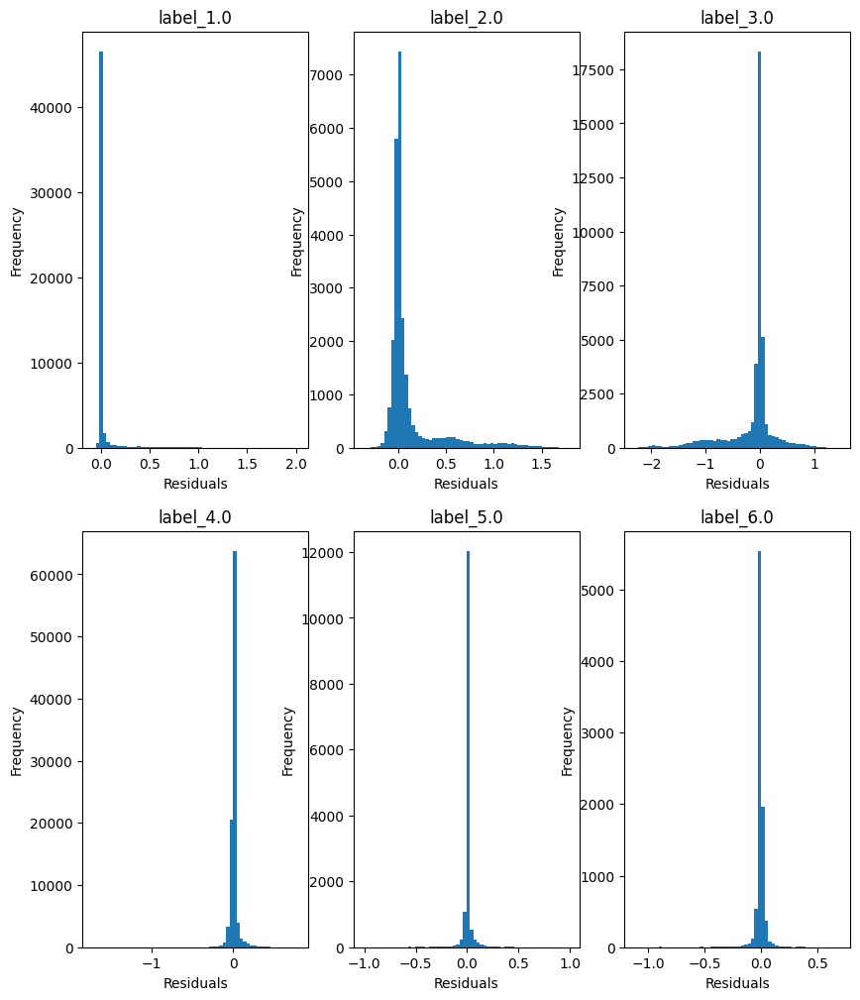

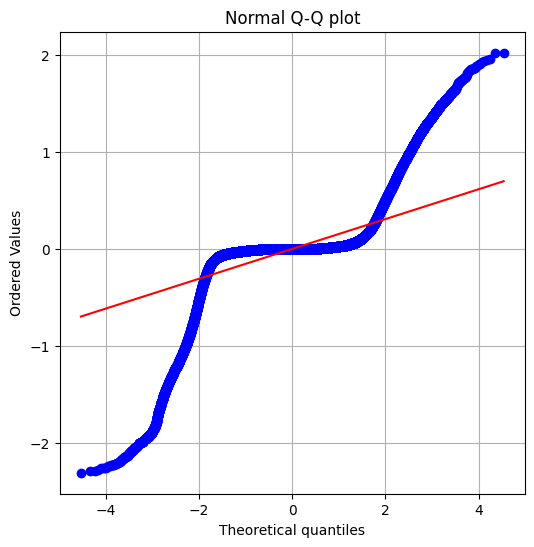

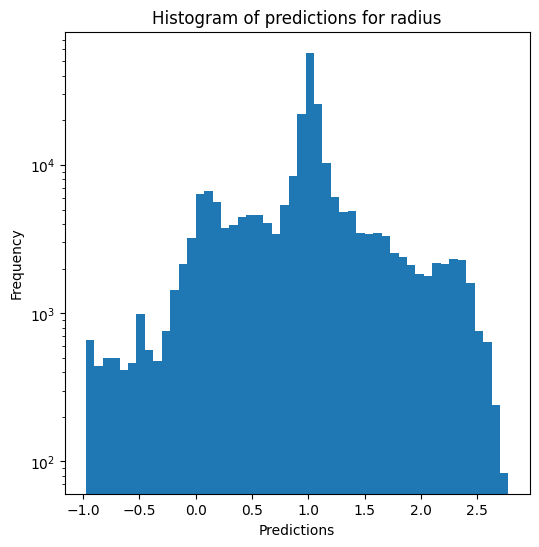

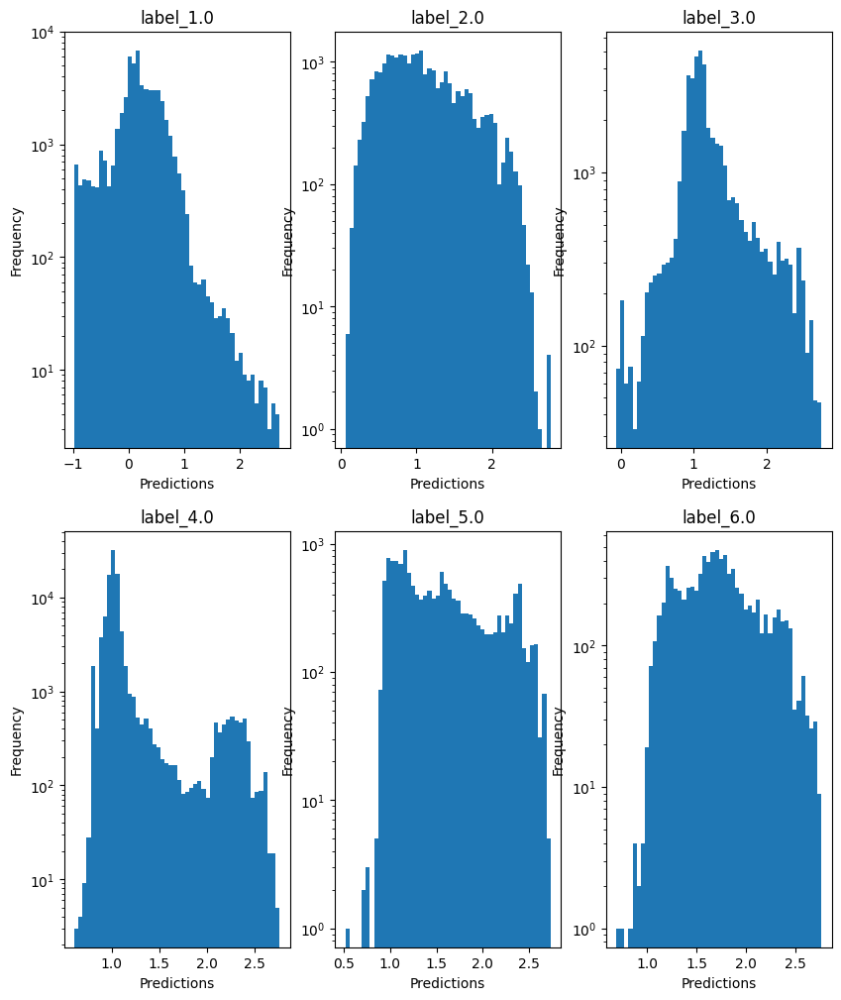

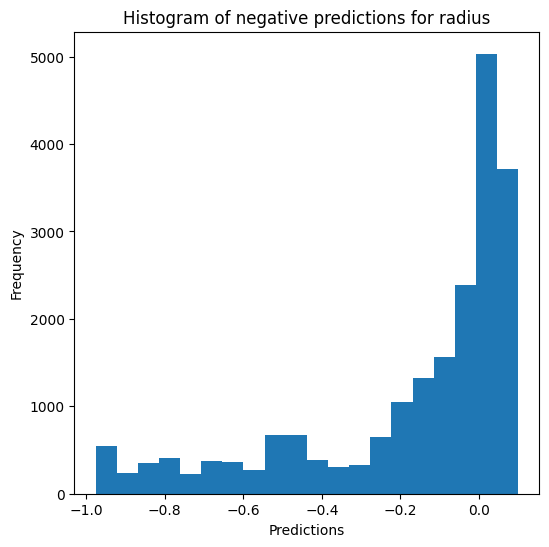

Saving predictions and results...


In [18]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [19]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9038442331107571
  RMSE :  0.08962670440449272
  MAE :  0.04417235471125925
  MedAE :  0.016741571044921688
  CORR :  0.9514993162229756
  MAX_ER :  0.6866977333068851
  Percentiles : 
    75th percentile :  0.04702252788543726
    90th percentile :  0.10039197082519546
    95th percentile :  0.19336709203720126
    99th percentile :  0.44391429883956895

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.2372964557248708
  RMSE :  0.1630573805357989
  MAE :  0.12275138643046601
  MedAE :  0.08946398277282719
  CORR :  0.5052264532540854
  MAX_ER :  0.6773447437286375
  Percentiles : 
    75th percentile :  0.1683323019981381
    90th percentile :  0.2753485493850709
    95th percentile :  0.35018001647949193
    99t

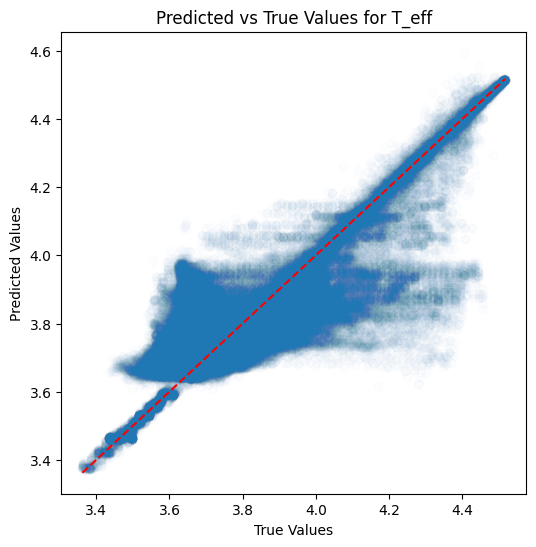

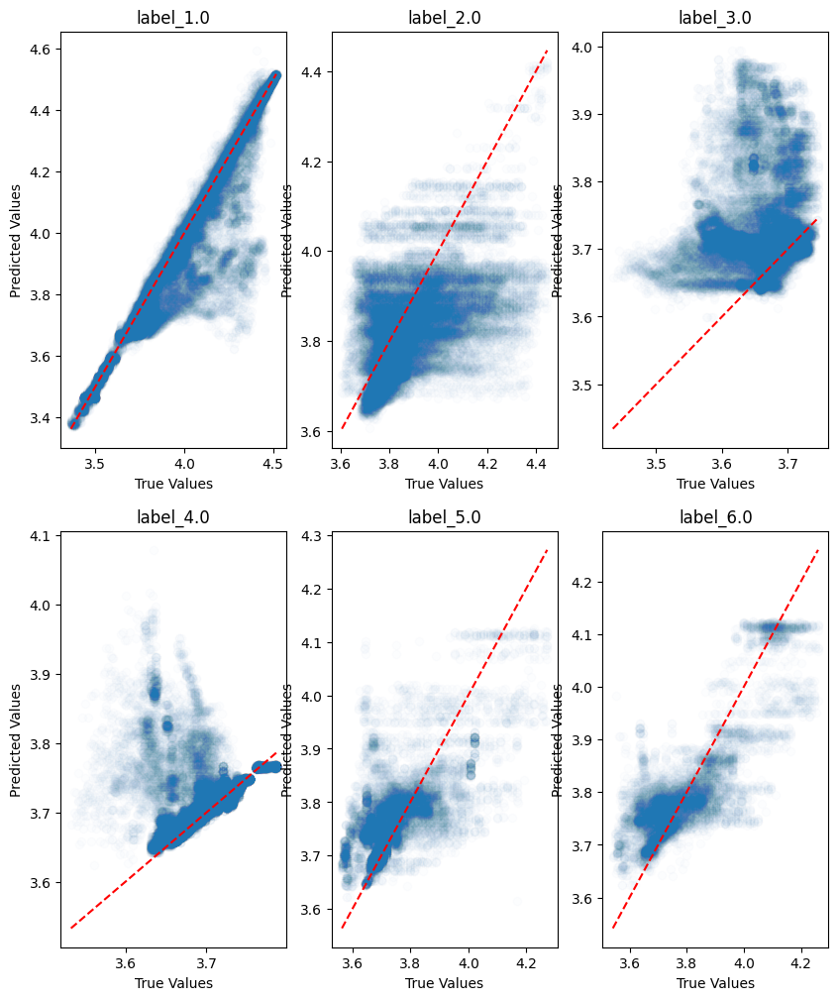

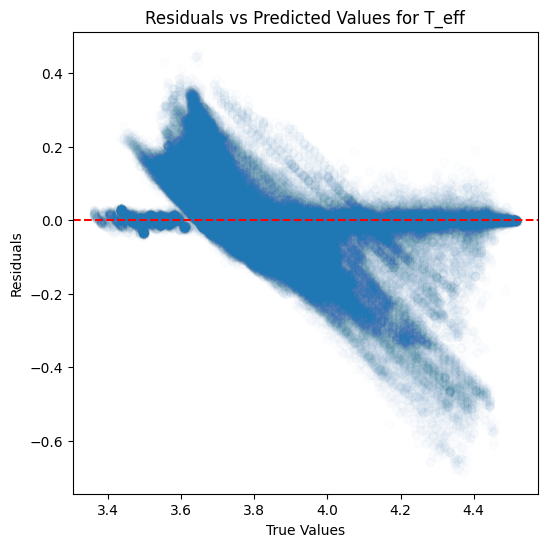

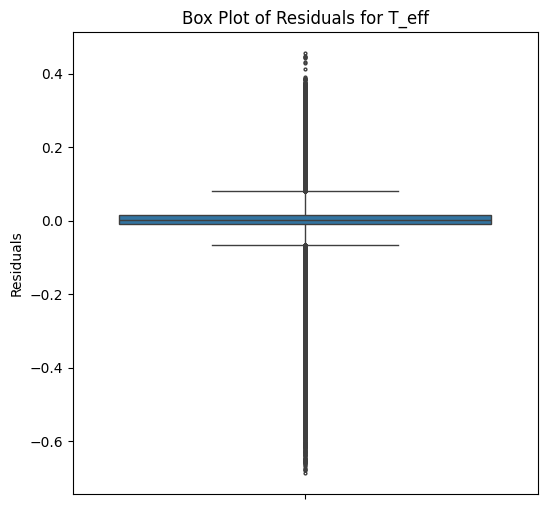

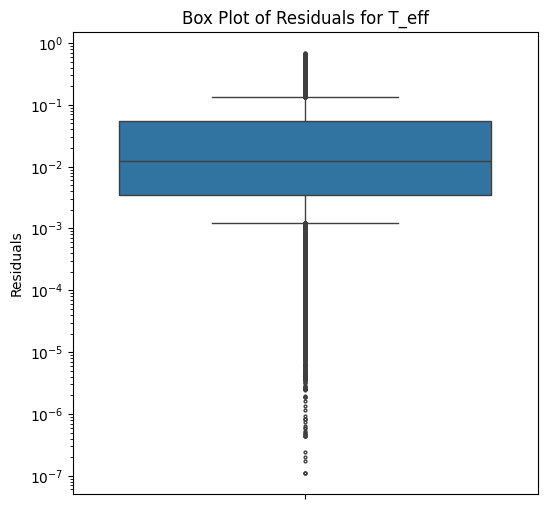

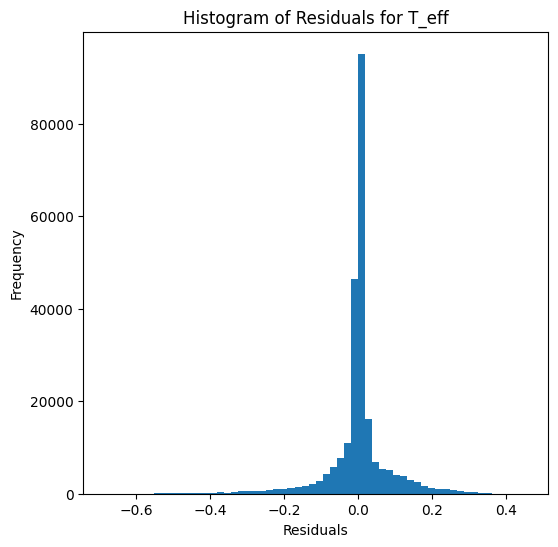

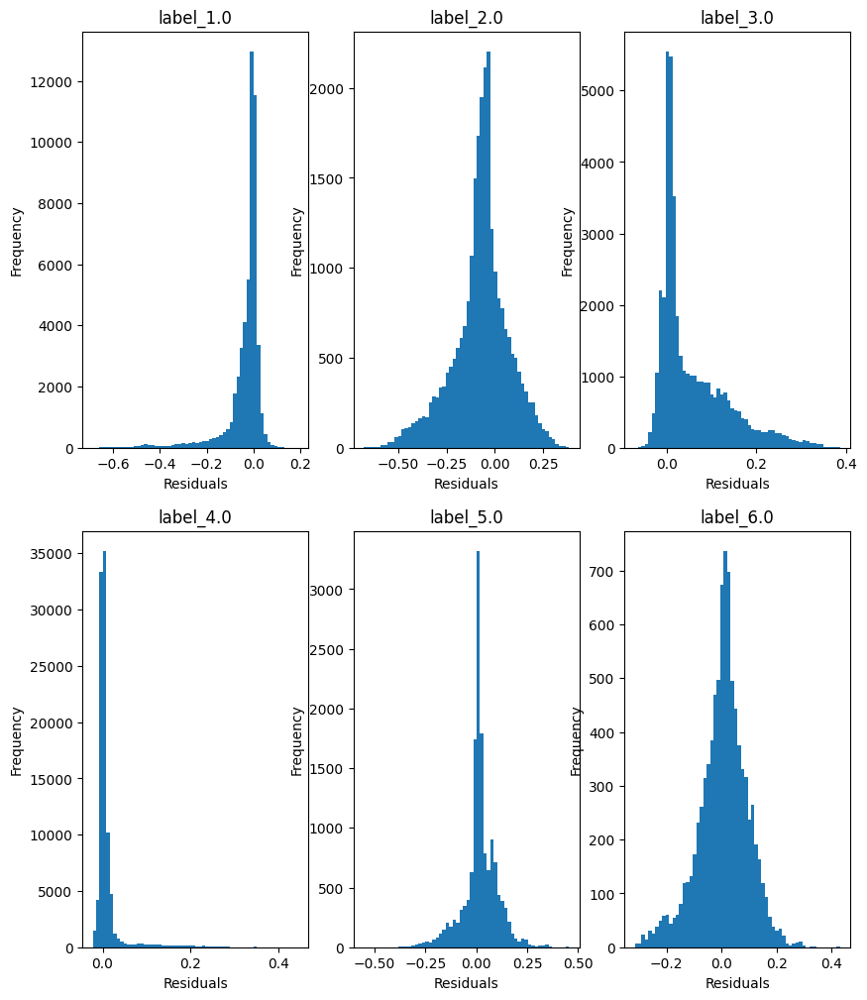

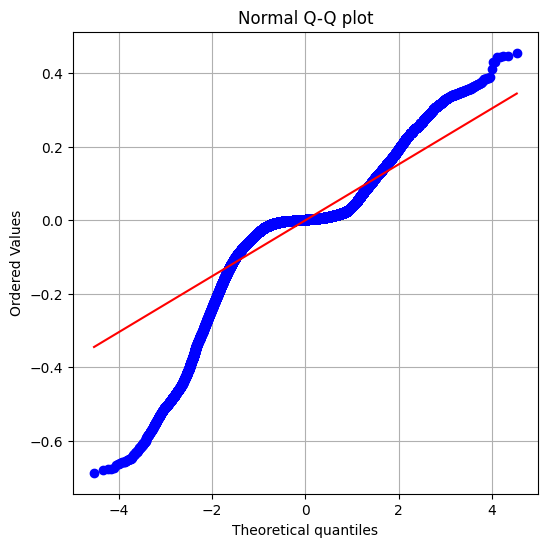

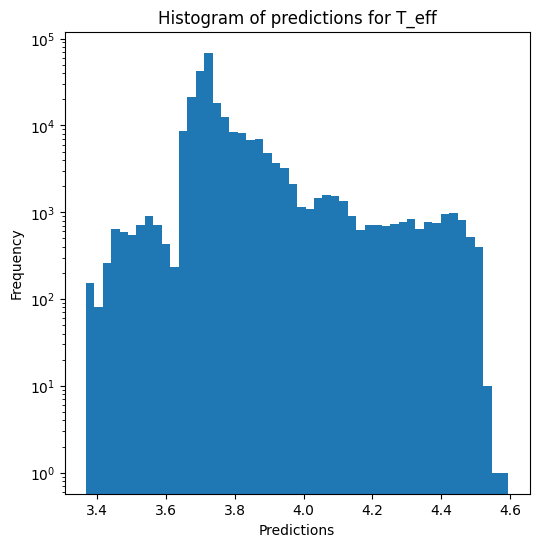

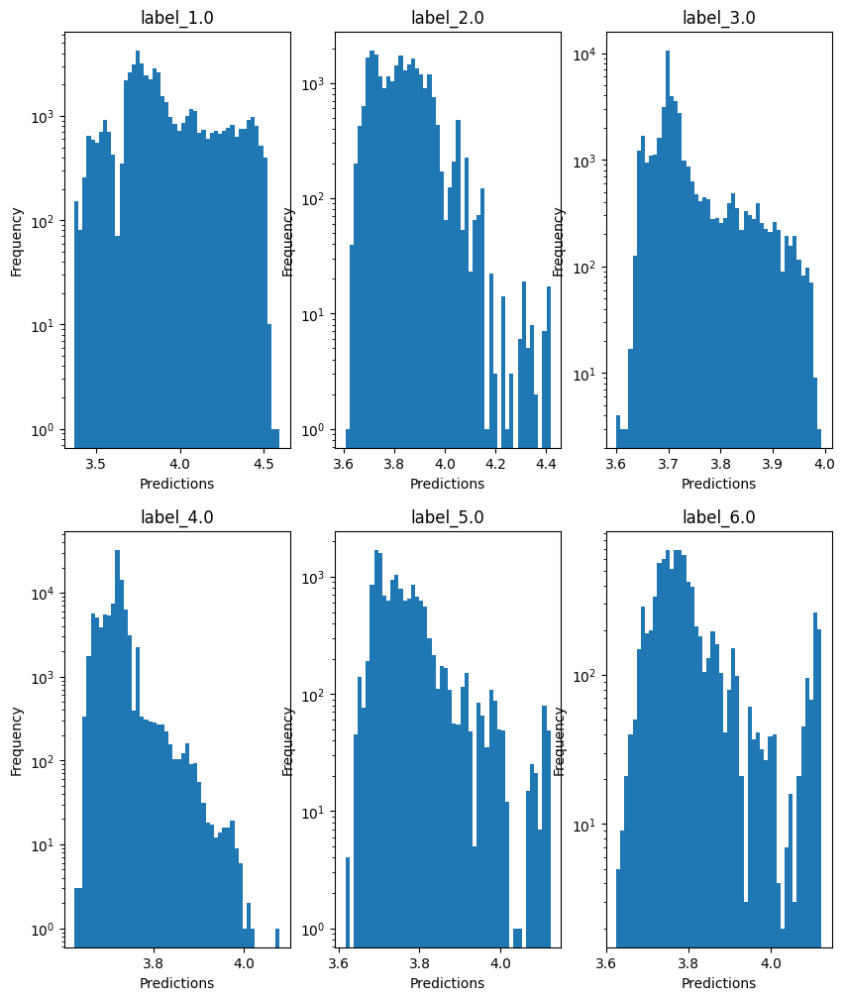

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -0.9907199861069069
  RMSE :  0.5507711337222573
  MAE :  0.3172140422000257
  MedAE :  0.08854450988769536
  CORR :  0.8124836489324698
  MAX_ER :  4.072691186189651
  Percentiles : 
    75th percentile :  0.43212290954589827
    90th percentile :  1.0135090532302855
    95th percentile :  1.336946077823639
    99th percentile :  1.8999134341239925

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.34277234276374957
  RMSE :  0.8299579415930528
  MAE :  0.6692475555878726
  MedAE :  0.5825221471786499
  CORR :  0.6065642350105106
  MAX_ER :  2.6858885159492494
  Percentiles : 
    75th percentile :  1.0243600873947143
    90th percentile :  1.3419284762382504
    95th percentile :  1.540971980857849
    99th percentile :  1.9937467969989788

log_g results for the label category with a value of 3.0
  value range :  -0.384 

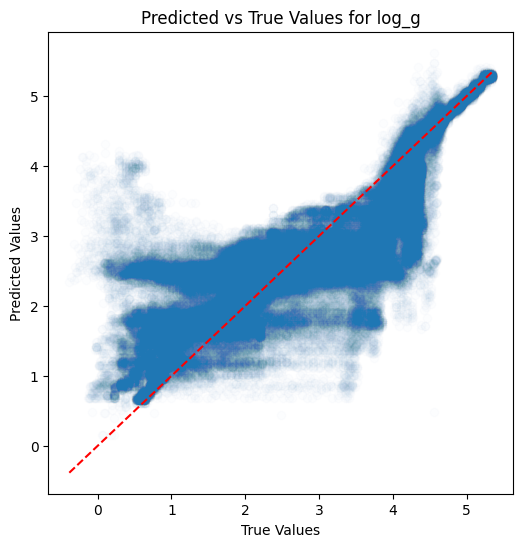

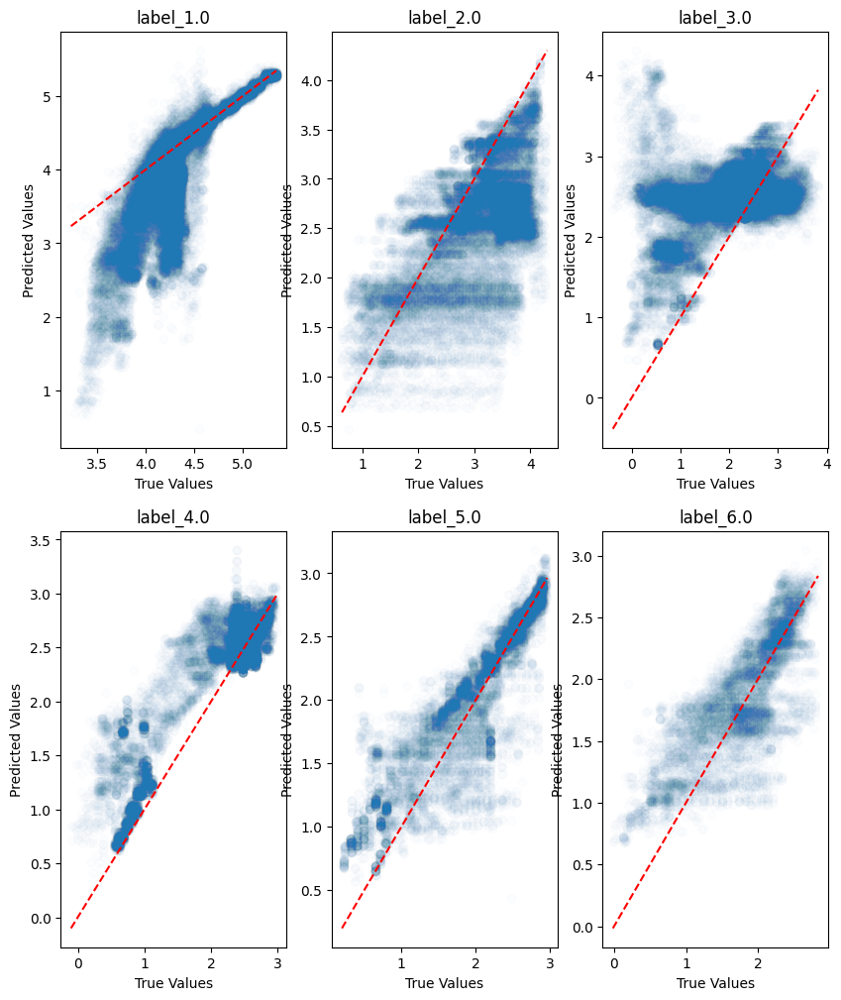

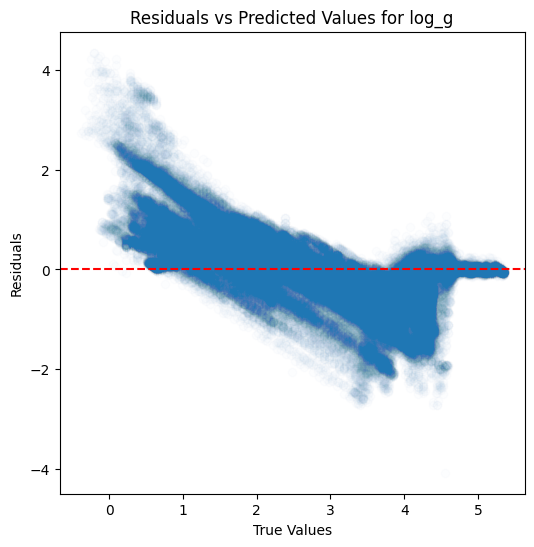

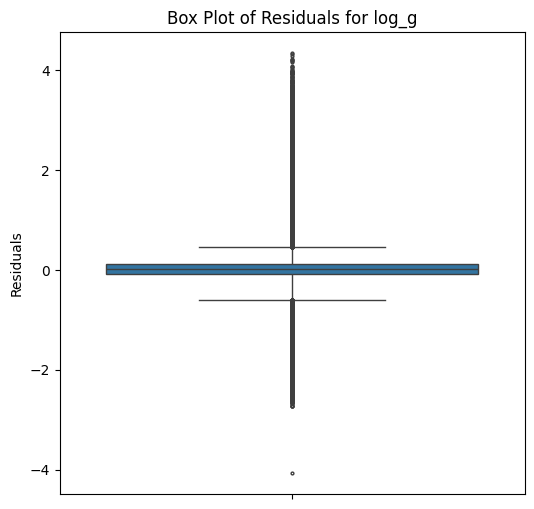

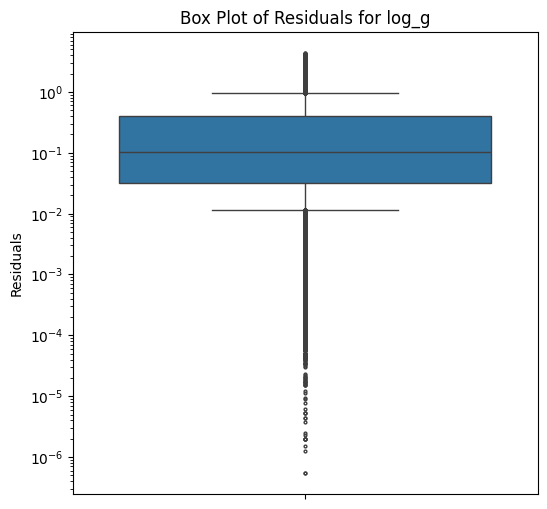

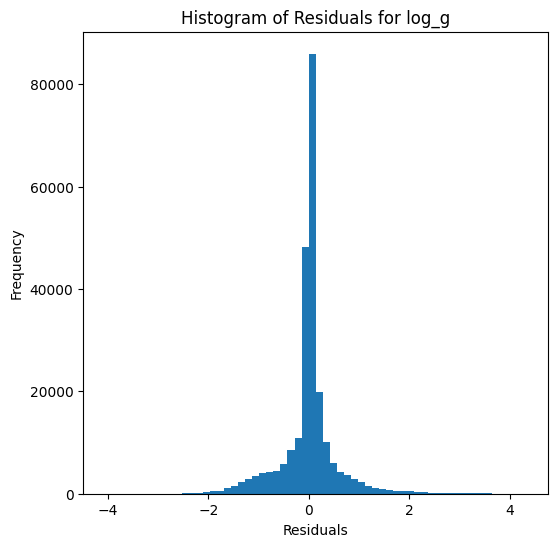

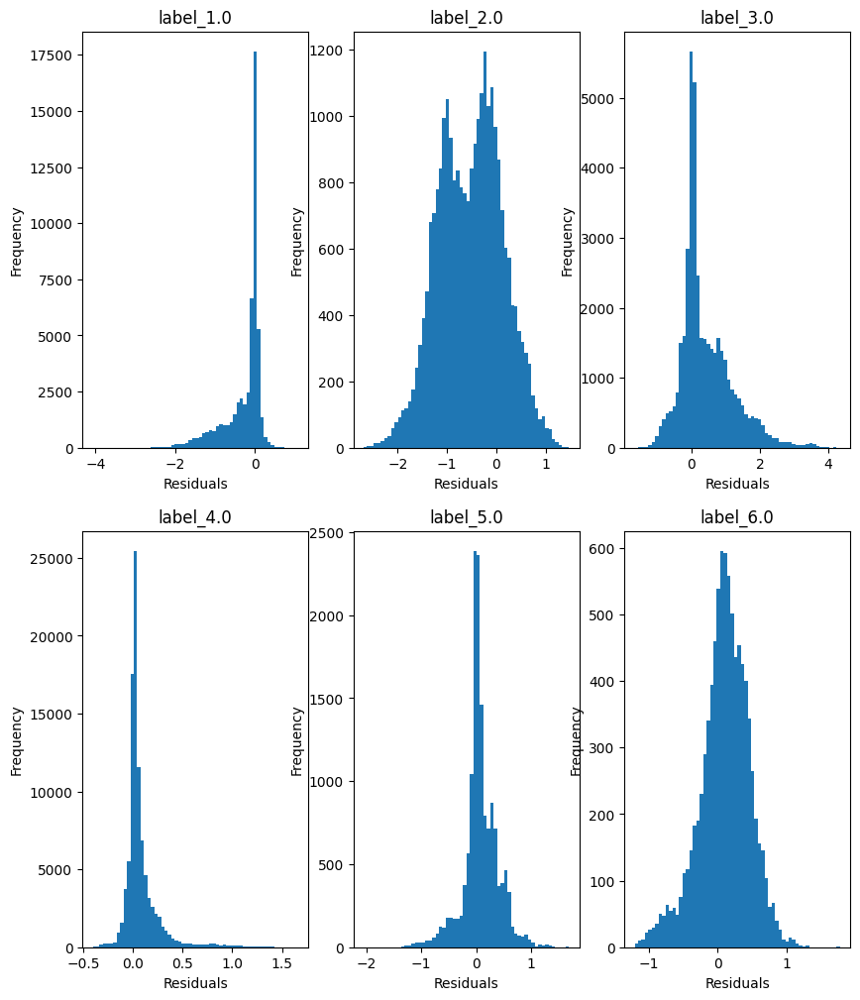

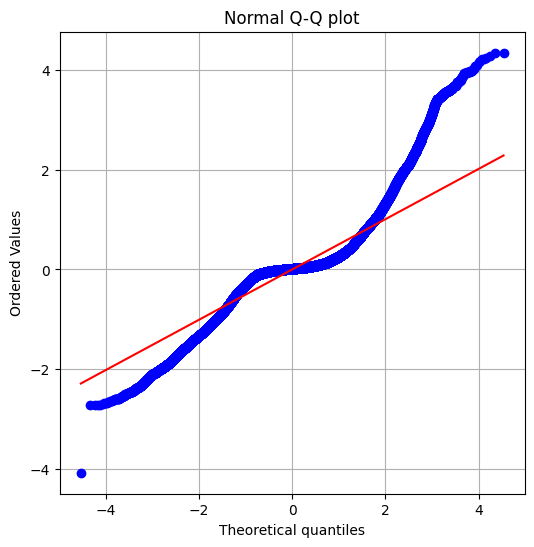

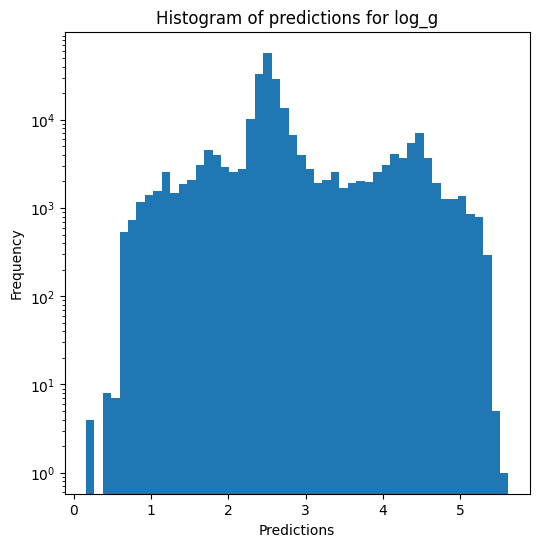

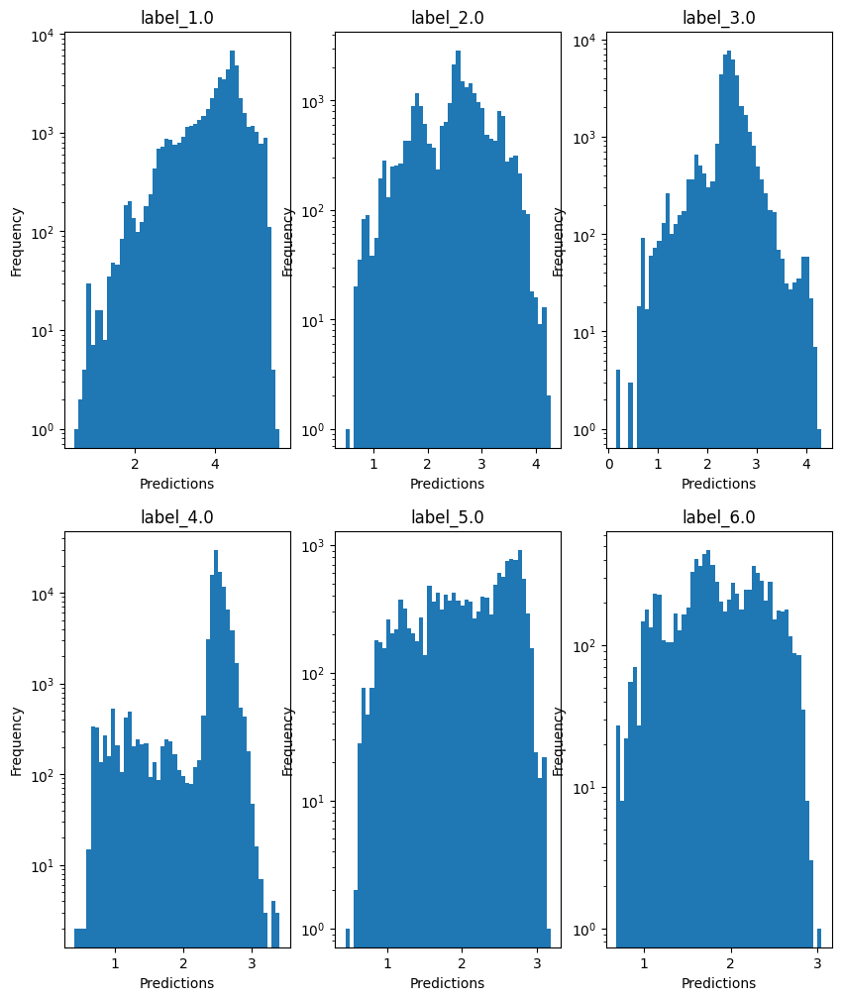


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.5623545428425764
  RMSE :  0.2779588529566951
  MAE :  0.16138576357015022
  MedAE :  0.05116838738406146
  CORR :  0.8813293694382052
  MAX_ER :  1.6562725388511788
  Percentiles : 
    75th percentile :  0.21326754292980948
    90th percentile :  0.5222172655877285
    95th percentile :  0.6726172349179611
    99th percentile :  0.9498937524864218

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.6408192851577292
  RMSE :  0.41533871727790267
  MAE :  0.3345949739899796
  MedAE :  0.2903511428095715
  CORR :  0.8008519306535477
  MAX_ER :  1.3488698334705533
  Percentiles : 
    75th percentile :  0.5138582400079709
    90th percentile :  0.670420110274085
    95th percentile :  0.7663861655944696
    99th percentile :  0.999660352683678

radius results for the label category with a 

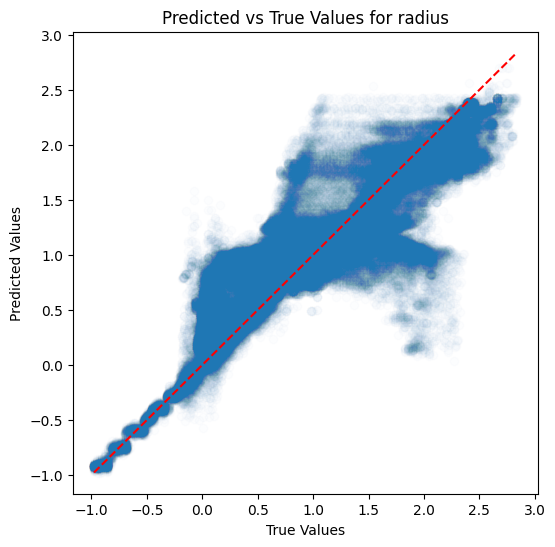

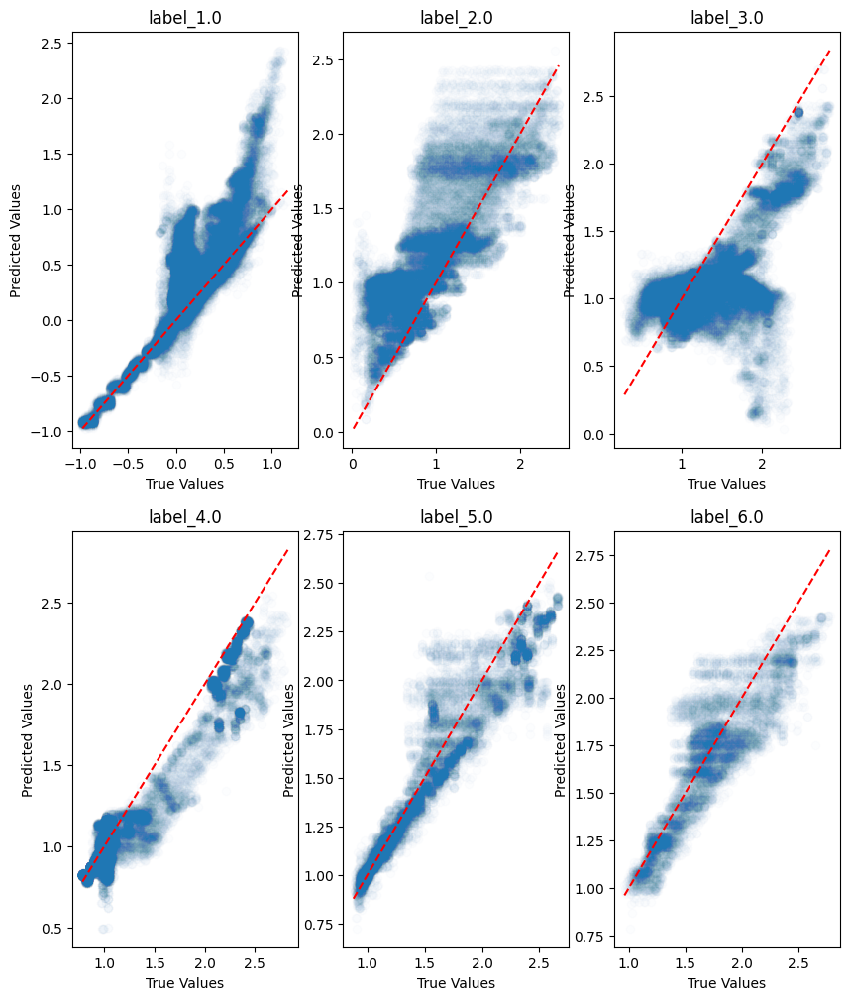

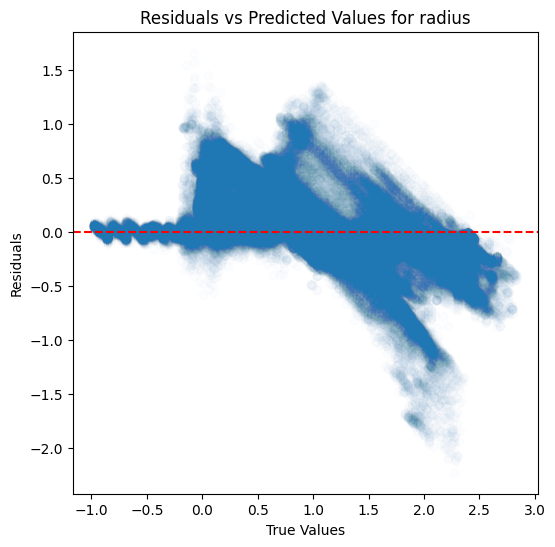

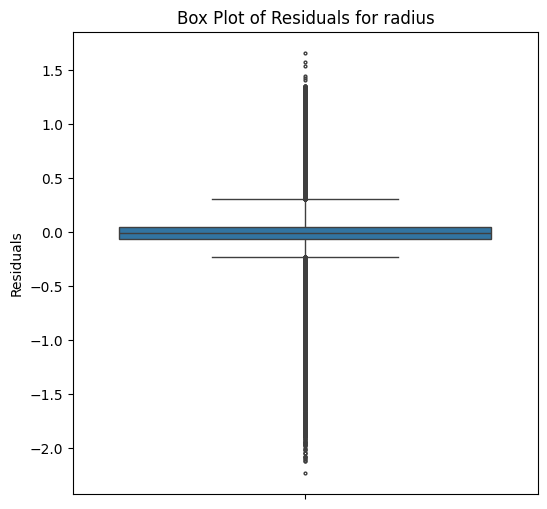

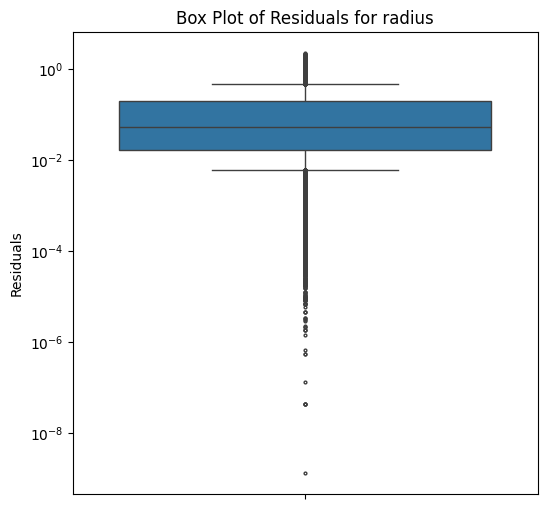

...

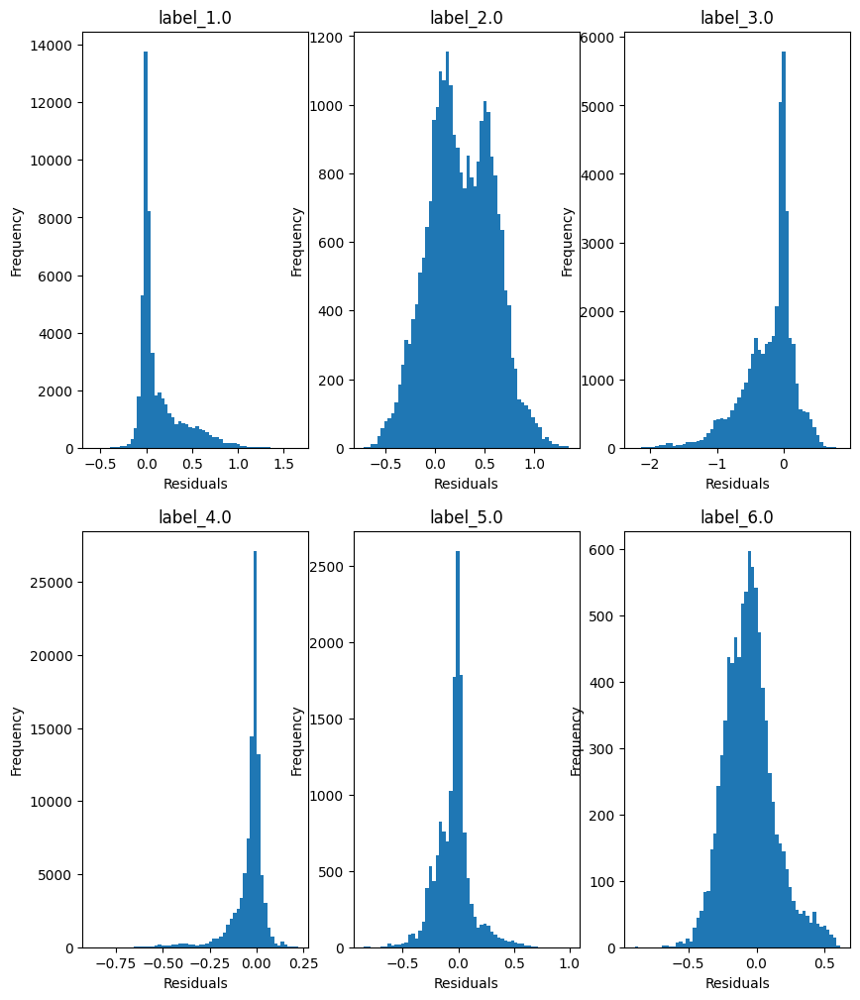

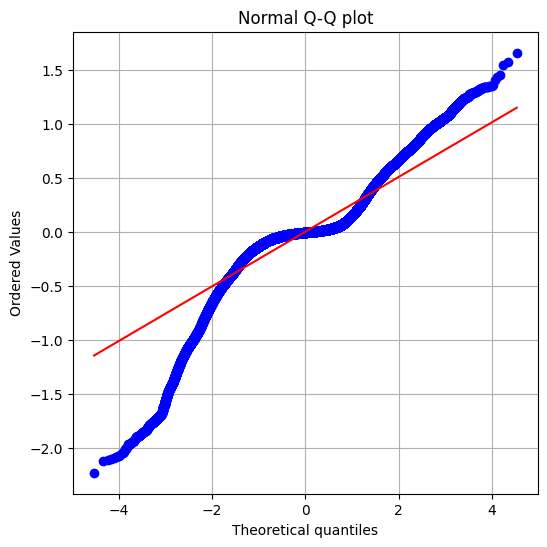

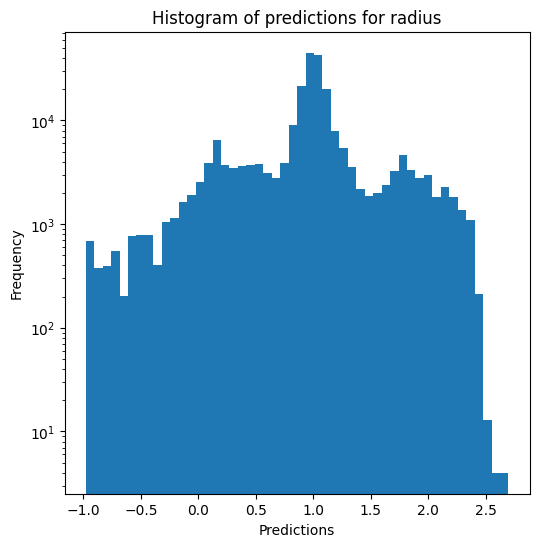

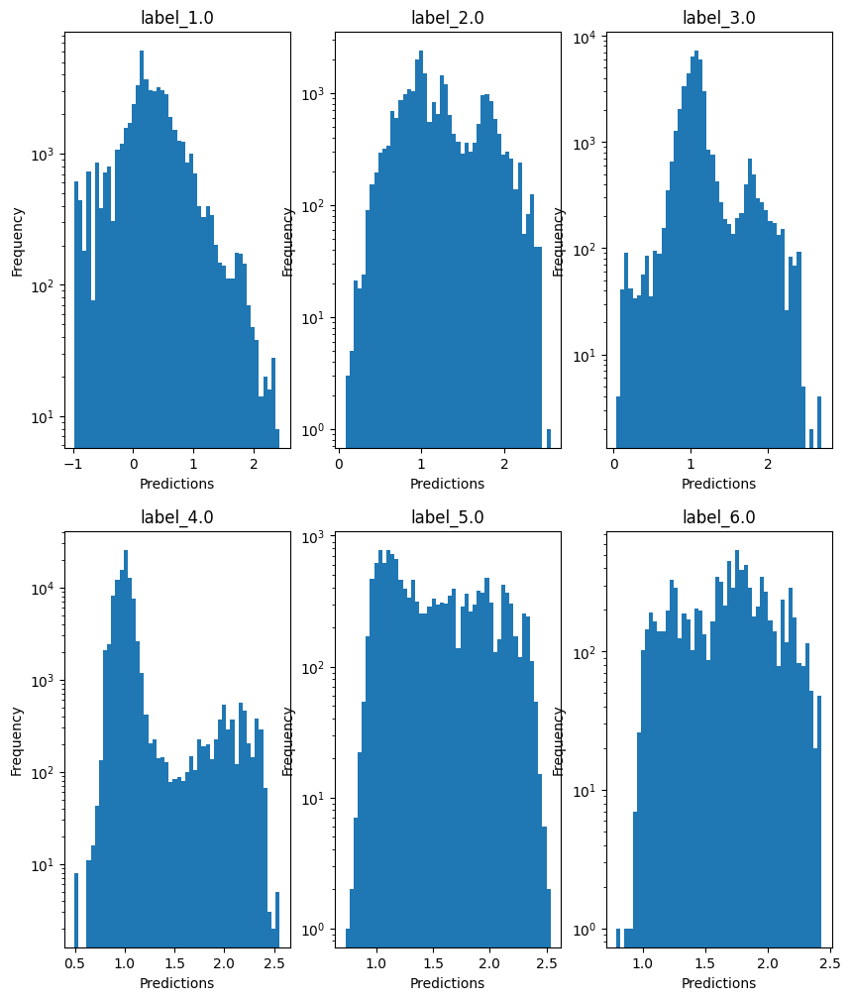

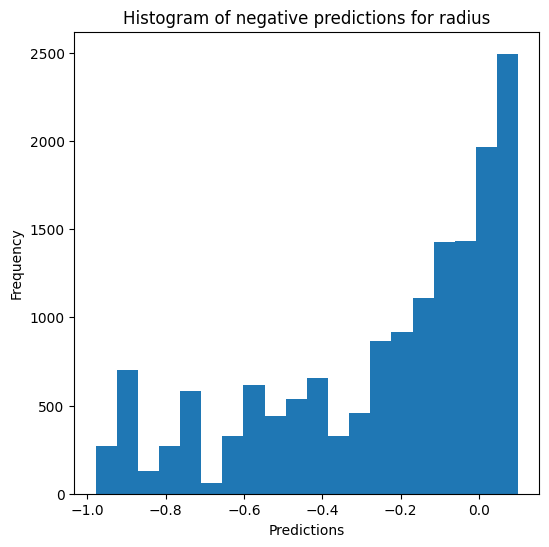

Saving predictions and results...


In [20]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [21]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_quantile train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07992137238805237
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08247500276215394
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.08133189299323701
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07580707467567412
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07777431453108179

Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.7158168450420492
  RMSE :  0.14214867174046955
  MAE :  0.09778946039490391
  MedAE :  0.06196838855419062
  CORR :  0.8576640668487423
  MAX_ER :  0.68337464314423
  Percentiles : 
    75th percentile :  0.13000153569283834
    90th percentile :  0.2299956920539572
    95th percentile :  0.3228780942793569
    99th percentile :  0.48364743021231843

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.18284761488134227
  RMSE :  0.1789043737354889
  MAE :  0.13650444541614207
  MedAE :  0.10636300966867474
  CORR :  0.4388090225962256
  MAX_ER :  0.6437044536456327
  Percentiles : 
    75th percentile :  0.18759313482435602
    90th percentile :  0.30582032093205896
    95th percentile :  0.38525603208452863
    99th percentile :  0.5005759815912918

T_eff results for the l

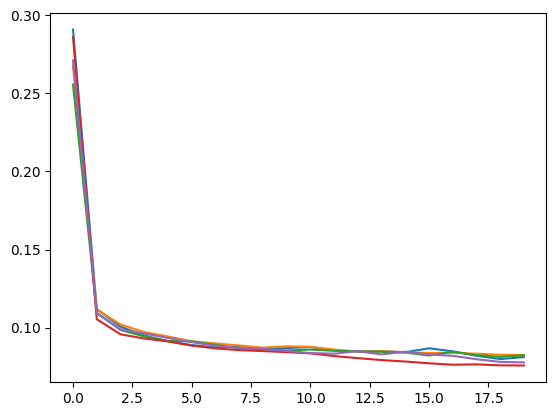

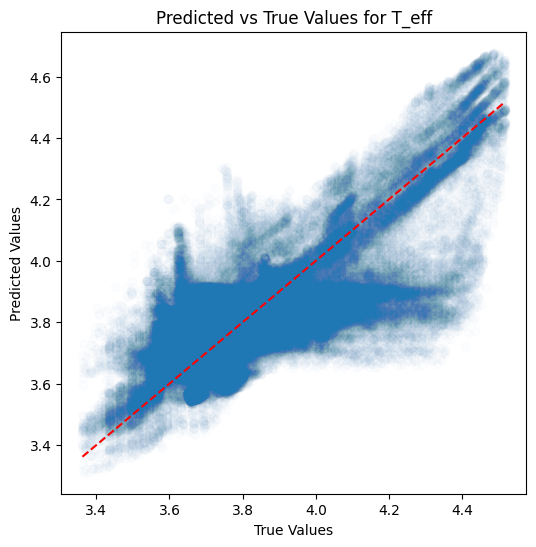

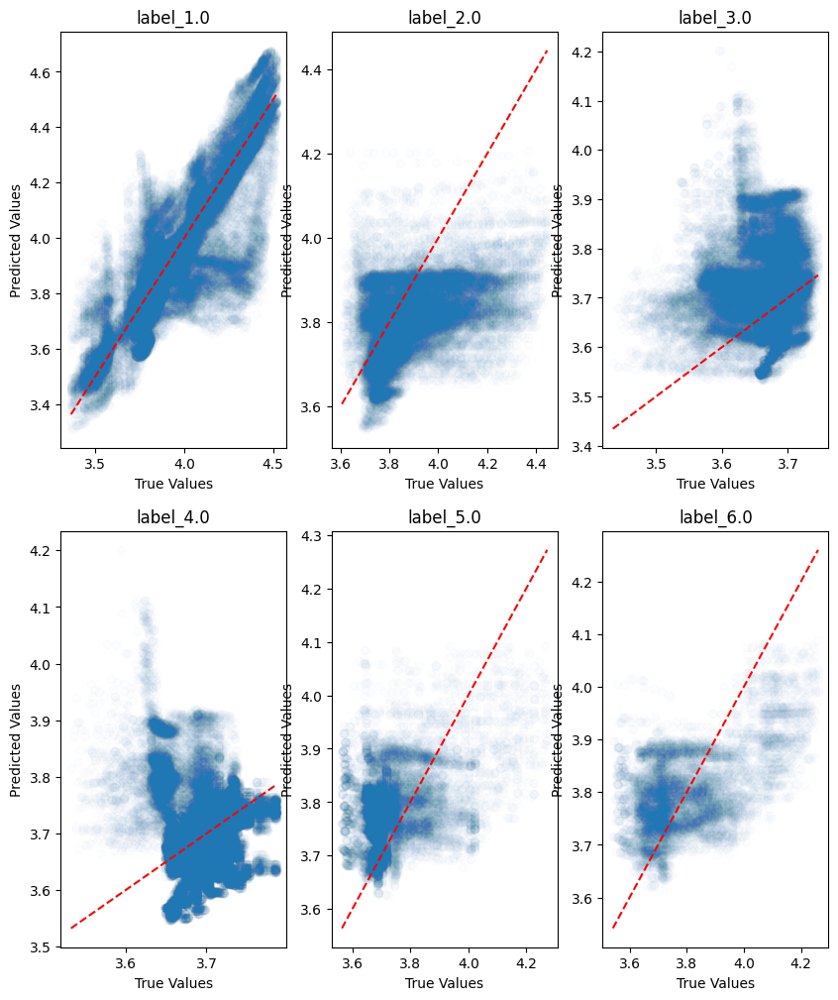

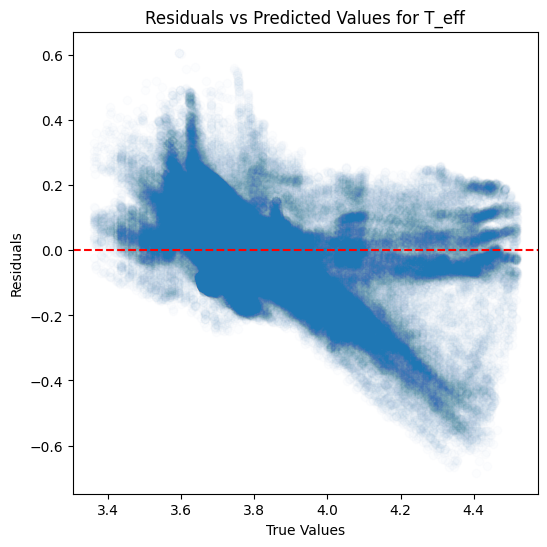

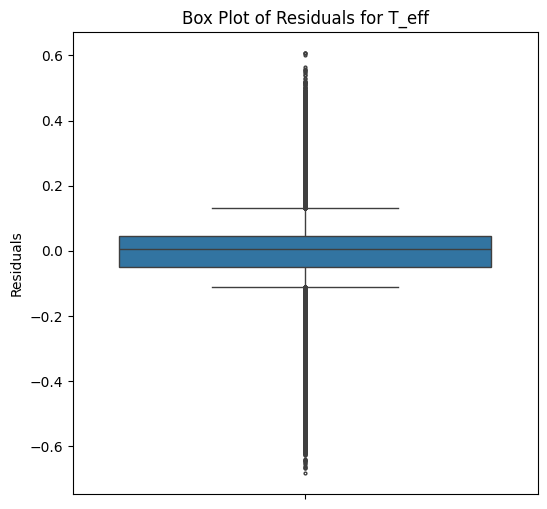

...

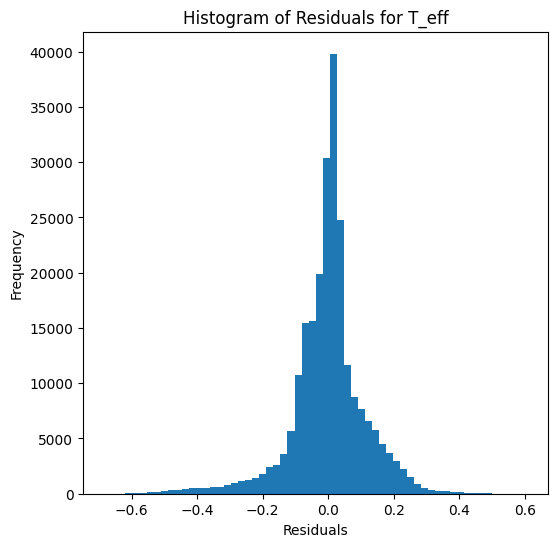

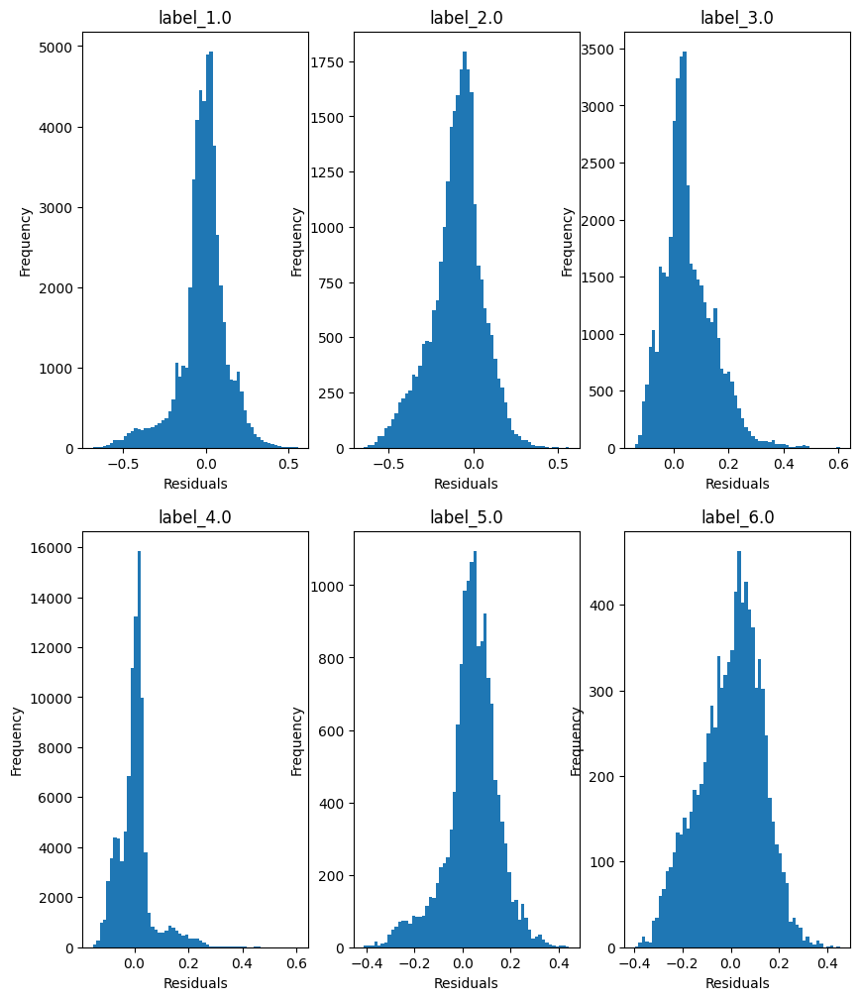

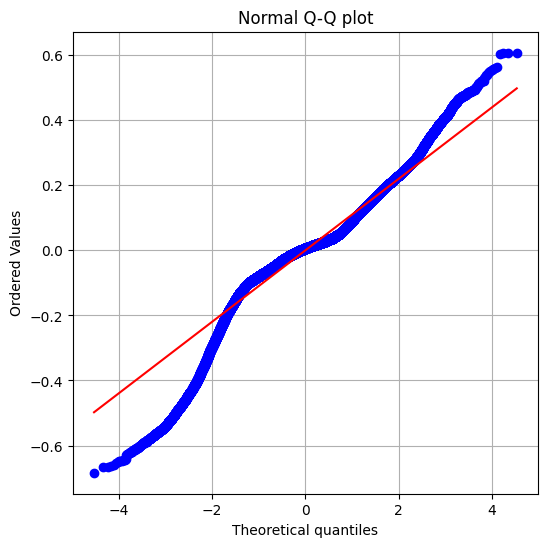

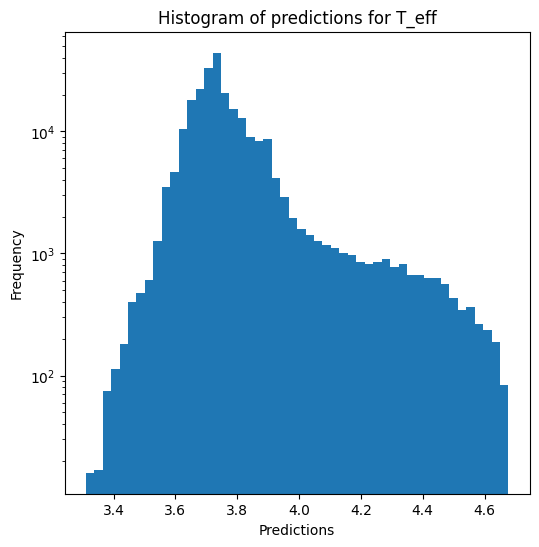

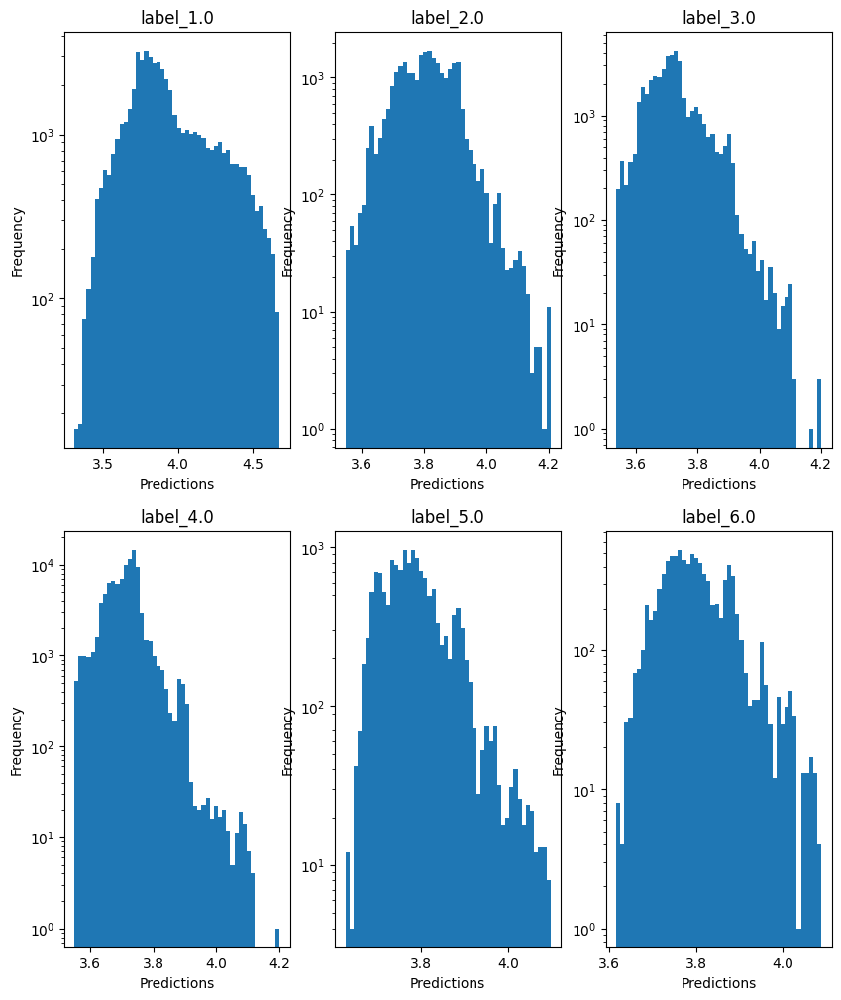

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -2.5401030020977045
  RMSE :  0.7505607306200038
  MAE :  0.4346748877691165
  MedAE :  0.10355656250923895
  CORR :  0.7208264748825957
  MAX_ER :  2.8153276502942033
  Percentiles : 
    75th percentile :  0.7003031558645227
    90th percentile :  1.507838420048905
    95th percentile :  1.8411864278138195
    99th percentile :  2.1460428263005933

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.3744179494549351
  RMSE :  0.9149288828137213
  MAE :  0.7524601819721253
  MedAE :  0.6991783571817591
  CORR :  0.6193195809203158
  MAX_ER :  2.58936232677637
  Percentiles : 
    75th percentile :  1.1403336353518911
    90th percentile :  1.451214957715507
    95th percentile :  1.6422997566275948
    99th percentile :  2.0893776896993943

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3

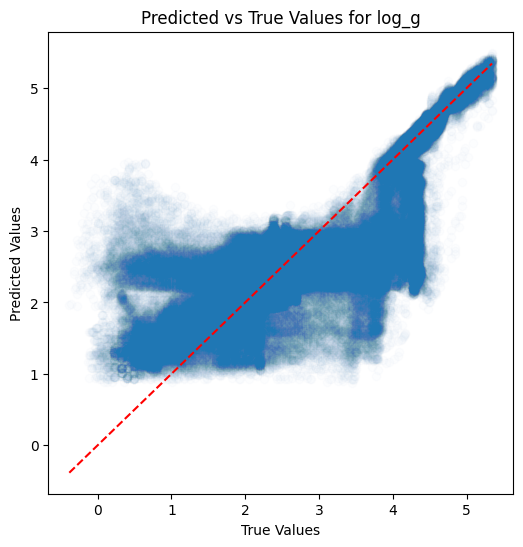

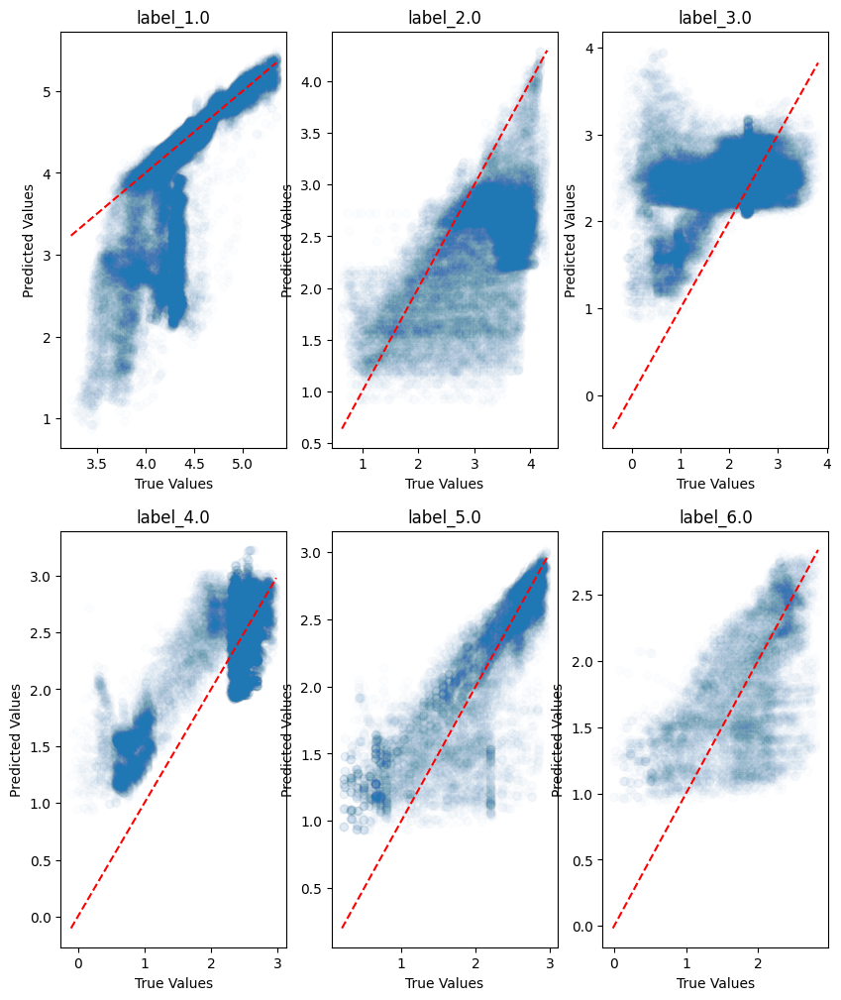

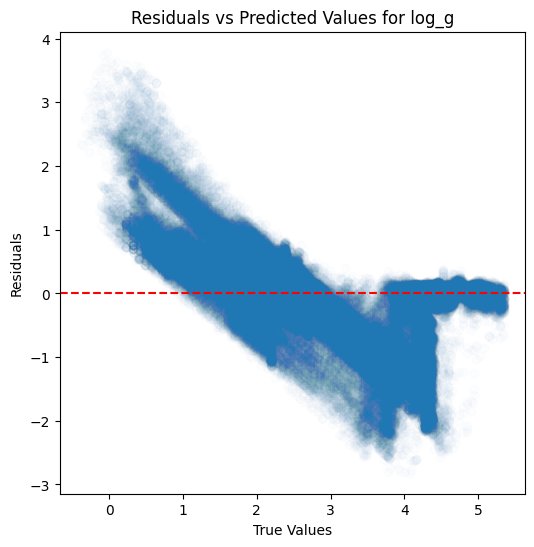

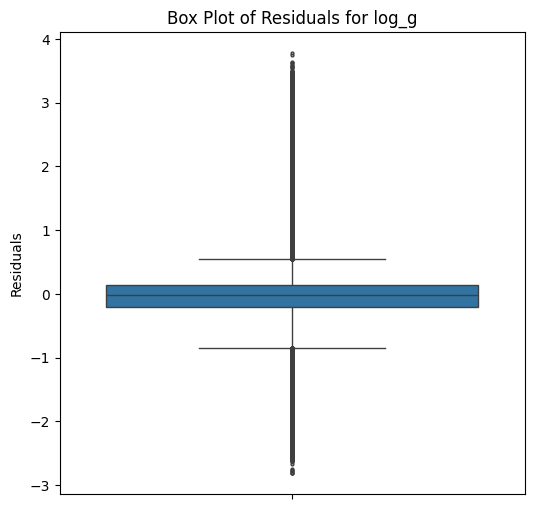

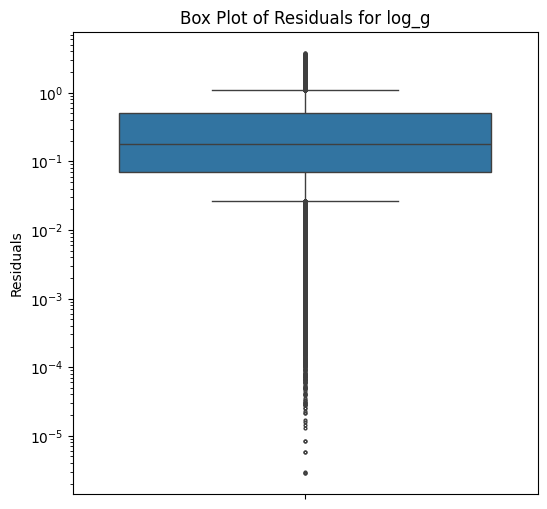

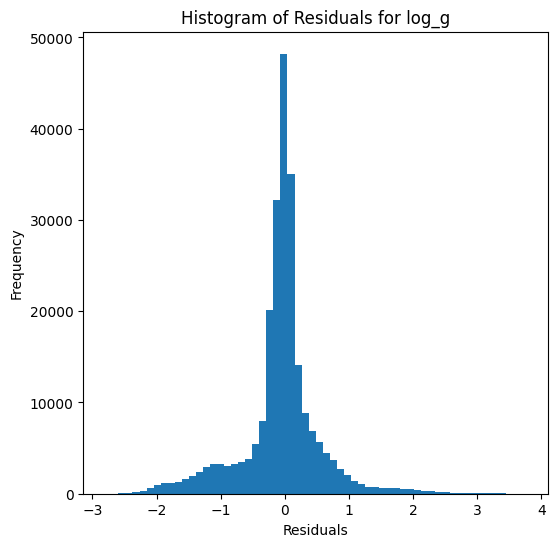

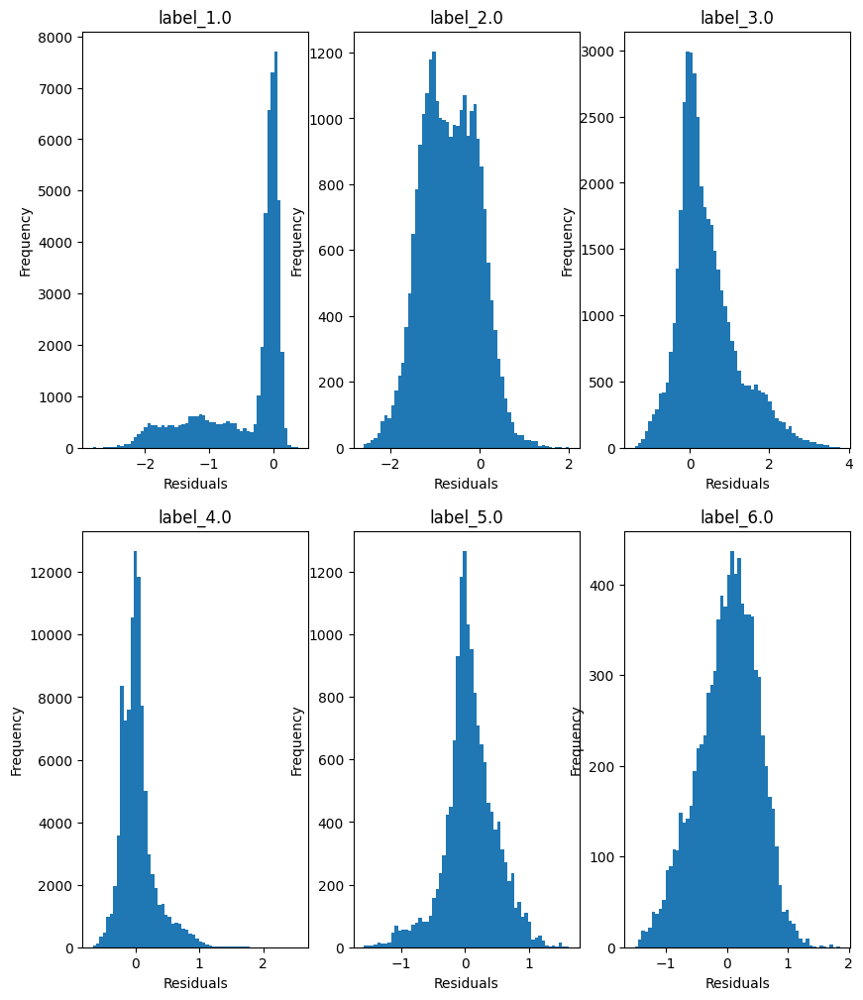

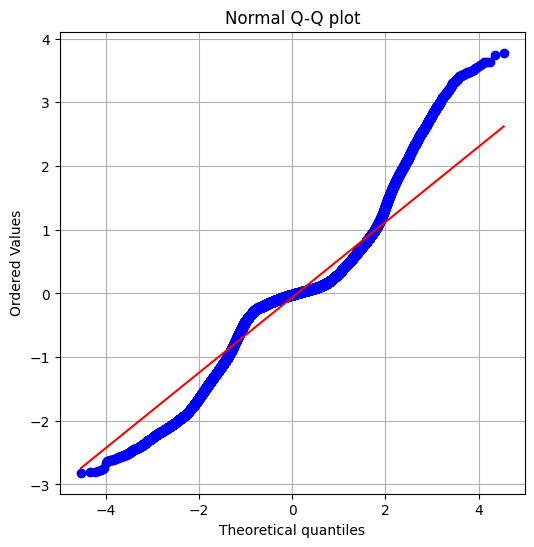

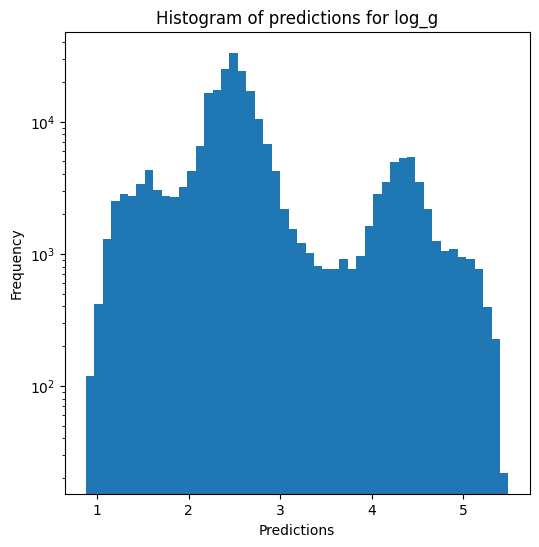

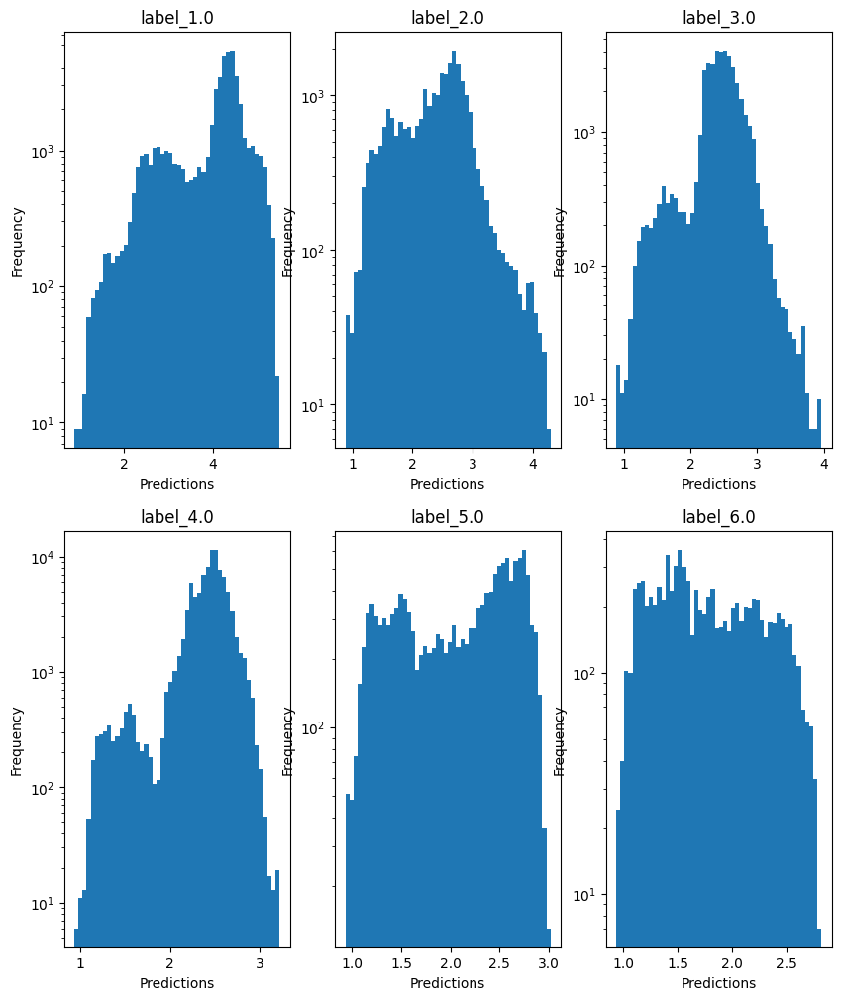


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.24804334713329645
  RMSE :  0.38678567215061227
  MAE :  0.24160088066025479
  MedAE :  0.09038470789341513
  CORR :  0.8033663175160286
  MAX_ER :  1.457623672827614
  Percentiles : 
    75th percentile :  0.375433079725708
    90th percentile :  0.7491181319423169
    95th percentile :  0.9329404724810453
    99th percentile :  1.105206906248853

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.650494230368666
  RMSE :  0.4644331848843257
  MAE :  0.3811531710058711
  MedAE :  0.3566957247495948
  CORR :  0.8066236711021859
  MAX_ER :  1.3367315632459045
  Percentiles : 
    75th percentile :  0.5751932718192665
    90th percentile :  0.7387985748256947
    95th percentile :  0.8372532828687885
    99th percentile :  1.0683853513477801

radius results for the label category with a va

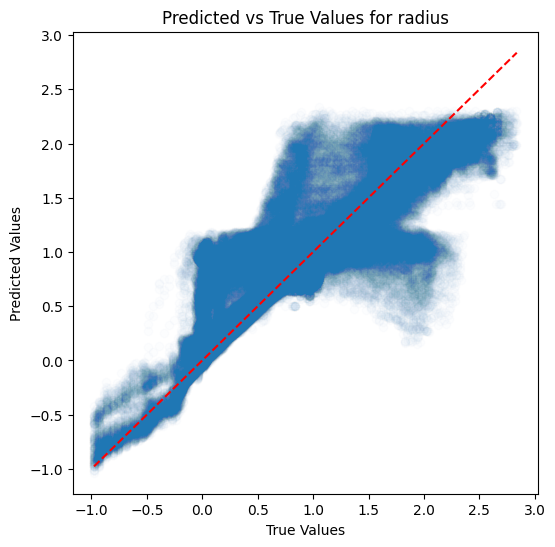

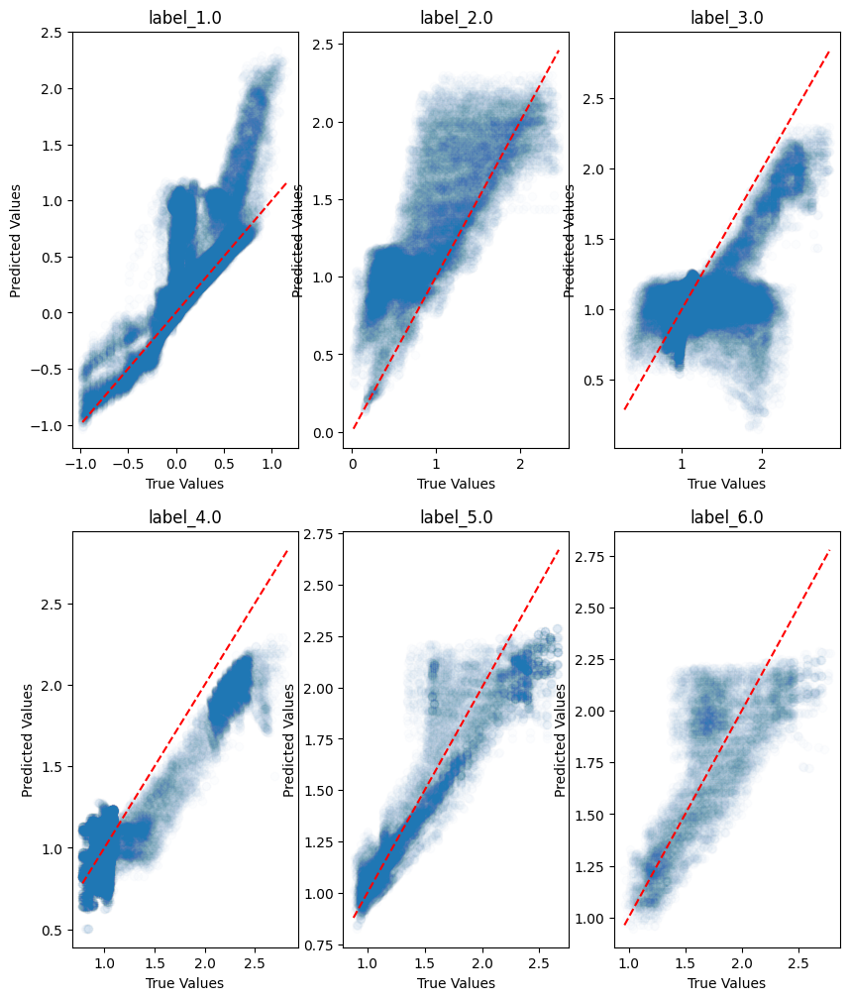

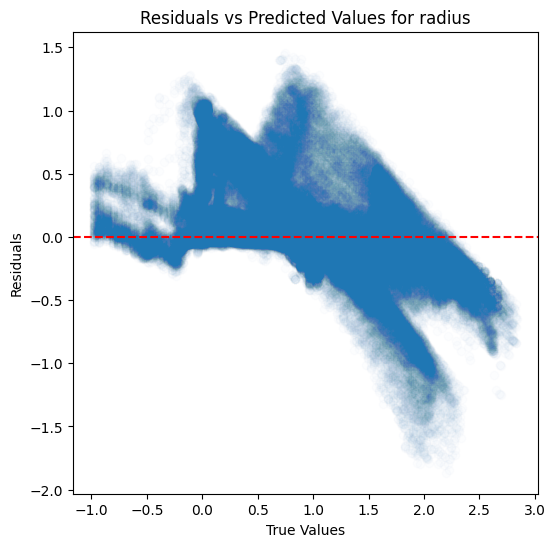

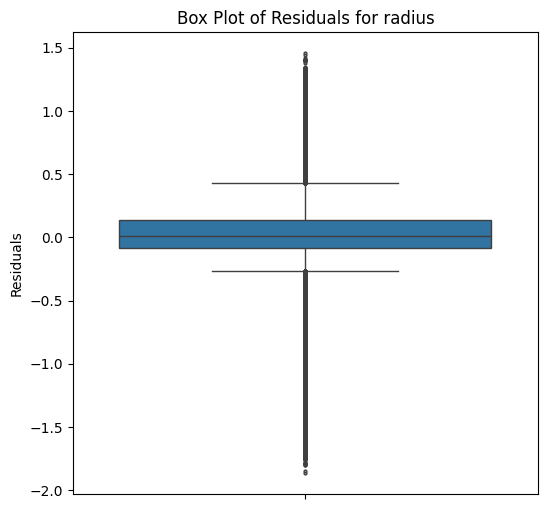

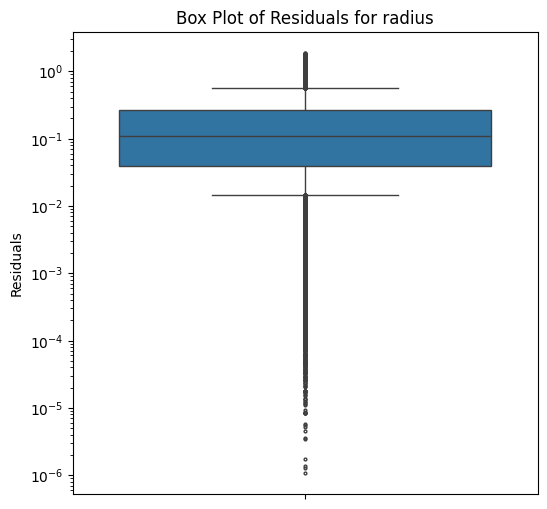

...

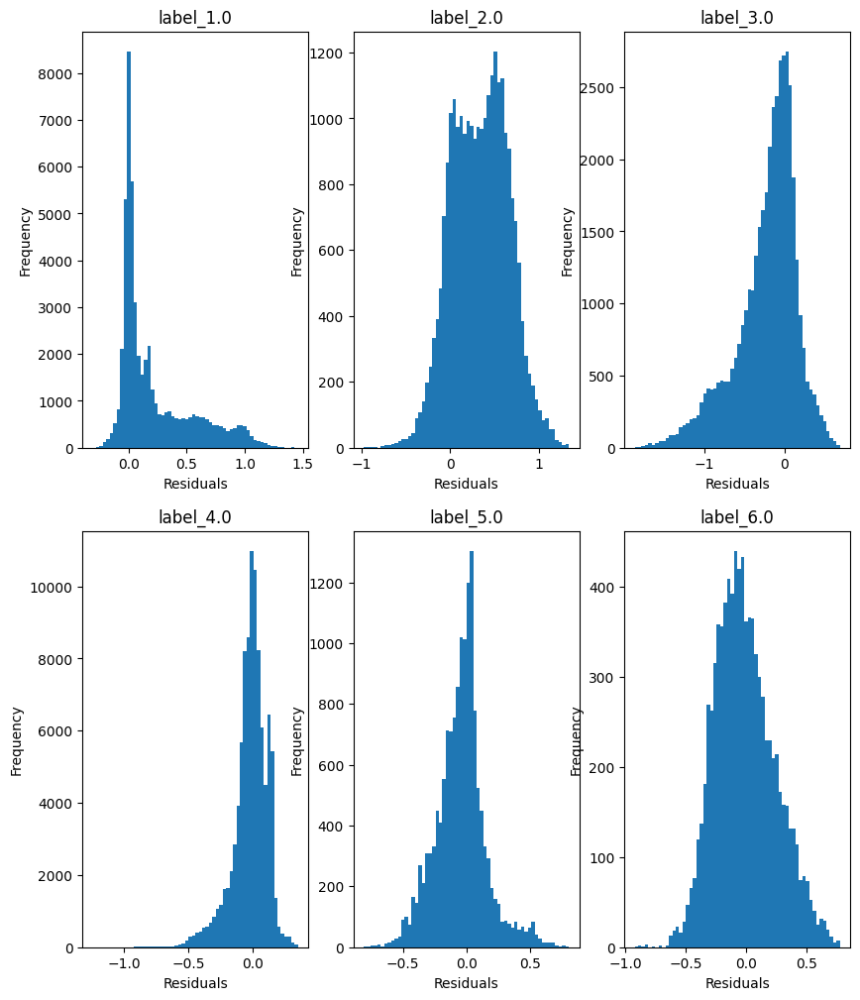

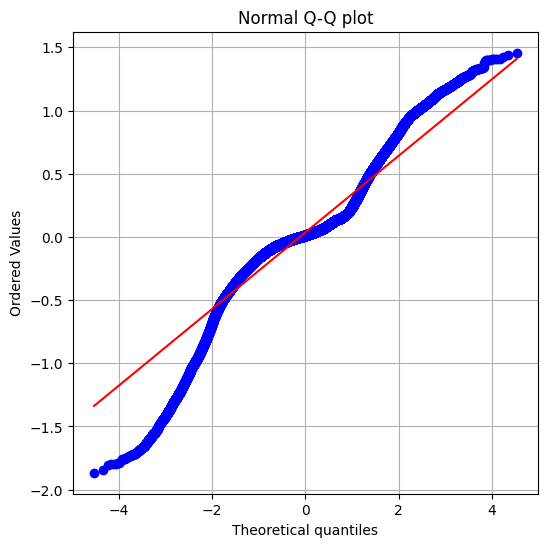

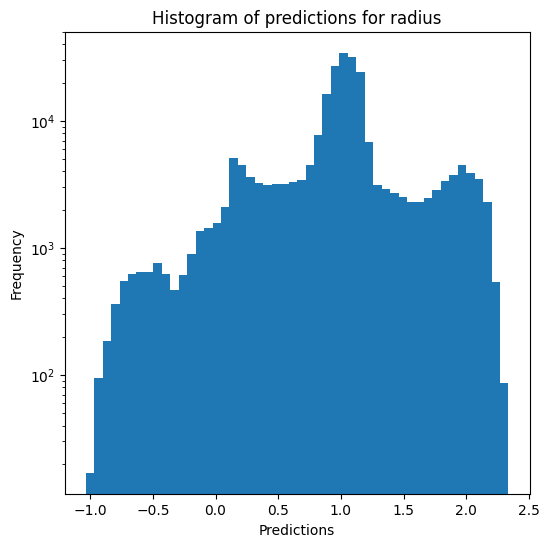

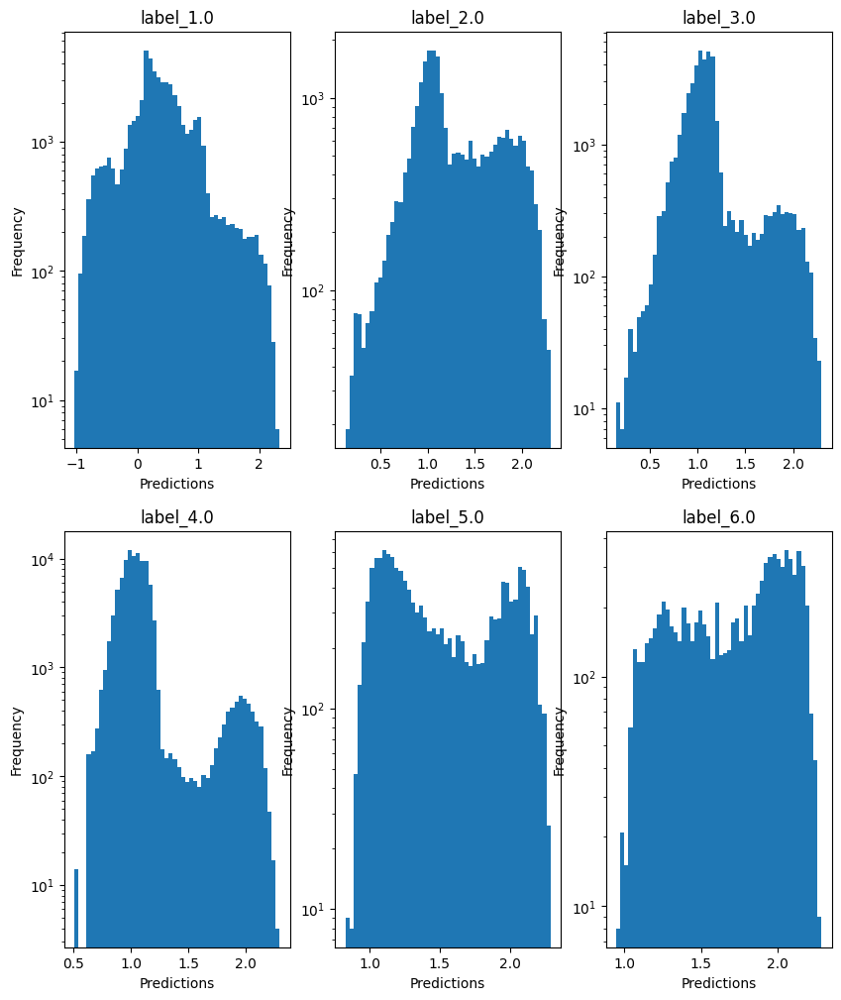

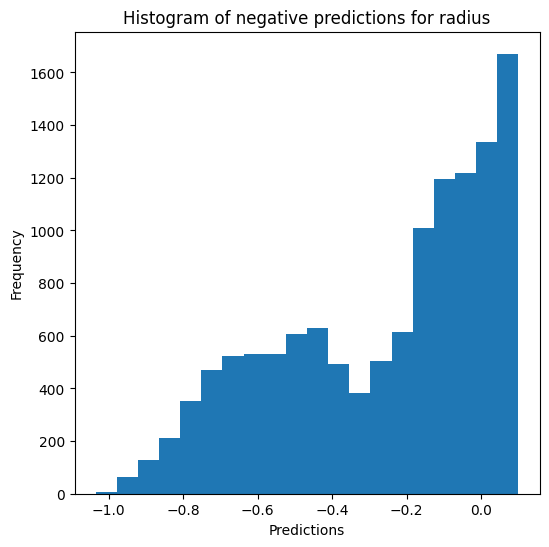

Saving predictions and results...


In [22]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon